# FDM CW1 Portfolio

## 1. Assignment 1 

During the Financial data modelling course, we acquired knowledge and experience using various time series modelling algorithms. We will implement the acquired knowledge of forecasting techniques on stock volume data from six companies. 
Volume is the number of shares of security traded during a given period. Generally, securities with higher daily volume are more liquid than those without since they are more active. Volume is an essential indicator in technical analysis because it measures the relative significance of a market move.

Investors show significant enthusiasm for the stock or asset when a market is experiencing an uptrend accompanied by rising and above-average trading volume. This heightened interest may result in increased buying activity and the potential for further price increases.

Six companies were selected of diverse sizes and scales to test and compare the modelling algorithms:

1. Apple Inc. (AAPL) - A big multinational technology company.

Apple is a multinational technology company renowned for its consumer electronics, software, and digital services. It is best known for its flagship products like the iPhone, iPad, Mac computers, and Apple Watch. Additionally, Apple's services, such as the App Store, iCloud, and Apple Music, contribute significantly to its revenue. The company's innovations, user-friendly interfaces, and strong brand loyalty have made it one of the most valuable companies globally.

2. Microsoft Corporation (MSFT) - Another large multinational technology company.

Microsoft is a global technology company known for its software products and services. It develops the widely used operating system, Windows, and the Office productivity suite. Additionally, Microsoft offers cloud services through Microsoft Azure, which has become a leading platform in the cloud computing market. The company is also involved in gaming with its Xbox console series.


3. Coca-Cola Company (KO) - A big multinational beverage company.

Coca-Cola is a well-known beverage company and one of the world's largest non-alcoholic beverage manufacturers. It is famous for its flagship product, Coca-Cola, a carbonated soft drink. The company's beverage portfolio includes other popular brands like Diet Coke, Sprite, Fanta, and Dasani Water.

4. Shopify Inc. (SHOP) - A growing e-commerce platform company.

Shopify is a rapidly growing e-commerce platform company based in Canada. It provides software solutions that enable businesses to set up and manage online stores. Shopify's platform offers tools for website design, payment processing, inventory management, and marketing. It has gained popularity among entrepreneurs and small-to-medium-sized businesses.

5. Beyond Meat, Inc. (BYND) - A company known for plant-based meat substitutes.

Beyond Meat is a food technology company known for its plant-based meat substitutes. It develops and manufactures a range of vegan meat products, including burgers, sausages, and ground meat alternatives. Beyond Meat aims to provide environmentally friendly and sustainable protein options in response to growing consumer demand for plant-based alternatives.

6. Okta, Inc. (OKTA) - Identity and Access Management Solutions - A smaller company specializing in identity and access management solutions.
Okta is a smaller technology company specializing in identity and access management solutions. It provides cloud-based services that help businesses manage user identities, authenticate users, and secure access to various applications and resources. Okta's solutions play a critical role in modern cybersecurity and data protection.

First, we will gather six real-world time-based data sets for these companies, put them into our representation of a time series
and plot each in at least one way.

[*********************100%***********************]  6 of 6 completed


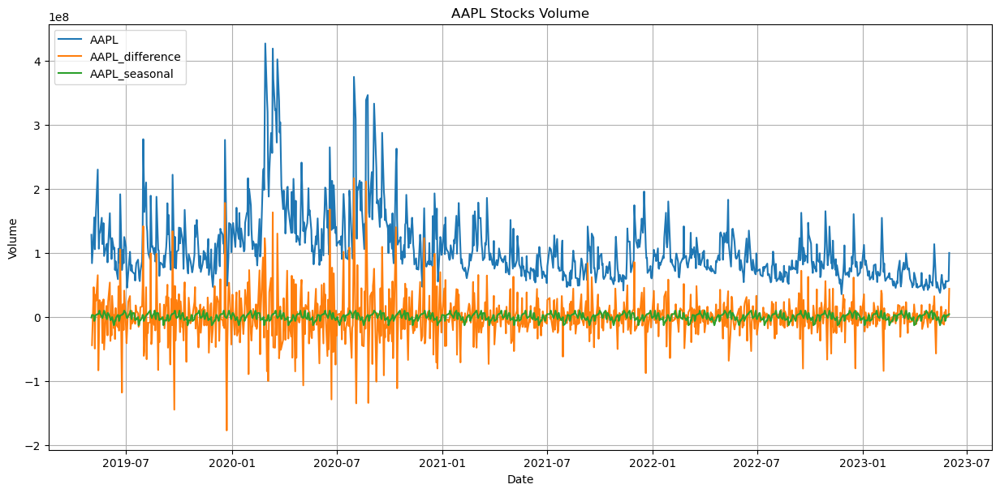

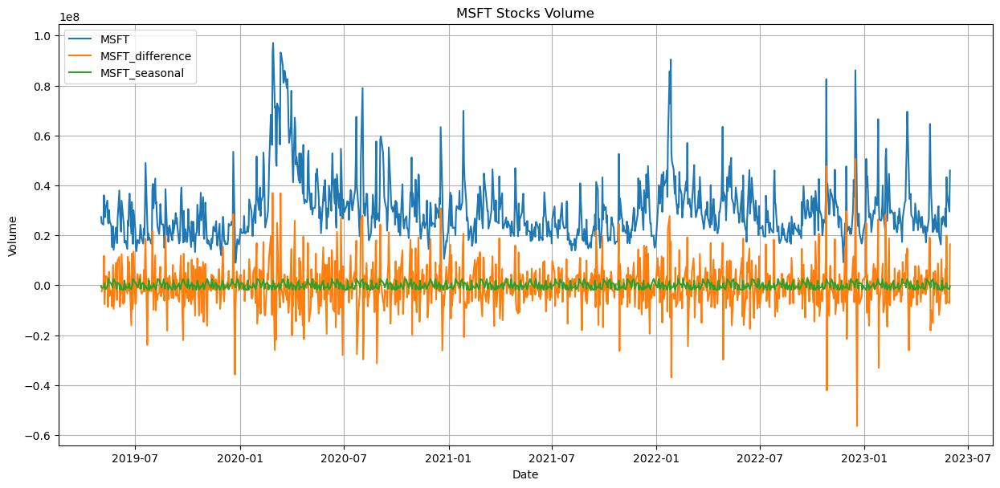

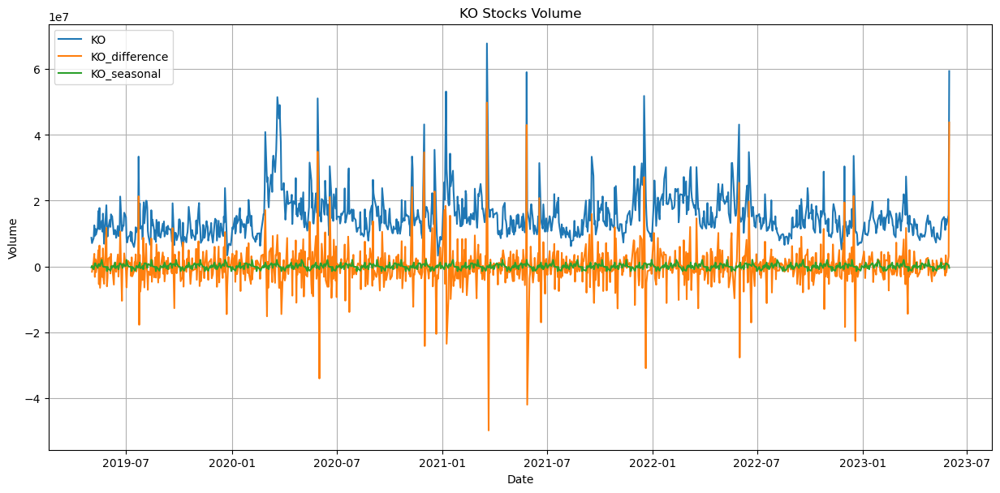

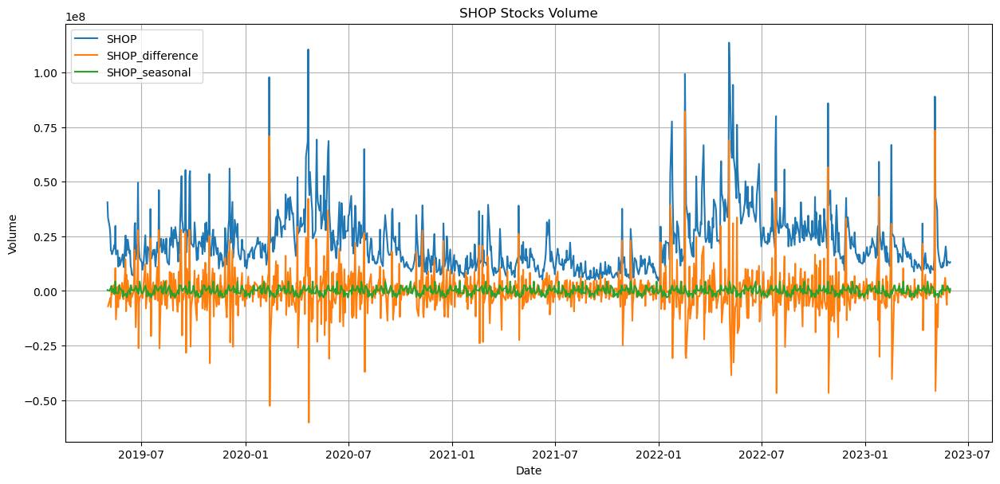

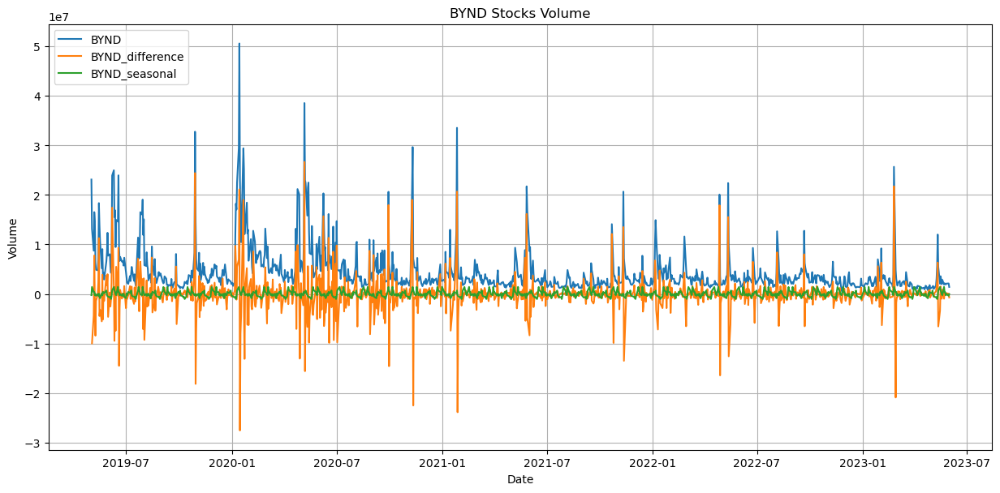

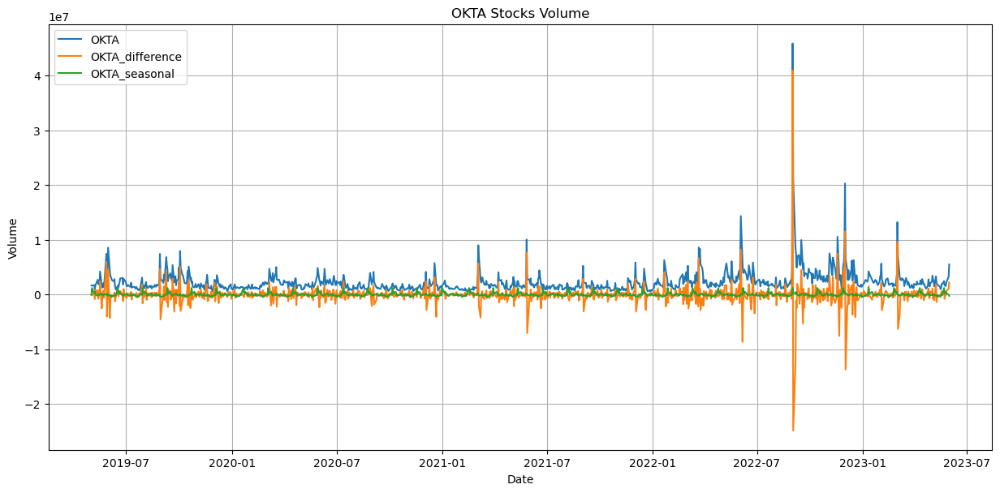

In [1]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
import numpy as np

# Define the symbols for the stocks you want to retrieve from Yahoo Finance
companies = ['AAPL', 'MSFT', 'KO','SHOP', 'BYND', 'OKTA']

# Retrieve data from Yahoo Finance for each company
data = yf.download(companies, start='2017-01-01', end='2023-06-01')['Volume']

# Create a time series representation using pandas DataFrame
time_series = pd.DataFrame(data)

time_series = time_series.dropna()

# Plot each time series
for comp in companies:
    
    #print(time_series[comp])
    
    time_series[f"{comp} Differences"] = time_series[comp] - time_series[comp].shift()
    
    # Perform seasonal decomposition
    result = seasonal_decompose(time_series[comp], model='additive', period=30)
    seasonal = result.seasonal
    
    # Create a new figure and plot the original time series, the differences series and the seasonality series
    plt.figure(figsize=(15, 15))
    plt.subplot(2, 1, 1)
    plt.plot(time_series.index, time_series[comp],label = f'{comp}')
    plt.plot(time_series.index, time_series[f"{comp} Differences"],label = f"{comp}_difference")
    plt.plot(time_series.index, seasonal,label=f"{comp}_seasonal")  
    plt.legend(loc="upper left")
    plt.title(f'{comp} Stocks Volume')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.grid(True)
    
   
    plt.show()
    
   


## 2. Assignment 2

During this topic, we have defined the notion of stationary data and pointed out that stationarity is great for predictability.
Stationary time series are easier to model because their statistical properties remain constant. This stability allows for using traditional statistical techniques and simplifies the modelling process, making forecasting more accurate and reliable. Time series models assume that future behaviour will resemble past behaviour, which holds better for stationary series.
In many time series modelling techniques, stationarity of the residuals (the difference between the observed and predicted values) is essential. Stationary residuals indicate that the model captures the underlying patterns in the data.
Stationary time series lead to stable and consistent model parameters.

We have learned about trends in data and discovered how we could use differences to tame trending behaviour, seasonal data and how to smooth the seasonality away to make seasonally adjusted data-reviewed logarithms. We demonstrated their use in making multiplicative data additive.

We will look for stationary patterns in the data. If none of our data is stationary, we will find stationary data and add it to our collection. 
We will implement differences, second differences, and relative differences for our datasets. 
We will take logs of any data that may be multiplicative.
And lastly, we will test if any of our data look seasonal and Perform seasonal adjustments to the seasonal data.


### 2.1. Find stationary data

We will check if any of the gathered data series are stationary. If not, we must find additional stationary data to implement differences, second differences, and relative differences methods. 
We will use the Augmented Dickey-Fuller (ADF) test to check if the data is stationary.


In [88]:
# Check for stationarity and add additional stationary data if needed
stationary_series = []

for series in companies:
    adf_test = adfuller(time_series[series])
    p_value = adf_test[1]
    
    if p_value < 0.05:
        stationary_series.append(series)

print(stationary_series)


['AAPL', 'MSFT', 'KO', 'SHOP', 'BYND', 'OKTA']


Luckily, all our data is stationary, so we do not need to find any additional data. 

###  2.2. Implement differences, second differences, and relative differences

We will now move forward and implement differences, second differences, and relative differences: For the trending datasets, we will calculate the first difference, second difference, and relative difference of the stock volume values.

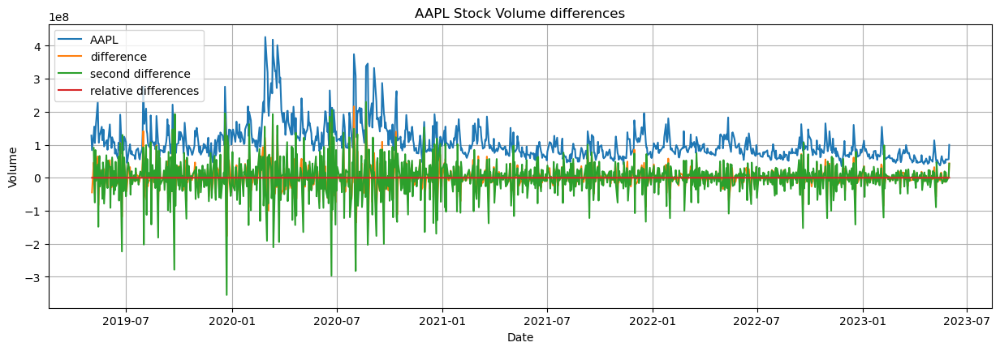

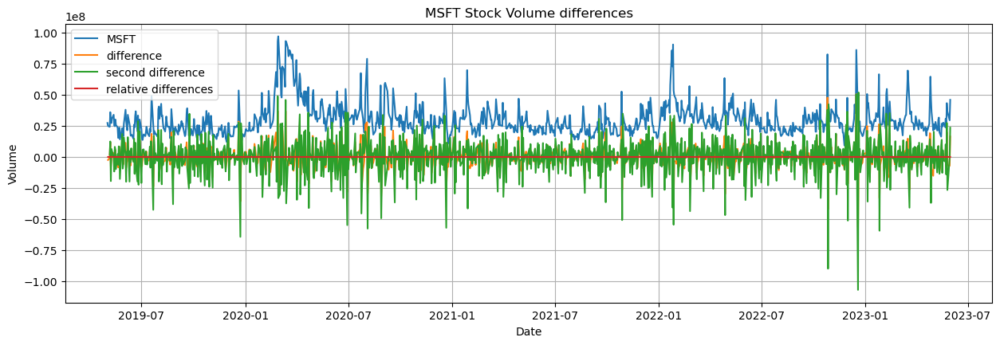

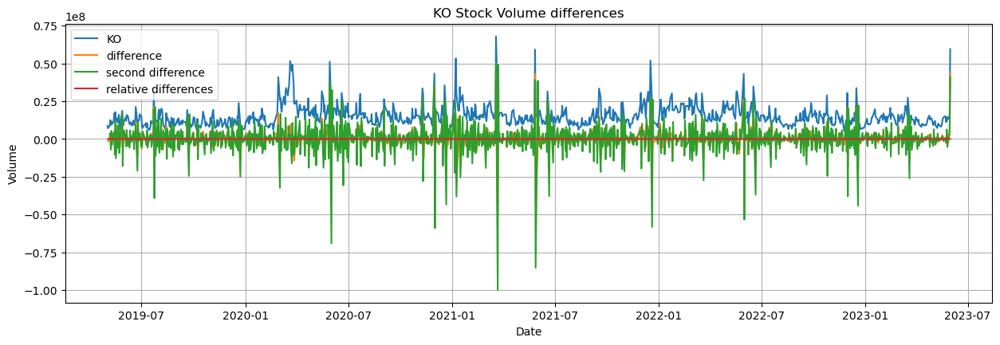

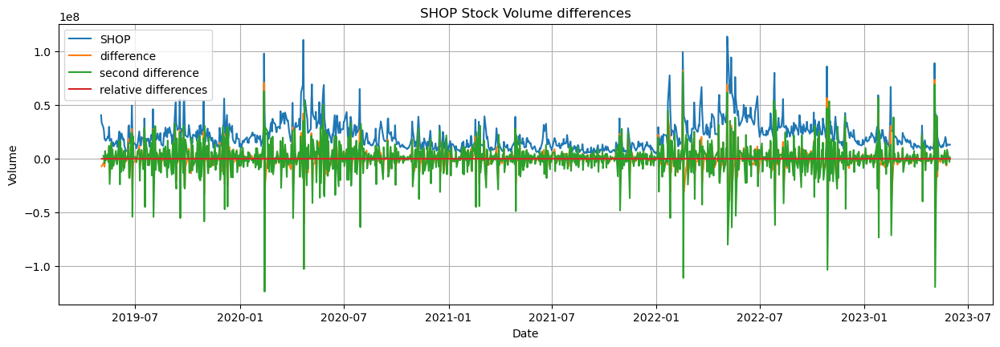

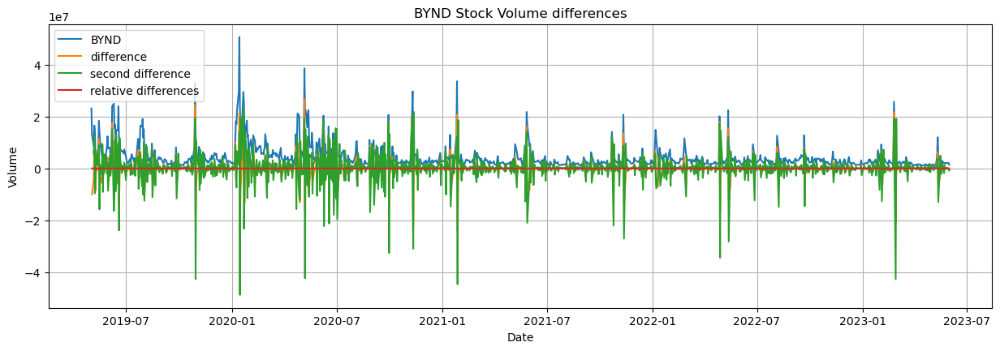

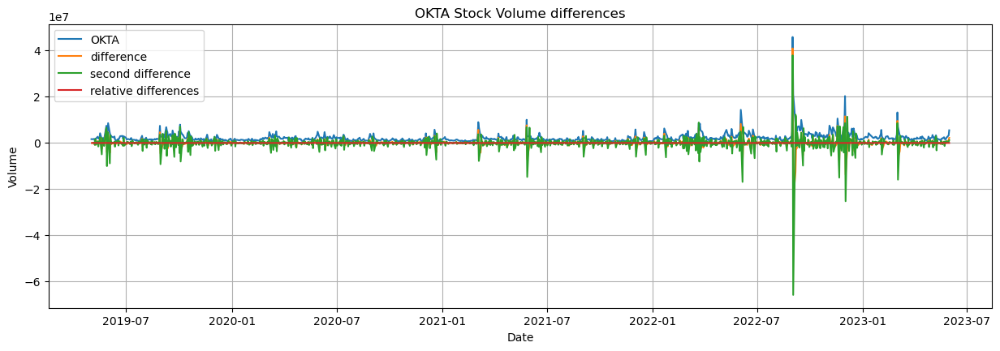

In [2]:

# Implement differences, second differences, and relative differences for trending datasets
trending_companies = companies

for comp in trending_companies:
    # First difference
    time_series[f'{comp}_diff1'] = time_series[comp].diff()

    # Second difference
    time_series[f'{comp}_diff2'] = time_series[comp].diff().diff()

    # Relative difference
    time_series[f'{comp}_rel_diff'] = time_series[comp].diff()/time_series[comp].values 
    #(time_series[comp] - time_series[comp].shift(1))/time_series[comp]


    plt.figure(figsize=(15, 10))
    plt.subplot(2, 1, 1)
    plt.plot(time_series.index, time_series[comp],label = comp)
    plt.plot(time_series.index, time_series[f'{comp}_diff1'],label = "difference")
    plt.plot(time_series.index, time_series[f'{comp}_diff2'],label = "second difference")
    plt.plot(time_series.index, time_series[f'{comp}_rel_diff'],label = "relative differences")
    plt.title(f'{comp} Stock Volume differences')
    plt.legend(loc="upper left")
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.grid(True)
    
   
    plt.show()    
    
 
    
    



We can see that for the all-time series, the difference and second difference are similar and almost identical. 
In addition, for all data series, the relative difference is zero.

If the relative difference of a time series shift is zero, there is no change or movement in the time series values between the two periods being compared. In other words, the time series has remained constant or stable during that shift.

The relative difference is calculated as the percentage change in the time series values when comparing two time periods. If the relative difference is zero, the time series values are the same before and after the shift. This situation is also known as "no change" or "no movement" in the time series data.

This situation has positive and negative insights. 
For instance, a company with a stock volume which exhibits zero relative difference ensures stability and predictability. Consistent stock volume can instil market confidence in the company. It suggests a steady demand for the stock, which may attract more investors and lead to improved liquidity.
A lack of significant fluctuations in stock volume can create a smoother and more efficient trading environment. This tool especially benefits larger investors who prefer stable and predictable conditions for executing trades.

On the other hand, a zero relative difference in stock volume may indicate limited growth opportunities for the company. 
A lack of significant changes in trading activity might suggest that the stock is not attracting new investors or experiencing increased market interest.


### 2.3. Find multiplicativity using logs 


In a multiplicative relationship, the variations in the dependent variable are proportional to the individual effects of the independent variables. In this case, the changes in the dependent variable are scaled by the changes in the independent variables. 

Understanding whether the relationship is additive or multiplicative is crucial for several reasons.
The choice of modelling technique depends on the relationship between the variables. If the connection is multiplicative, modelling approaches that consider multiplicative effects, such as exponential smoothing or multiplicative ARIMA models, may be more appropriate. On the other hand, additive relationships are better suited for additive models like additive ARIMA or additive exponential smoothing.

Forecast Accuracy changes when using an inappropriate modelling approach for the data can lead to inaccurate forecasts. Choosing the correct model based on the nature of the relationship ensures better forecast accuracy.

Differentiating between additive and multiplicative relationships can also help interpret the model results and understand the underlying dynamics of the time series, which either eases or complicates model interpretability.

In practice, identifying whether the relationship is additive or multiplicative often involves visual inspection of the data or performing statistical tests. Time series decomposition techniques, like additive and multiplicative decomposition, can also help identify the presence of seasonality and trend patterns that may indicate the nature of the relationship.

Overall, looking for multiplicativity in the data is a crucial step in time series analysis and forecasting to ensure that the selected modelling approach is suitable for the specific characteristics of the data.
We can identify an additive or multiplicative time series from its variation. If the magnitude of the seasonal component changes with time, then the series is multiplicative. Otherwise, the series is additive.

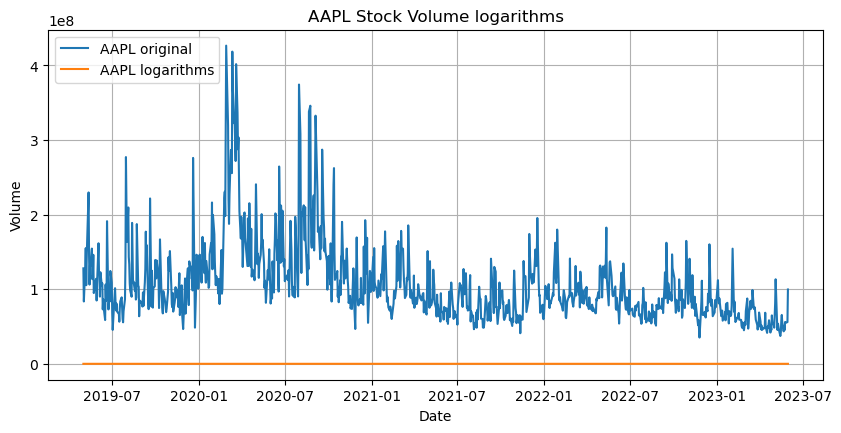

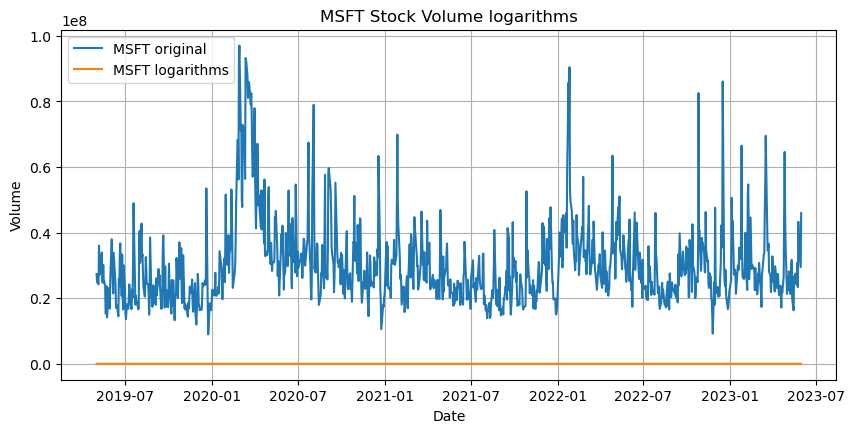

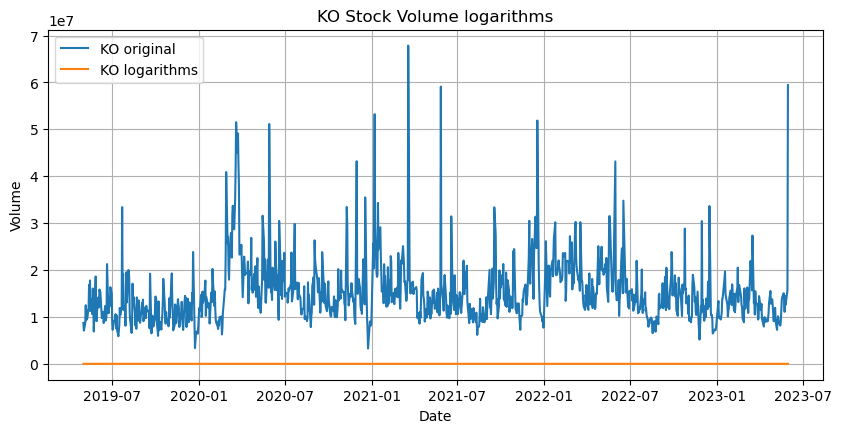

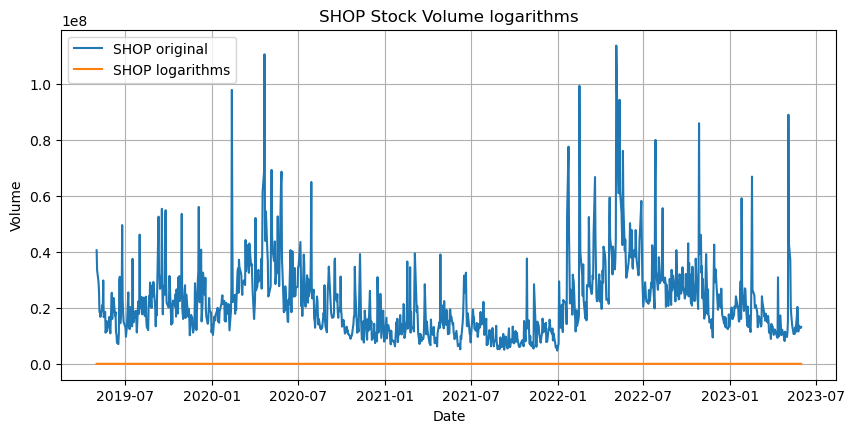

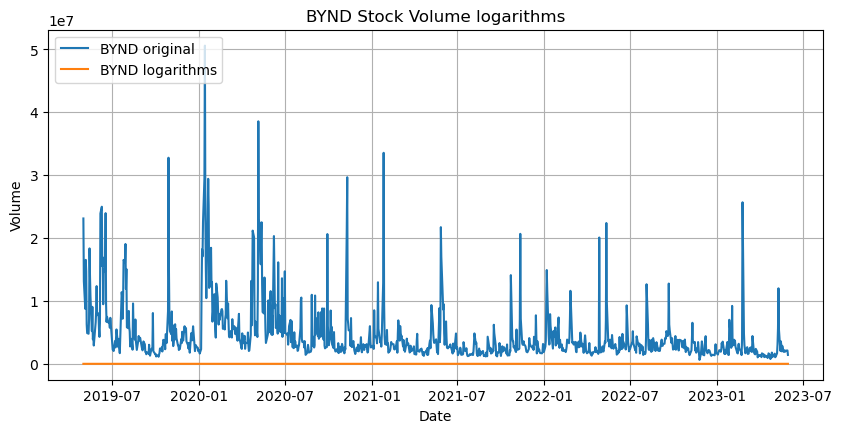

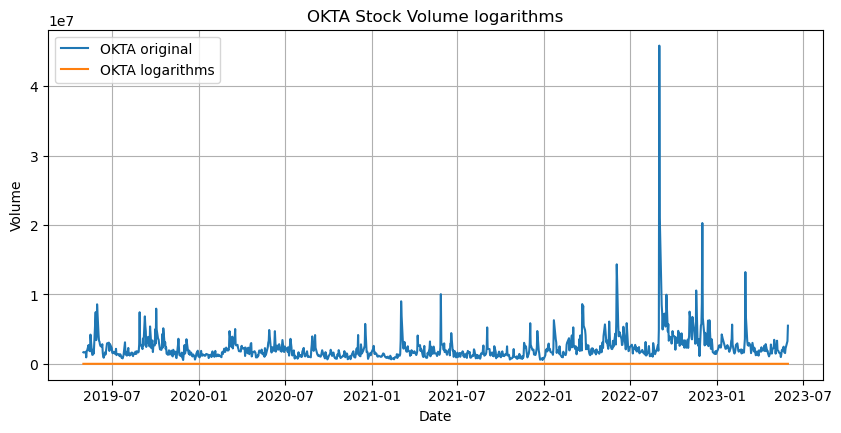

In [3]:
# The multiplicative models vary in frequency and amplitude over time.

for comp in companies:
    time_series[f'{comp}_log'] = time_series[comp].apply(lambda x: np.log(x))
    
    #print(time_series[f'{comp}_log'])
    
    plt.figure(figsize=(10, 10))
    plt.subplot(2, 1, 1)
    plt.plot(time_series.index, time_series[comp],label = f"{comp} original")
    plt.plot(time_series.index, time_series[f'{comp}_log'],label = f"{comp} logarithms")
    plt.title(f'{comp} Stock Volume logarithms')
    plt.legend(loc="upper left")
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.grid(True)
    

Another approach for finding multiplicativity is to perform the Box-Cox transformation to stabilize the variance. The returned lambda value indicates the type of transformation used.

If the lambda value is greater than 1, it suggests that the series is likely to be multiplicative. Otherwise, if the lambda value is close to 1 or less than 1, it indicates that the series is not likely to be multiplicative.

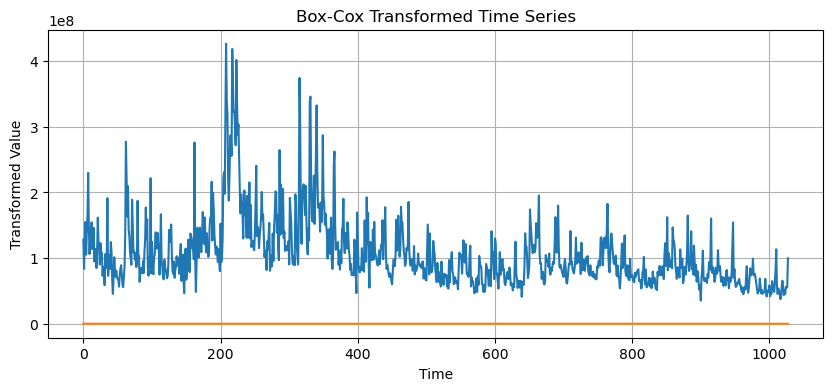

The series is likely not to be multiplicative.


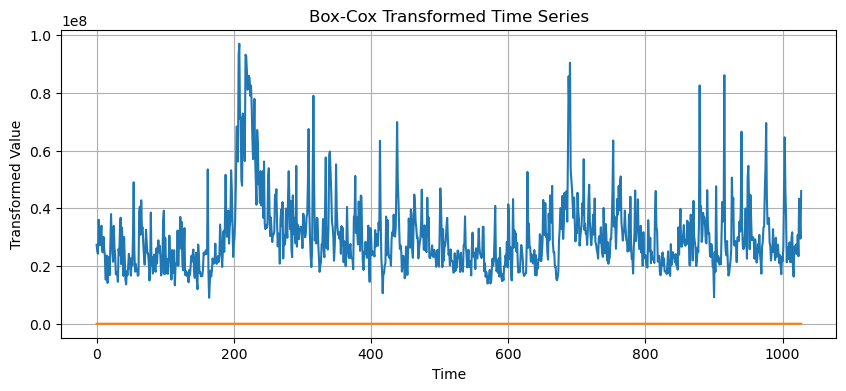

The series is likely not to be multiplicative.


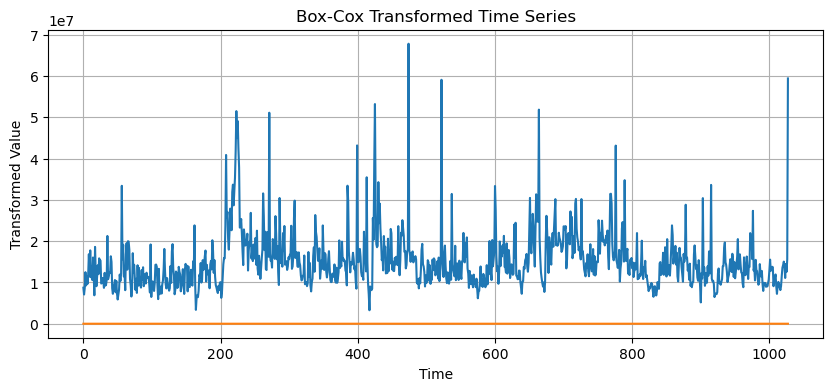

The series is likely not to be multiplicative.


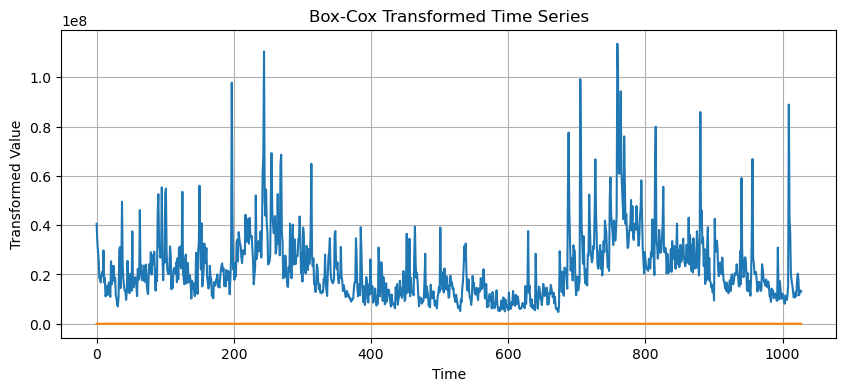

The series is likely not to be multiplicative.


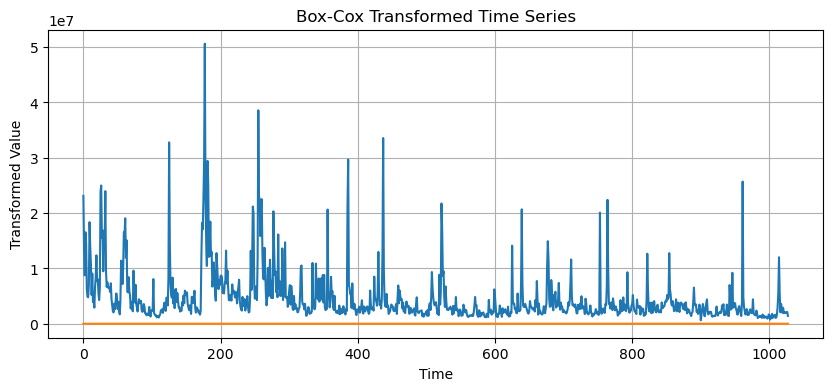

The series is likely not to be multiplicative.


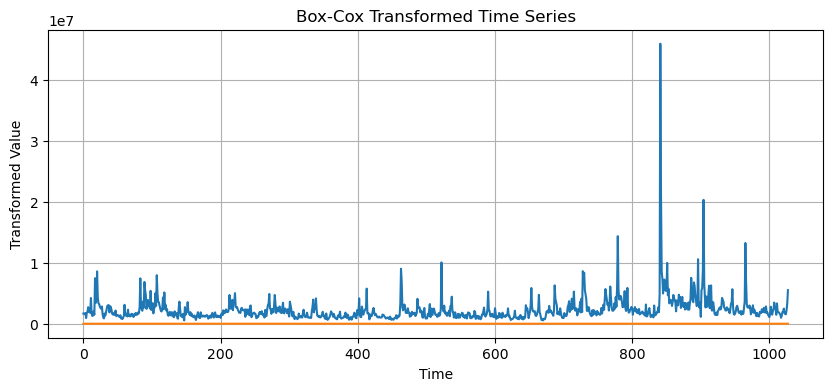

The series is likely not to be multiplicative.


In [91]:
from scipy.stats import boxcox
    
multiplicative_series = []    
for comp in companies:
    # Apply the Box-Cox transformation to the data
    transformed_data, lambda_value = boxcox(time_series[comp])

    # Plot the transformed time series
    plt.figure(figsize=(10, 4))
    plt.plot(np.arange(len(time_series[comp])), time_series[comp])
    plt.plot(np.arange(len(transformed_data)), transformed_data)
    plt.title('Box-Cox Transformed Time Series')
    plt.xlabel('Time')
    plt.ylabel('Transformed Value')
    plt.grid(True)
    plt.show()

    # Determine if the series is multiplicative based on the lambda value
    if lambda_value > 1:
        print("The series is likely to be multiplicative.")
        multiplicative_series.append(comp)
        
    else:
        print("The series is likely not to be multiplicative.")

In [92]:
multiplicative_series

[]

As we can see, none of the series we found is multiplicative since the series log is always zero.
An additive data series exhibits constant changes in the data across all levels. 
On the one hand, additive data series are relatively straightforward to model and interpret. The patterns and trends in the data remain consistent, making it easier to apply traditional statistical techniques and time series models. Additive seasonality means that the seasonal fluctuations remain constant across different levels of the time series. This stability allows for more accurate seasonal adjustments in forecasting. Additive time series makes identifying external factors' direct effects or influences on the data easier. For example, certain marketing campaigns or seasonal events may have a fixed additive impact on sales.
On the other hand, additive models may not capture complex interactions or nonlinear relationships in the data. In cases where the relationships between variables are multiplicative, an additive model may result in less accurate predictions.
An additive model may not adequately represent the pattern if the data exhibits exponential growth or decay. Multiplicative models are more suitable for capturing exponential trends.
Additive models can be sensitive to outliers, especially if the outliers have a constant additive impact on the data. This sensitivity may lead to less robust forecasts in the presence of extreme values.
Stocks volume data that exhibits an additive pattern means that the changes in trading volume are relatively constant and consistent across different levels of the time series. This suggests that the fluctuations in volume are relatively fixed and do not depend on the overall trading activity of the company. Additive patterns can be beneficial in providing interpretable insights into the direct effects of certain events or factors on trading volume.

Suppose the stock volume data shows a consistent additive pattern. In that case, a simpler additive model like ARIMA (Autoregressive Integrated Moving Average) may be more appropriate for forecasting and trend analysis.


### 2.4. Explore seasonality in the data

The following code will try to find a seasonal pattern in the data and perform seasonal adjustments where appropriate. 

In [94]:
# Check for seasonality and perform seasonal adjustment
seasonal_symbols = []

for comp in companies:
    result = seasonal_decompose(time_series[comp], model='additive', period=30)
    seasonal = result.seasonal

    if seasonal.var() > 0:
        seasonal_symbols.append(comp)
        print(f'{comp} data is seasonal')

#if len(seasonal_symbols) == 0:
#    # Add seasonal data to the dataframe
#    additional_seasonal_data = yf.download(['^N225'], start='2017-01-01', end='2023-01-01')['Adj Close']
#    time_series['^N225'] = additional_seasonal_data
#    additional_seasonal_data.plot()

for comp in companies:
    # Perform seasonal adjustment on at least one time series
    if len(seasonal_symbols) > 0:
        symbol = seasonal_symbols[0]
        result = seasonal_decompose(time_series[comp], model='additive', period=30)
        seasonal_adjusted = time_series[comp] - result.seasonal
        time_series[f'{comp}_seasonal_adj'] = seasonal_adjusted


AAPL data is seasonal
MSFT data is seasonal
KO data is seasonal
SHOP data is seasonal
BYND data is seasonal
OKTA data is seasonal


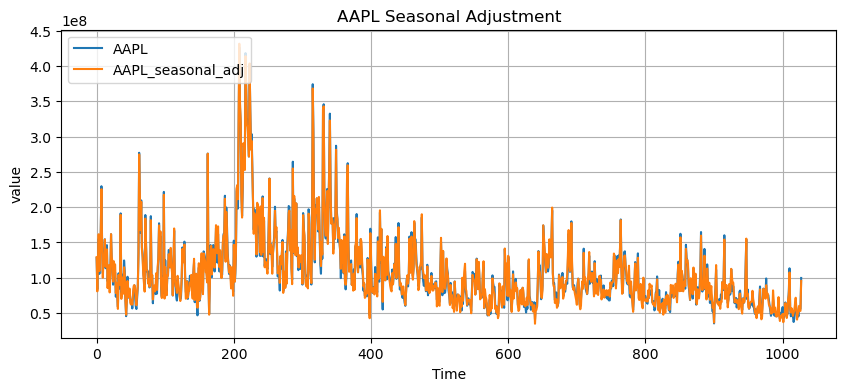

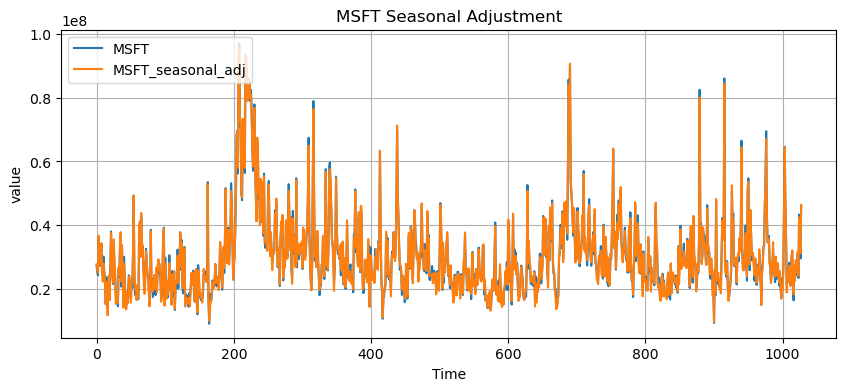

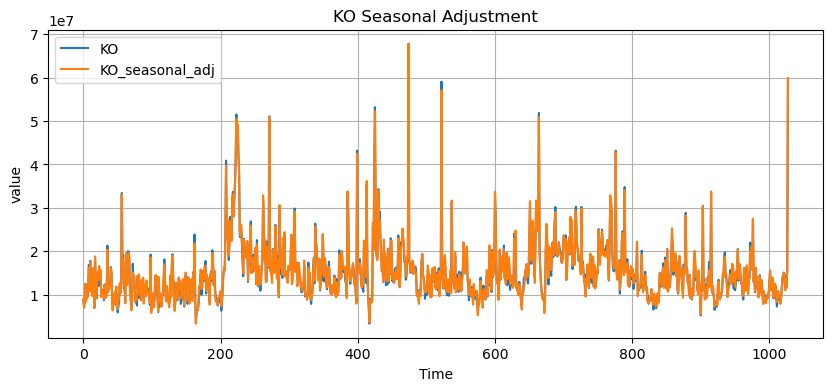

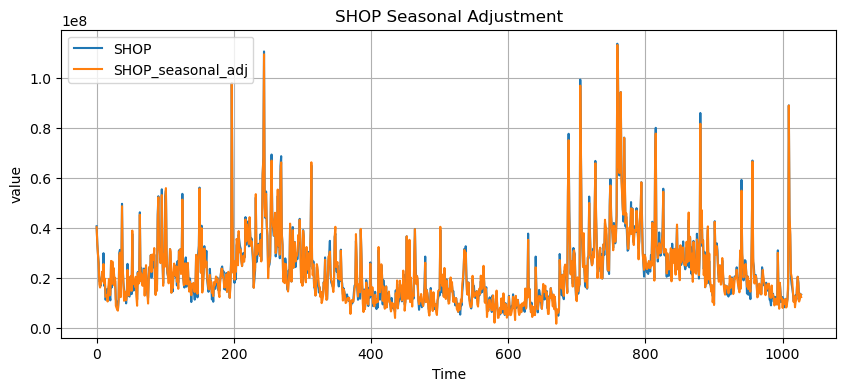

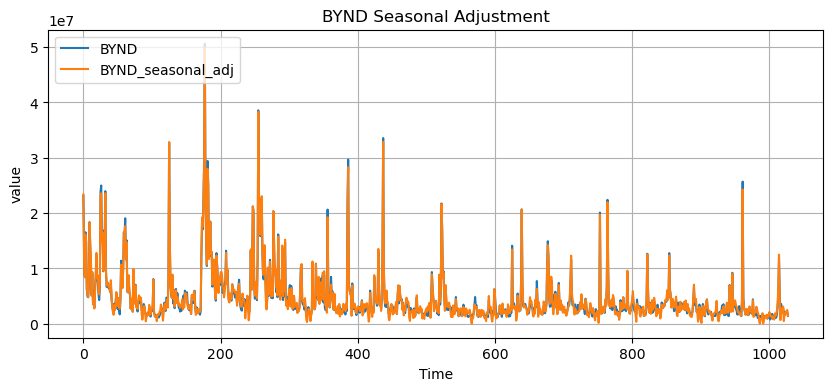

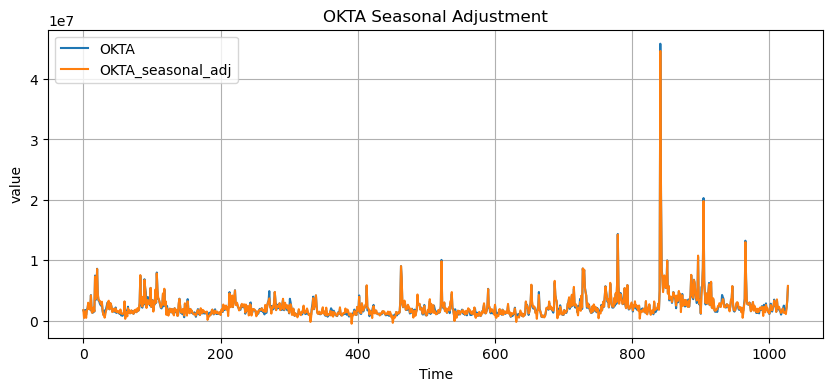

In [95]:
# plot the original data and the seasonal adjustment for each company
for comp in companies:

    # Plot the seasonal adjustment
    plt.figure(figsize=(10, 4))
    plt.plot(np.arange(len(time_series[comp])), time_series[comp],label=f'{comp}')
    plt.plot(np.arange(len(time_series[f'{comp}_seasonal_adj'])), time_series[f'{comp}_seasonal_adj'],label=f'{comp}_seasonal_adj')
    plt.title(f'{comp} Seasonal Adjustment')
    plt.xlabel('Time')
    plt.legend(loc="upper left")
    plt.ylabel('value')
    plt.grid(True)
    plt.show()

Plotting the original data compared to its seasonal adjustment exhibits that the seasonal pattern is relatively subtle, and the general patterns of each dataset are still prominent. We can observe that the high and low peaks are less extreme, but the trend and patterns are still present. 

### 2.5. Summary

After we explored the various datasets and applied different techniques to analyze them, we will discuss the results. 
Firstly, we checked if any data exhibited stationary characteristics and included the stationary ones in my portfolio. 
For trending datasets, I implemented differences, second differences, and relative differences to manage the trending behaviour. Additionally, I experimented with logarithmic transformations on data that showed signs of being multiplicative. 

Taking logarithms, I converted the data to an additive form for easier analysis. Furthermore, I examined the datasets to identify any seasonal patterns. If found, I added the seasonal data to my portfolio and performed seasonal adjustments on at least one time series. These adjustments helped remove or reduce the seasonal component, enabling better analysis of the underlying trends. Overall, I successfully incorporated stationary, transformed trending and multiplicative, and seasonally adjusted data into my portfolio, demonstrating my data analysis and time series manipulation skills.

## 3. Assignment 3

In this topic, we have discussed forecasting and exhibited a few simple forecasting techniques: naïve, seasonal naïve and average.
We have learned to use differences to calm trending and make predictions easier.
We have modelled errors using maximum likelihood estimators for normal distributions, developed the necessary mathematics and learned how to evaluate forecasting results.

Naive:

The naïve method is straightforward, making it an excellent choice for quick and basic forecasts.
It doesn't require any parameter tuning, as it simply uses the last observed value for forecasting and performs well for time series data with stable and consistent trends.it is most suitable for updating forecasts in real-time as new data becomes available.

The drawbacks of this method are:
It is not suitable for seasonal data since it ignores seasonal patterns. It performs poorly for time series data with significant trends or irregular patterns, and it is highly sensitive to outliers and extreme values, leading to less accurate forecasts in the presence of such data points.

Seasonal naïve:

Like the naïve method, the seasonal naïve method is easy to understand and implement; it directly addresses seasonality by using the last observed value from the corresponding season for forecasting. Moreover, it works well for time series data with stable and consistent seasonal patterns.

Unfortunately, the seasonal naïve method does not account for trends or irregular variations in the data, and it relies solely on past seasonal observations, making it less suitable for long-term forecasting.

Moving average: 

The moving average method smooths out short-term fluctuations in the data, making it easier to identify underlying trends.
The method requires only the window size (number of periods) for averaging, with no complex parameter tuning and i
it reduces the impact of outliers and random noise, resulting in more stable forecasts.

The cons of this method are:
Moving averages inherently introduce a lag in forecasts, which may not be suitable for predicting sudden changes or short-term fluctuations. It may not adapt well to sudden changes or structural shifts in the data, leading to less accurate forecasts in such scenarios if it does not address seasonality. 

Based on these facts, these methods might not produce reliable prediction models for the stock volume data used for this analysis since it contains seasonal and fluctuating patterns.   

Regardless, we will implement the methods and calculate the RMSE (Root Mean Squared Error) to determine which method produced the best forecast. 

The additional technique that was selected for comparison is Moving Average Exponential Smoothing. 
Moving Average Exponential Smooting adapts quickly to changes in the underlying time series data. It assigns higher weights to more recent observations, allowing it to capture short-term fluctuations and respond to sudden shifts in trends. It smooths out noise and short-term fluctuations in the data, making it easier to identify long-term trends and underlying patterns.

However, in some cases, Moving Average Exponential Smooting may overfit the historical data, leading to forecasts that closely mimic the observed data but may differ from future trends. It must be better suited for long-term forecasting as it relies heavily on recent observations and may not capture longer-term patterns or changes.
Moving Average Exponential Smoothing is more advanced and flexible than the other methods, combining the benefits of moving average smoothing and exponential smoothing. 

We will implement the forecasting techniques and some other simple techniques (Moving Average Exponential Smoothing) as requested for comparison.
Afterwards, We will make a table, with the data as the rows and the techniques/algorithms as the columns, and compute the errors.
Lastly, we will briefly analyse what we have found so far.

### 3.1. Implementing the forecasting techniques we developed.

#### 3.1.1. naïve

In [96]:
comparison_table_simple =  pd.DataFrame()

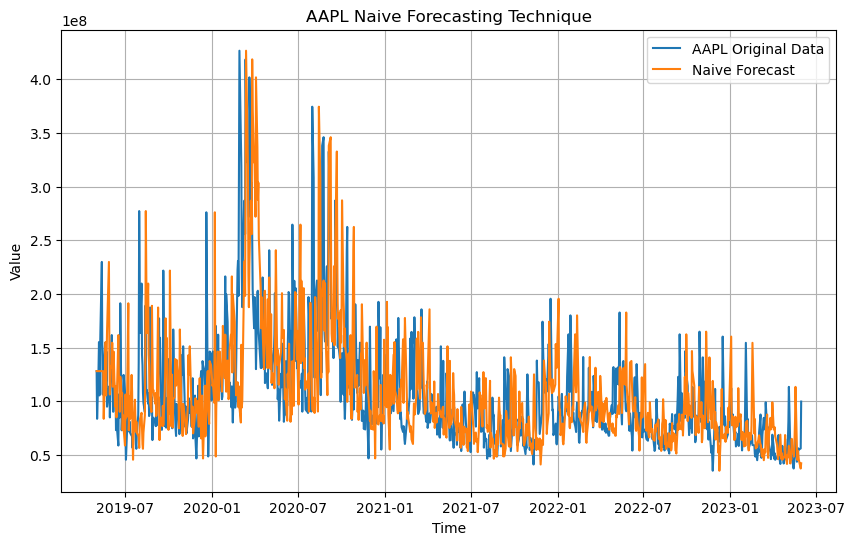

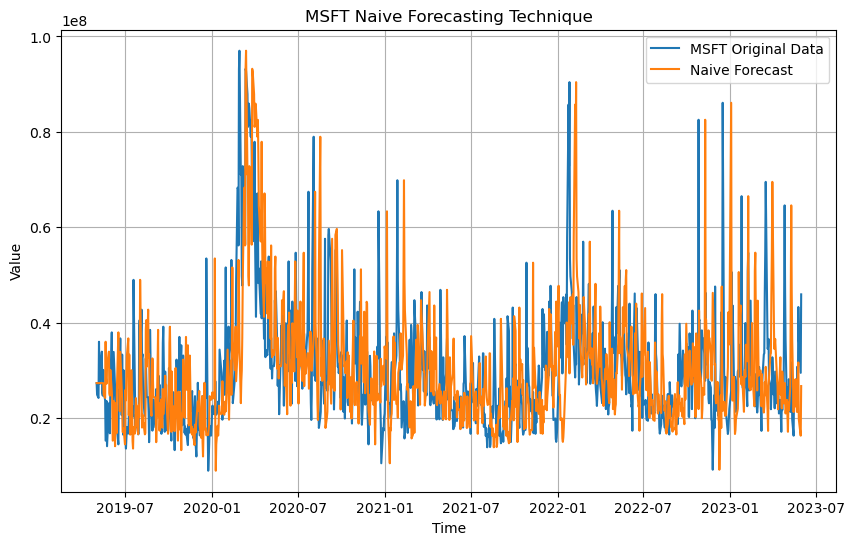

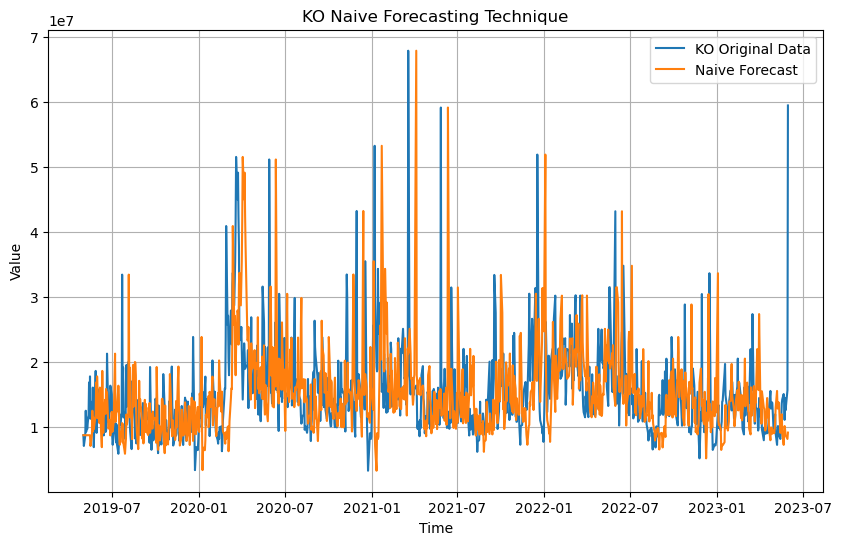

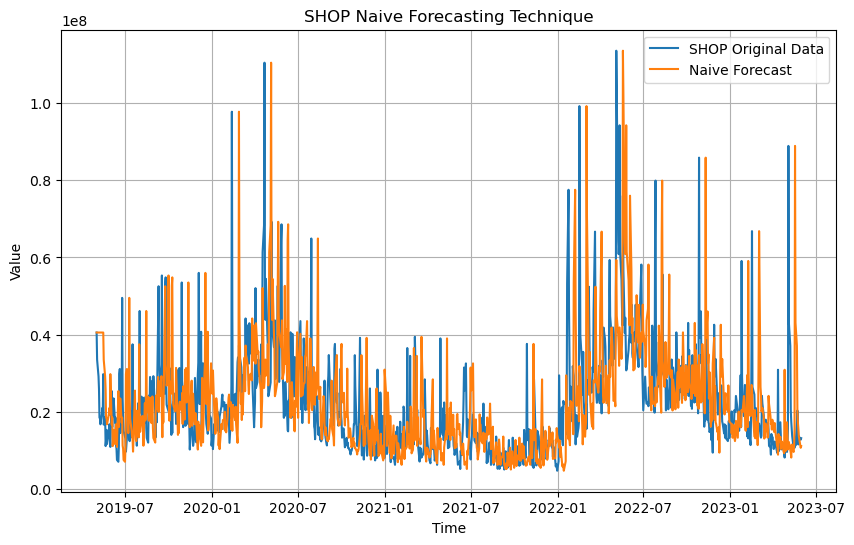

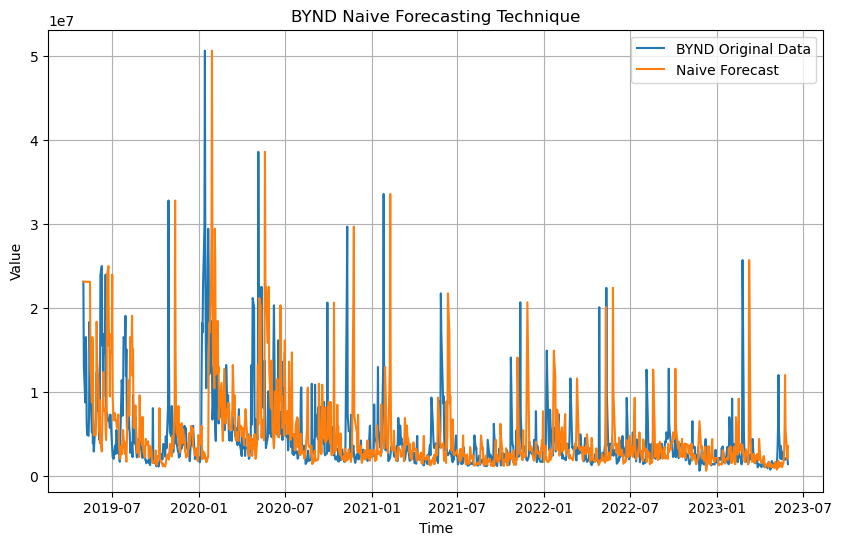

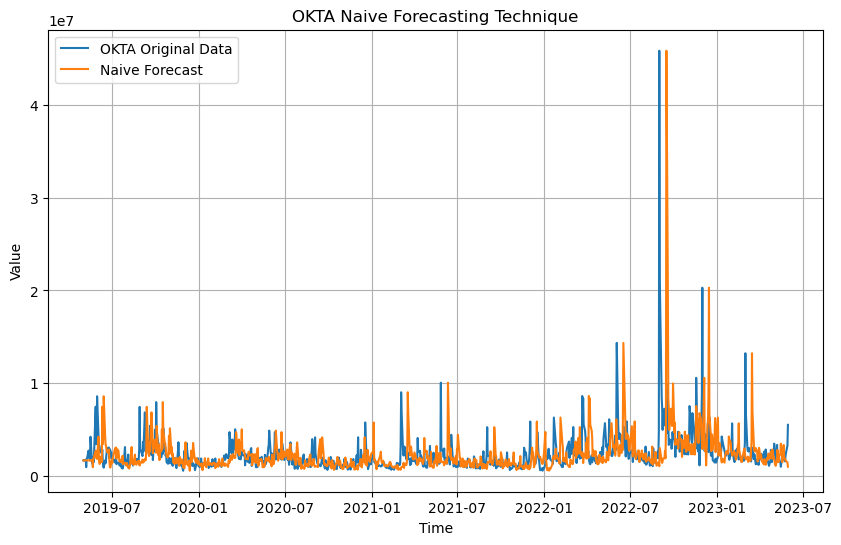

In [97]:

# Naive Forecasting Technique
def naive_forecast(series):
    return series.shift(10).fillna(series.iloc[0])

for series in companies:
    comparison_table_simple[f'{series}'] = time_series[f'{series}'] 
    # Execute the naive forecasting technique
    naive_result = naive_forecast(time_series[series])
    
    time_series[f'{series}_naive'] = naive_result
    comparison_table_simple[f'{series}_naive'] = time_series[f'{series}_naive'] 
    
    #print(comparison_table_simple)
    
    # Plot the original data and the naive forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[series].index, time_series[series], label=series+' Original Data')
    plt.plot(naive_result.index, naive_result, label='Naive Forecast')
    plt.title(f'{series} Naive Forecasting Technique')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

#### 3.1.2. seasonal naïve

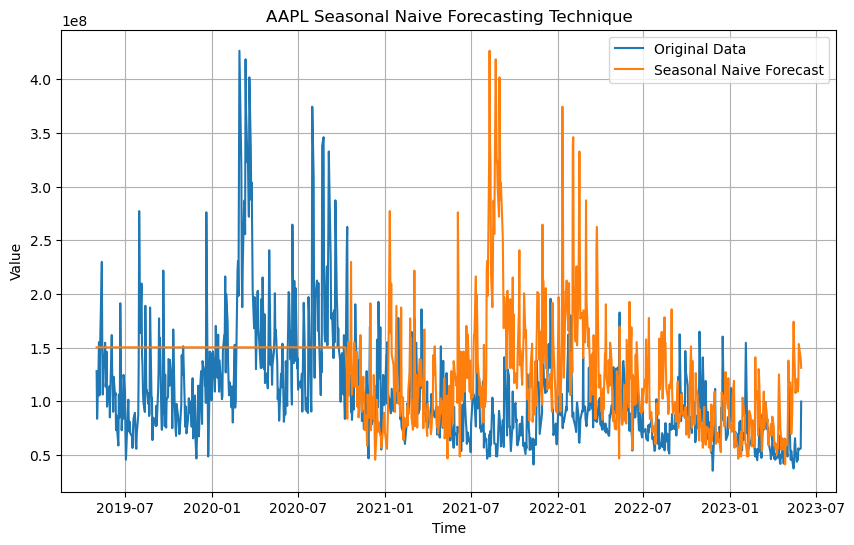

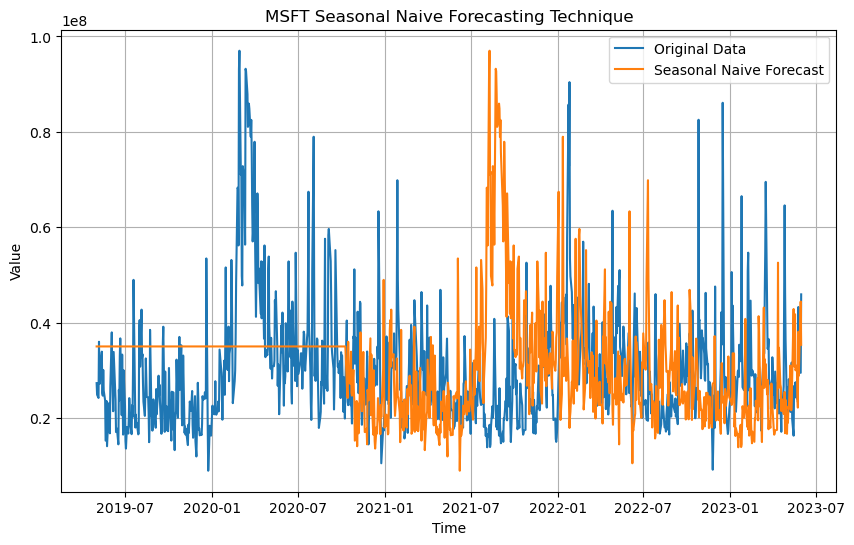

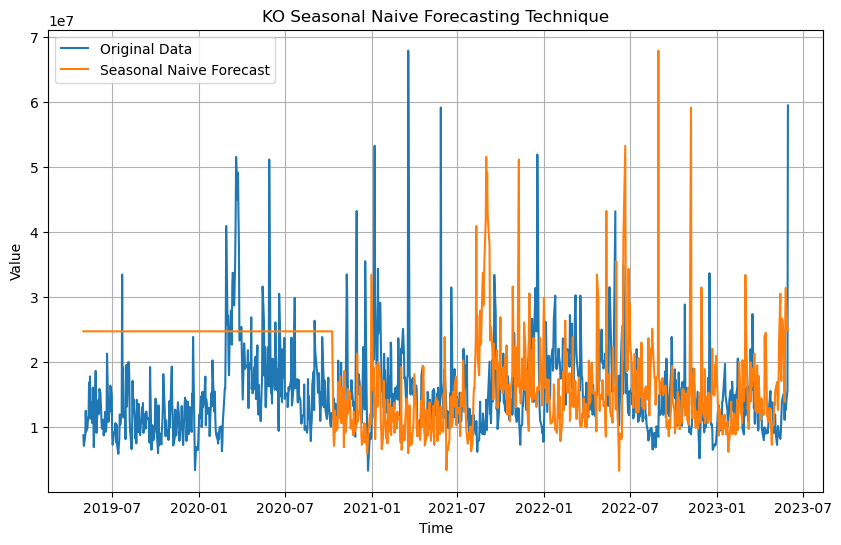

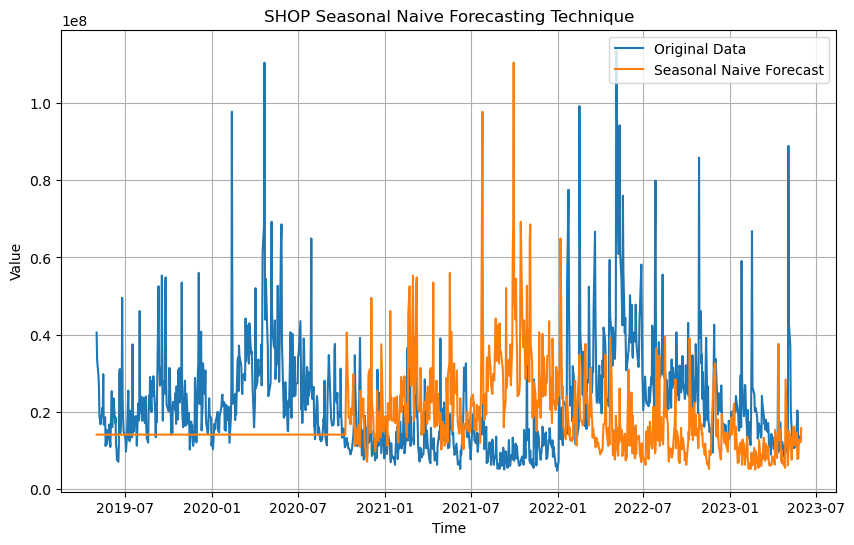

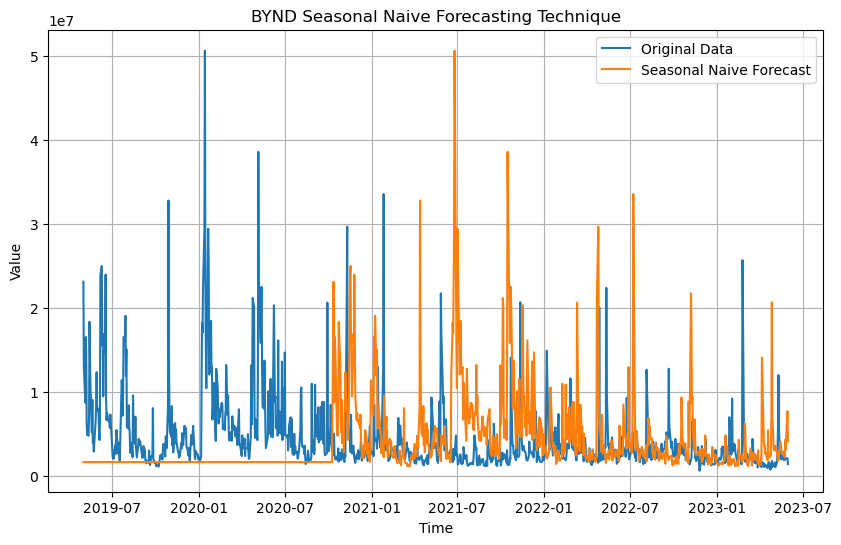

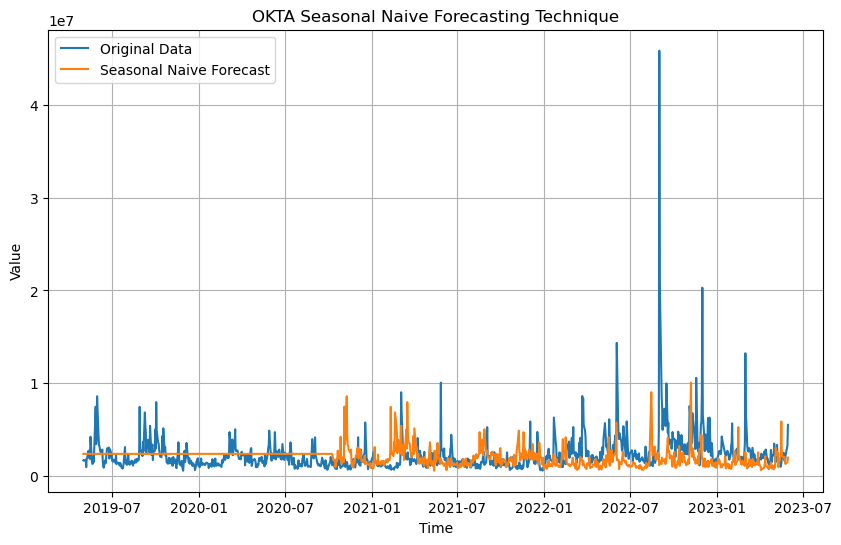

In [98]:
# Define the seasonal period (number of steps in a season)
seasonal_period = 365

# Seasonal Naive Forecasting Technique
def seasonal_naive_forecast(series, period):
    return series.shift(period).fillna(series.iloc[-period])

for series in companies:
    # Execute the seasonal naive forecasting technique
    seasonal_naive_result = seasonal_naive_forecast(time_series[series], seasonal_period)

    time_series[f'{series}_seasonal_naive'] = seasonal_naive_result
    comparison_table_simple[f'{series}_seasonal_naive'] = time_series[f'{series}_seasonal_naive']
    
        
    # Plot the original data and the seasonal naive forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[series].index, time_series[series], label='Original Data')
    plt.plot(seasonal_naive_result.index, seasonal_naive_result, label='Seasonal Naive Forecast')
    plt.title(f'{series} Seasonal Naive Forecasting Technique')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

#### 3.1.3. Moving Average

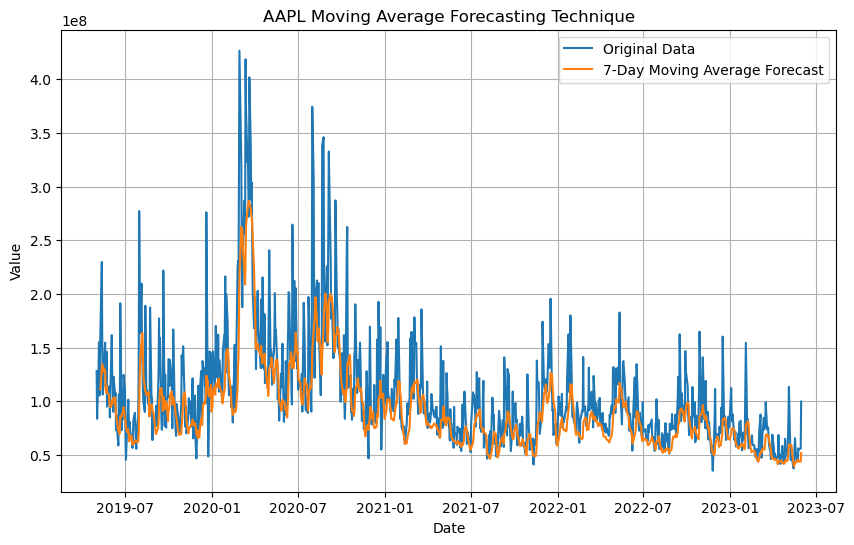

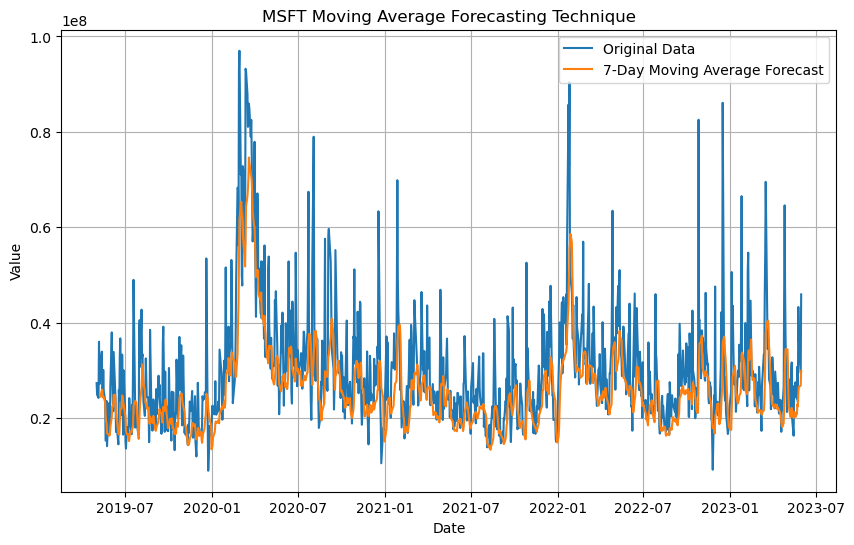

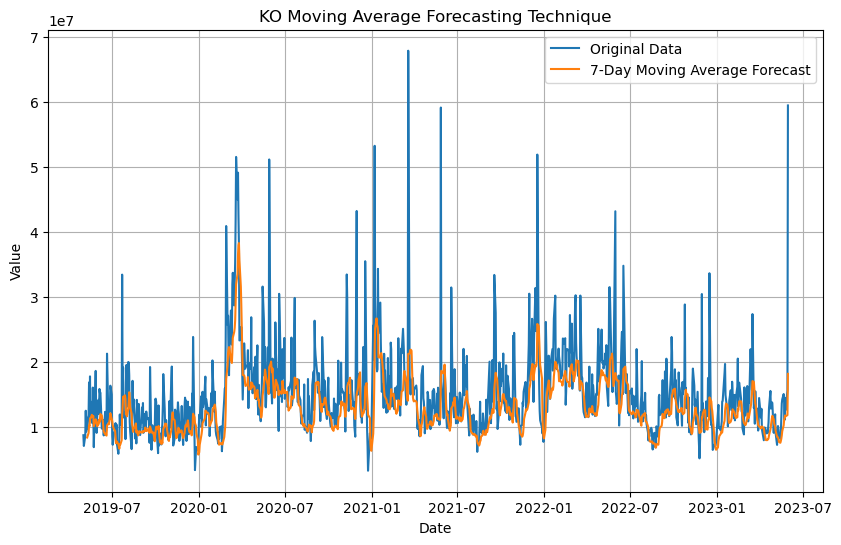

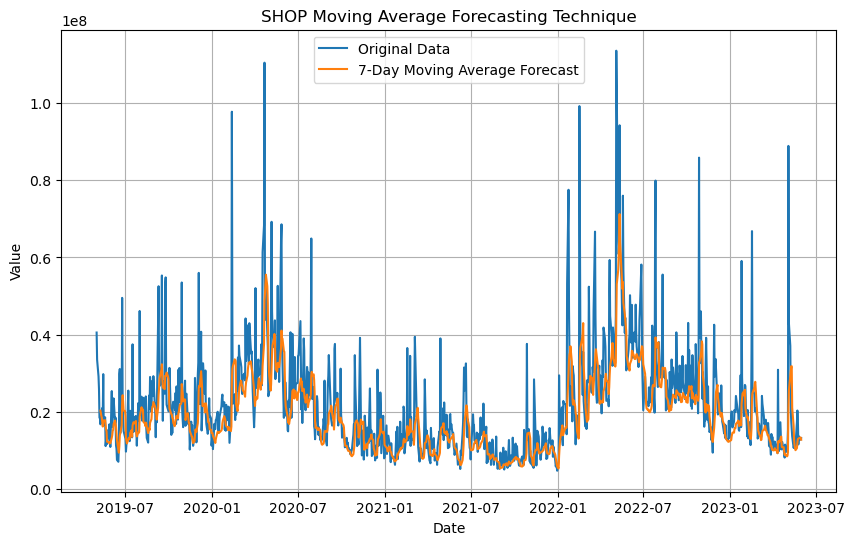

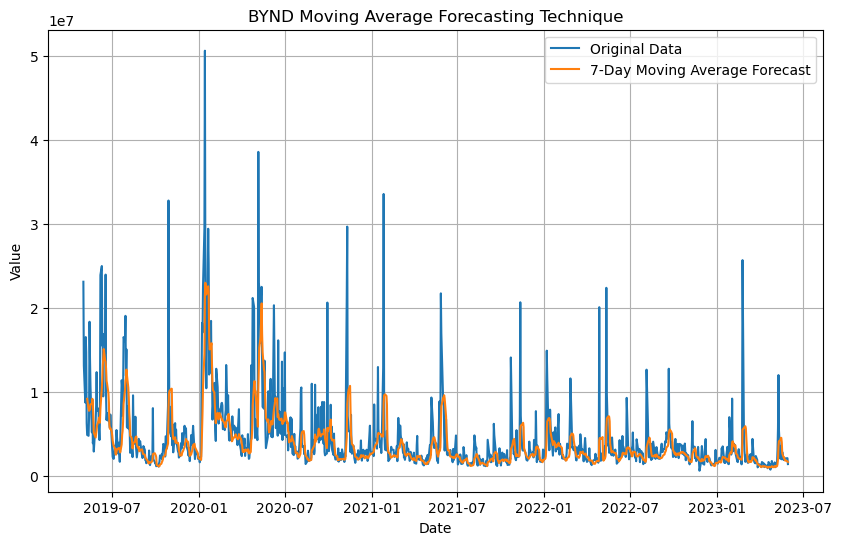

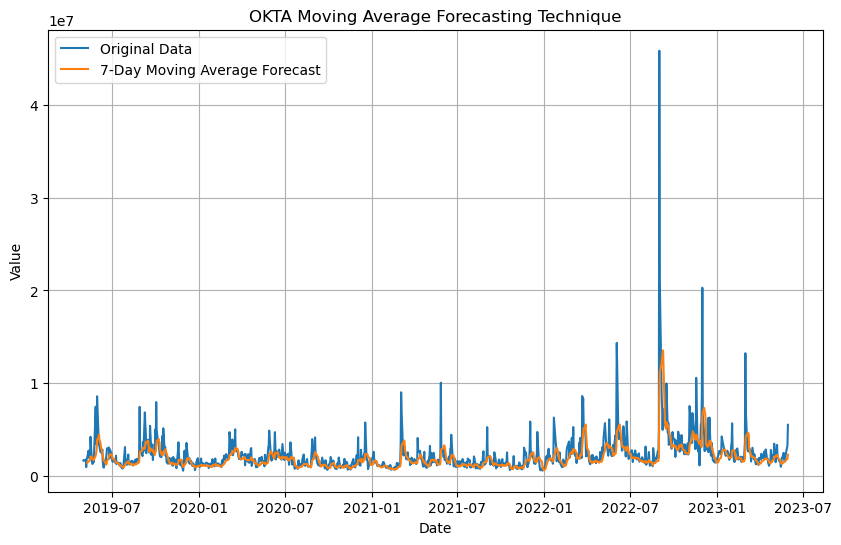

In [99]:
window_size = 7  # Example: 7-day moving average
for series in companies:
    # Calculate the cumulative sum of the data
    cumulative_sum = time_series[series].cumsum()

    # Calculate the moving average using the cumsum function and window size

    moving_average_forecast = (cumulative_sum - cumulative_sum.shift(window_size - 1)) / window_size
    
    time_series[f'{series}_moving_average_forecast'] = moving_average_forecast
    comparison_table_simple[f'{series}_moving_average'] = time_series[f'{series}_moving_average_forecast']
    
    
    # Plot the original data and the moving average forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[series].index, time_series[series], label='Original Data')
    plt.plot(moving_average_forecast.index, moving_average_forecast, label=f'{window_size}-Day Moving Average Forecast')
    plt.title(f'{series} Moving Average Forecasting Technique')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

### 3.2. Implement some other simple forecasting techniques - Moving Average Exponential Smooting


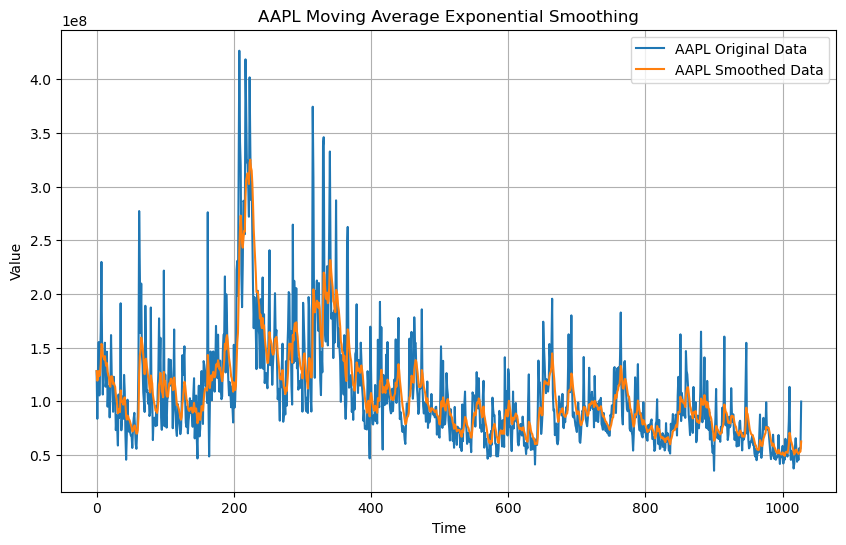

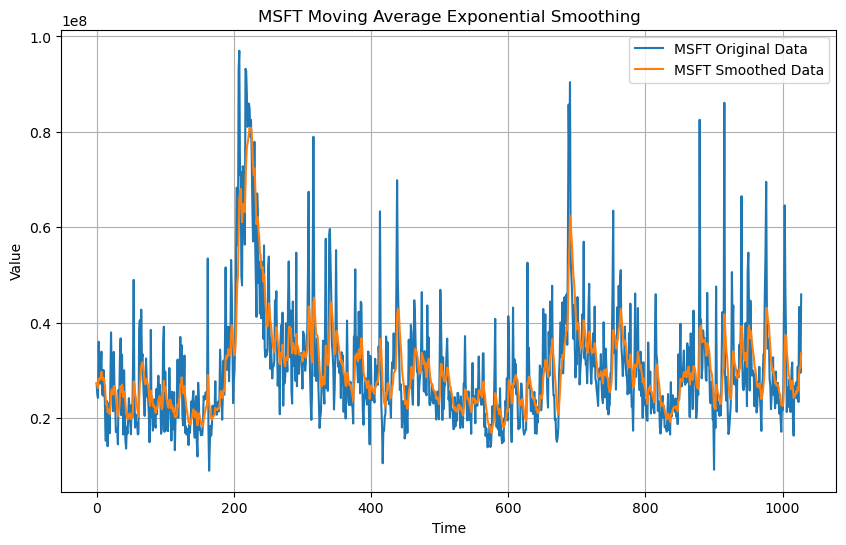

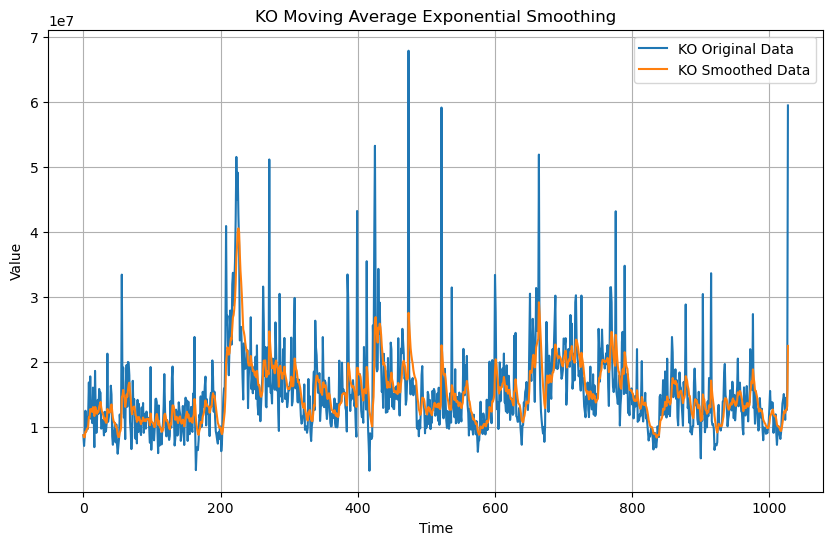

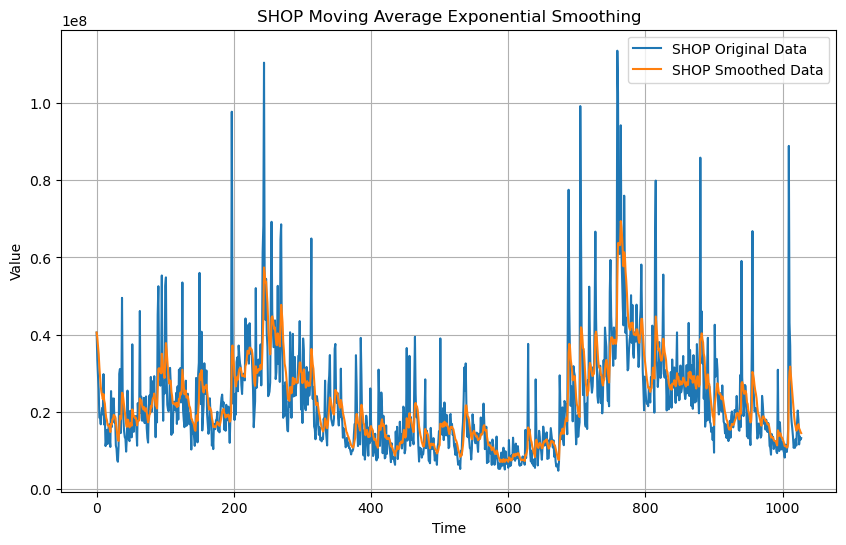

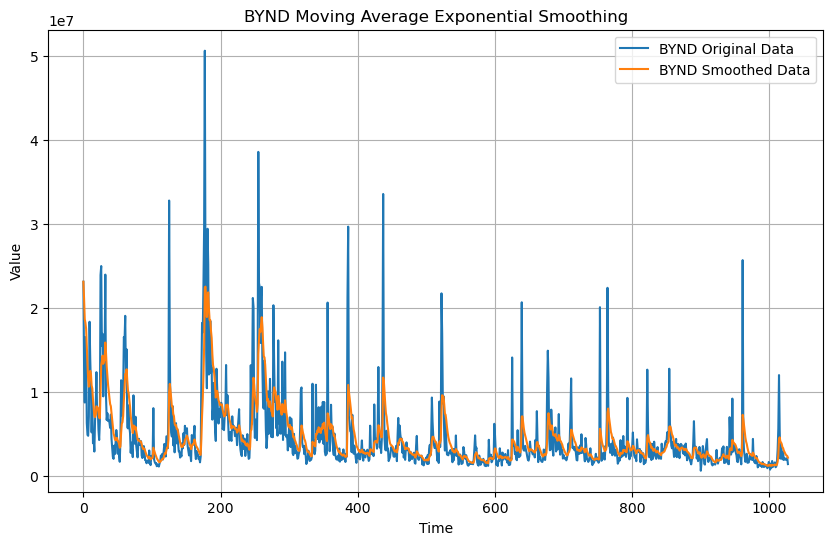

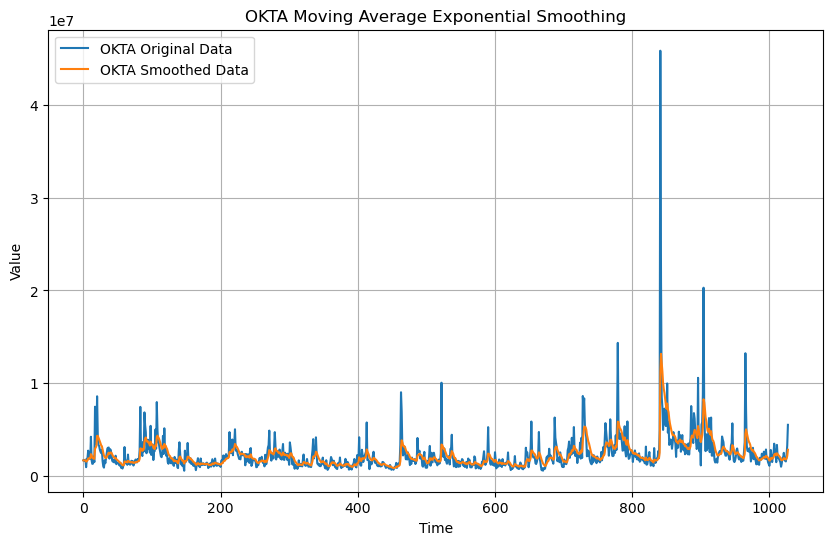

In [100]:
def moving_average_exponential_smoothing(data, alpha):
    
    smoothed_data = [data[0]]  # Initialize the smoothed data with the first value of the input data
    for i in range(1, len(data)):
        smoothed_value = alpha * data[i] + (1 - alpha) * smoothed_data[-1]
        smoothed_data.append(smoothed_value)
    return pd.Series(smoothed_data, index=data.index)

# Set the smoothing factor (alpha)
alpha = 0.2

for comp in companies:

    # Perform exponential smoothing on each series
    smoothed_data = moving_average_exponential_smoothing(time_series[comp], alpha)

    #print(smoothed_data)
    
    # Combine the 'Date' column back with the smoothed data
    time_series[f'{comp}_Moving_Average_Exponential_Smooting'] = smoothed_data
    comparison_table_simple[f'{comp}_Moving_Average_Exponential_Smooting'] = time_series[f'{comp}_Moving_Average_Exponential_Smooting']
    
    # Plot the original data and the smoothed data
    plt.figure(figsize=(10, 6))
    plt.plot(np.arange(len(time_series[comp])), time_series[comp], label=f'{comp} Original Data')
    plt.plot(np.arange(len(smoothed_data)), smoothed_data, label=f'{comp} Smoothed Data')
    plt.title(f'{comp} Moving Average Exponential Smoothing')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Display the result
    #print(smoothed_data)

### 3.3. Compare forcasting techniques results

In [132]:
import math

def rmse(predicted, actual):
    diffs = predicted - actual
    return math.sqrt(np.mean(diffs ** 2))


result_of_comparison = pd.DataFrame()

#result_of_comparison.index = companies

methods = ["naive","seasonal naive","moving average","MAES"]

print(result_of_comparison)

for comp in companies: 
    res = []
    print(f"{comp} naive RMSE \t", rmse(comparison_table_simple[f"{comp}_naive"],comparison_table_simple[comp]))
    res.append(rmse(comparison_table_simple[f"{comp}_naive"],comparison_table_simple[comp]))
    
    print(f"{comp} seasonal naive RMSE \t", rmse(comparison_table_simple[f"{comp}_seasonal_naive"],comparison_table_simple[comp]))
    res.append(rmse(comparison_table_simple[f"{comp}_seasonal_naive"],comparison_table_simple[comp]))
    
    print(f"{comp}  moving average RMSE \t", rmse(comparison_table_simple[f"{comp}_moving_average"],comparison_table_simple[comp]))
    res.append(rmse(comparison_table_simple[f"{comp}_moving_average"],comparison_table_simple[comp]))
    
    print(f"{comp} _Moving_Average_Exponential_Smooting RMSE \t", rmse(comparison_table_simple[f"{comp}_Moving_Average_Exponential_Smooting"],comparison_table_simple[comp]))
    res.append(rmse(comparison_table_simple[f"{comp}_Moving_Average_Exponential_Smooting"],comparison_table_simple[comp]))
    
    result_of_comparison[comp] = res



Empty DataFrame
Columns: []
Index: []
AAPL naive RMSE 	 50831461.12384629
AAPL seasonal naive RMSE 	 71136674.75257702
AAPL  moving average RMSE 	 33899492.115251094
AAPL _Moving_Average_Exponential_Smooting RMSE 	 27629978.705784865
MSFT naive RMSE 	 13683331.649742981
MSFT seasonal naive RMSE 	 17626529.434585456
MSFT  moving average RMSE 	 9341367.14598863
MSFT _Moving_Average_Exponential_Smooting RMSE 	 7469336.550214999
KO naive RMSE 	 8316687.2750853235
KO seasonal naive RMSE 	 10781154.27276376
KO  moving average RMSE 	 5521202.13989474
KO _Moving_Average_Exponential_Smooting RMSE 	 4636955.062486119
SHOP naive RMSE 	 15083243.145627426
SHOP seasonal naive RMSE 	 19668396.889498904
SHOP  moving average RMSE 	 9793102.661389414
SHOP _Moving_Average_Exponential_Smooting RMSE 	 8414836.918512324
BYND naive RMSE 	 6073303.255154964
BYND seasonal naive RMSE 	 7215558.595754357
BYND  moving average RMSE 	 3370299.0386368767
BYND _Moving_Average_Exponential_Smooting RMSE 	 3121155.4600

In [133]:
print("Aggregated RMSE Table")
result_of_comparison.index = methods
result_of_comparison

Aggregated RMSE Table


,AAPL,MSFT,KO,SHOP,BYND,OKTA
naive,5.083146e+07,1.368333e+07,8.316687e+06,1.508324e+07,6.073303e+06,2.736679e+06
seasonal naive,7.113667e+07,1.762653e+07,1.078115e+07,1.966840e+07,7.215559e+06,2.419642e+06
moving average,3.389949e+07,9.341367e+06,5.521202e+06,9.793103e+06,3.370299e+06,1.731866e+06
MAES,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06


### 3.4. Results analysis

We can see that the RMSE value is significant for all methods, but the method which produced the smallest RMSE for all companies' data was the MAES method. 

## 4. Assignment 4

In this topic, we covered linear regression for finding unbiased lines in two dimensions.
We have learned how to generalise the algorithm with a matrix representation. We have learned about AR(p) as a way of using regression as a technique for predicting values. We have learned about autocorrelation (ACF) and partial autocorrelation (PACF) and learned how we could use pacf to help decide on the AR(p) parameters. 


We will perform (partial autocorrelation) PACF analyses 
Later we will use the results of that analysis to decide on a good candidate (autocorrelation) AR prediction on your data.
The results will be added to the table produced in the last topic.
We will simulate automated trading for one of our data sets.

### 4.1. (partial autocorrelation) PACF analyses 

ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function) are both tools used in time series analysis to understand the autocorrelation structure of a time series.

ACF (Autocorrelation Function):
The Autocorrelation Function (ACF) measures the correlation between a time series and its lagged versions. It calculates the correlation between a data point and the data point at a specific lag (time step) behind it. The ACF is useful for identifying the presence of serial correlation in the time series data.
ACF is commonly used for identifying the order of an autoregressive (AR) model: The lag at which the ACF cuts off or drops to insignificance indicates the order of the AR model.
another use is detecting seasonality. In seasonal data, the ACF typically shows significant spikes at multiples of the seasonal period, indicating the presence of seasonality in the data.

PACF (Partial Autocorrelation Function):
The Partial Autocorrelation Function (PACF) measures the correlation between a data point and its lagged version while controlling for the intermediate lags. In other words, PACF gives the direct relationship between two data points, removing the effects of the intervening lags. The PACF is useful in identifying the order of a Moving Average (MA) model.

PACF is commonly used for:
* Identifying the order of a Moving Average (MA) model. The lag at which the PACF cuts off or drops to insignificance indicates the order of the MA model.
* Distinguishing between AR and MA models: By analyzing both the ACF and PACF, you can distinguish between AR and MA processes in the time series.

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


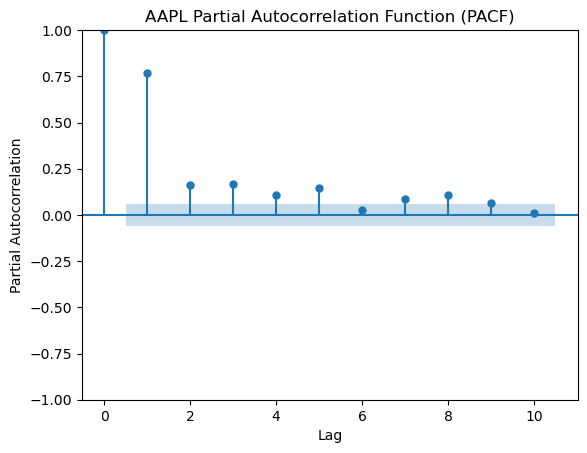

[1.         0.77009273 0.16347932 0.16998003 0.10881034 0.14662381
 0.02883554 0.08500281 0.11048224 0.06685169 0.01287405]


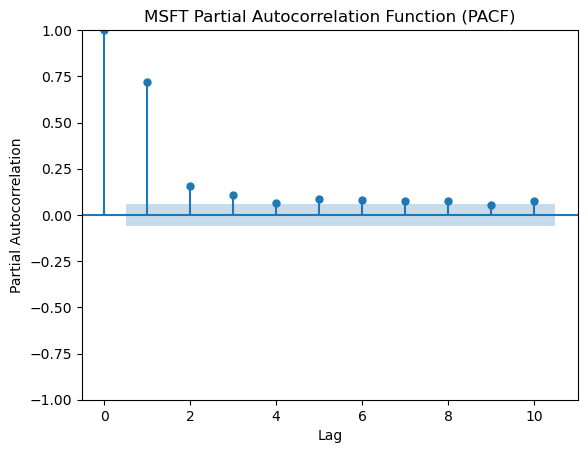

[1.         0.71825082 0.15397267 0.10614834 0.0650606  0.08676304
 0.07833153 0.07738627 0.07633972 0.05130238 0.07537327]


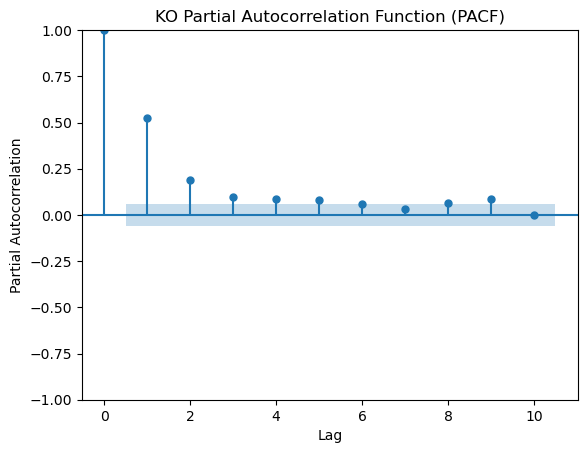

[ 1.          0.52200463  0.19062253  0.09480733  0.08673893  0.078449
  0.05935276  0.02941392  0.06311349  0.0845421  -0.00128493]


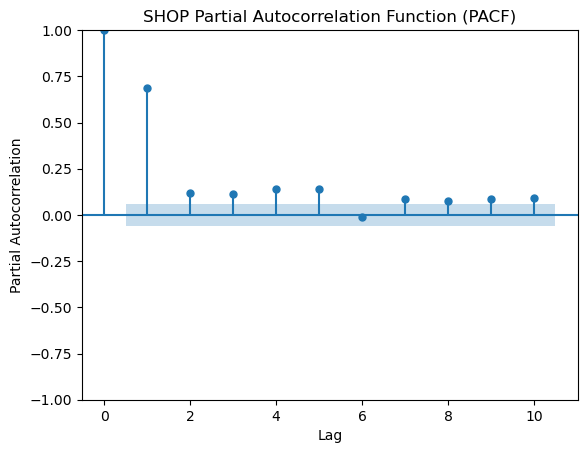

[ 1.          0.68732402  0.11648693  0.11528298  0.14052121  0.13972431
 -0.0114554   0.08361684  0.07786336  0.08565399  0.09094387]


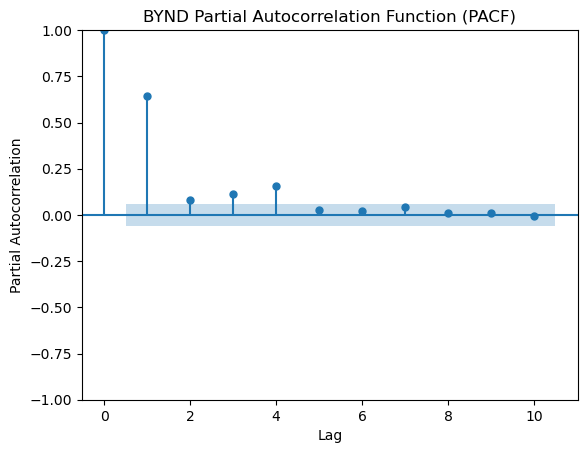

[ 1.          0.64404563  0.07844875  0.11422703  0.15809489  0.02627776
  0.02281014  0.04058698  0.00904007  0.01043425 -0.00533684]


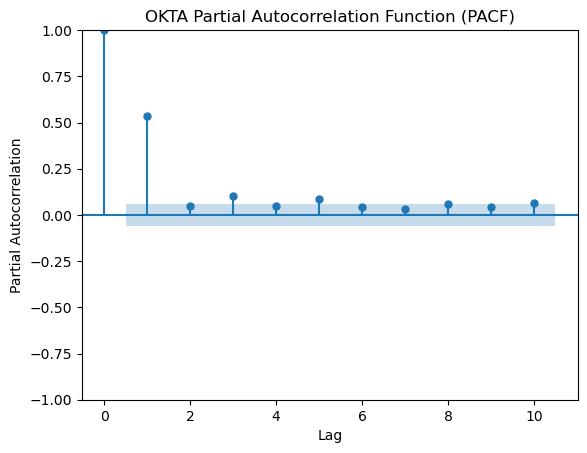

[1.         0.5329716  0.04841998 0.10045141 0.04918174 0.08616669
 0.04333391 0.03123413 0.06169667 0.04372869 0.06248545]


In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf

def perform_pacf_analysis(time_series_data, max_lag):
   
    # Convert the data to a pandas Series for easier manipulation
    data_series = pd.Series(time_series_data)

    # Calculate the PACF values
    pacf_values = pacf(data_series, nlags=max_lag)

    # Plot the PACF
    plot_pacf(data_series, lags=max_lag)
    plt.xlabel('Lag')
    plt.ylabel('Partial Autocorrelation')
    plt.title(f'{comp} Partial Autocorrelation Function (PACF)')
    plt.show()

    return pacf_values

# Example usage:
# Replace 'your_time_series_data' with your actual time series data

for comp in companies:
    max_lag = 10  # Set the maximum number of lags for PACF analysis

    pacf_values = perform_pacf_analysis(time_series[comp], max_lag)
    print(pacf_values)

### 4.2. AR(p)

In simple words, the Autoregressive Model of Order p (AR(p)) works by using the past values of a time series to predict its future values. The "p" in AR(p) represents the number of past values or time steps the model considers for prediction.
We will implement the AR model for each company's data based on the autocorrelation we found. 
Stock volume data often exhibit autocorrelation, meaning the current volume correlates with its past values. AR models are specifically designed to capture such autocorrelation, making them well-suited for forecasting time series data with this characteristic.
AR models are adaptive and responsive to recent changes in the data. The use of lagged terms in the model allows it to respond quickly to fluctuations and shifts in volume patterns, which can be essential for forecasting stocks, where trading volumes can vary significantly in the short term.
AR models are particularly effective for short-term forecasting. Stock volume data often shows short-term trends and fluctuations, and AR models can quickly adapt to changes in volume patterns over short periods.





C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                   AAPL   No. Observations:                 1028
Model:              Restr. AutoReg(8)   Log Likelihood              -19071.241
Method:               Conditional MLE   S.D. of innovations       31907657.766
Date:                Sun, 30 Jul 2023   AIC                          38158.482
Time:                        15:33:42   BIC                          38197.903
Sample:                             8   HQIC                         38173.450
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.007e+07    2.6e+06      3.865      0.000    4.96e+06    1.52e+07
AAPL.L1        0.5626      0.031     18.247      0.000       0.502       0.623
AAPL.L2        0.0261      0.036      0.736      0.4

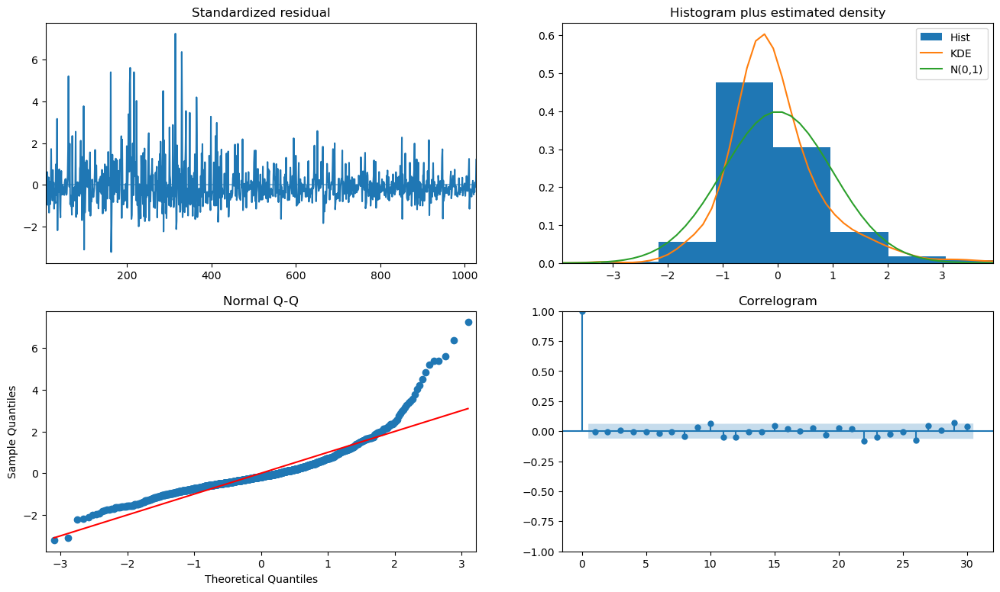

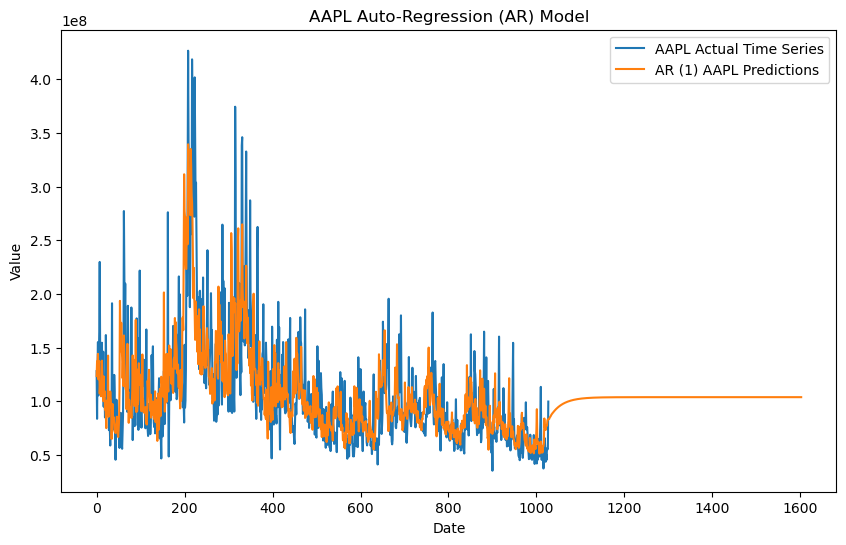

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                   MSFT   No. Observations:                 1028
Model:                     AutoReg(1)   Log Likelihood              -17889.392
Method:               Conditional MLE   S.D. of innovations        8887342.581
Date:                Sun, 30 Jul 2023   AIC                          35784.785
Time:                        15:33:44   BIC                          35799.588
Sample:                             1   HQIC                         35790.403
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       8.516e+06   7.13e+05     11.952      0.000    7.12e+06    9.91e+06
MSFT.L1        0.7186      0.022     33.067      0.000       0.676       0.761
                                    Roots           

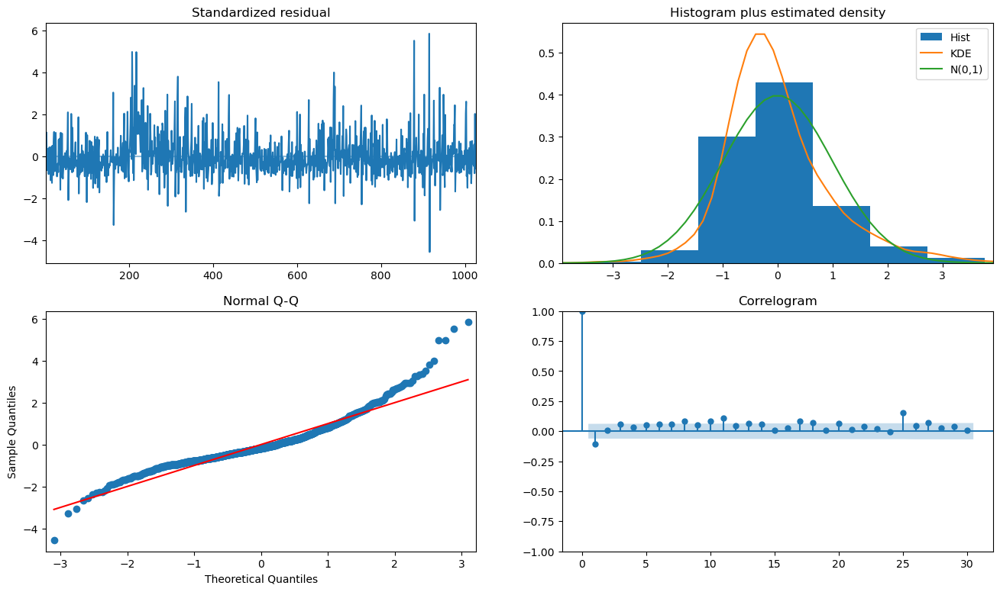

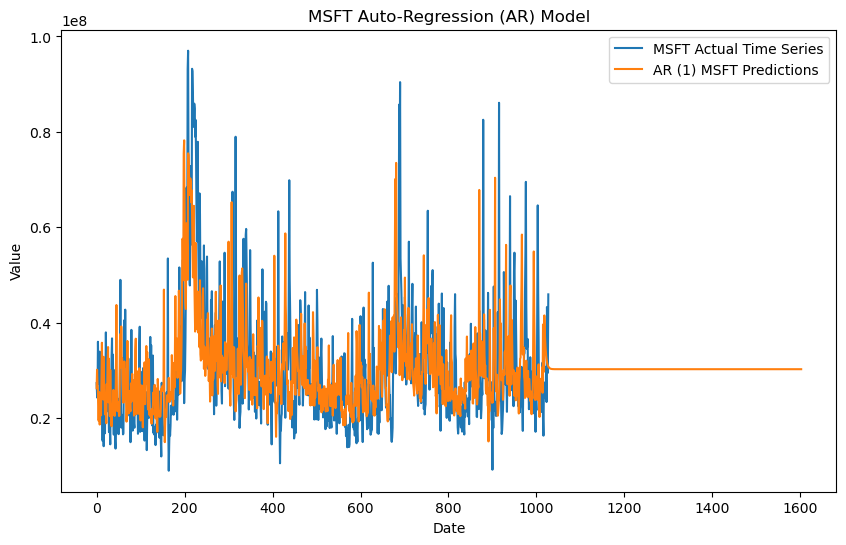

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                     KO   No. Observations:                 1028
Model:                     AutoReg(3)   Log Likelihood              -17389.219
Method:               Conditional MLE   S.D. of innovations        5644280.429
Date:                Sun, 30 Jul 2023   AIC                          34788.438
Time:                        15:33:45   BIC                          34813.100
Sample:                             3   HQIC                         34797.800
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        5.18e+06   5.21e+05      9.942      0.000    4.16e+06     6.2e+06
KO.L1          0.4230      0.032     13.180      0.000       0.360       0.486
KO.L2          0.1487      0.034      4.313      0.0

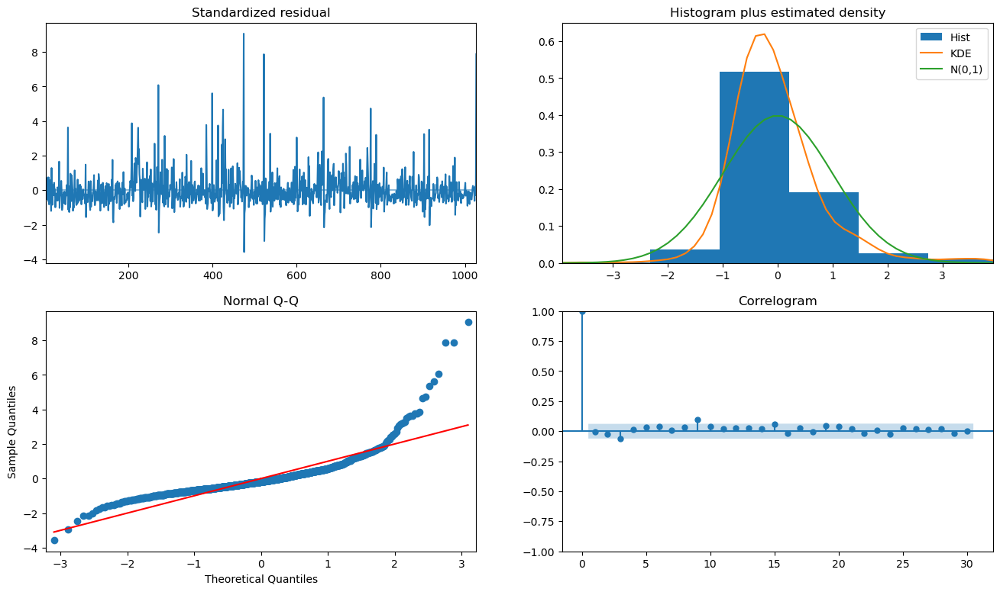

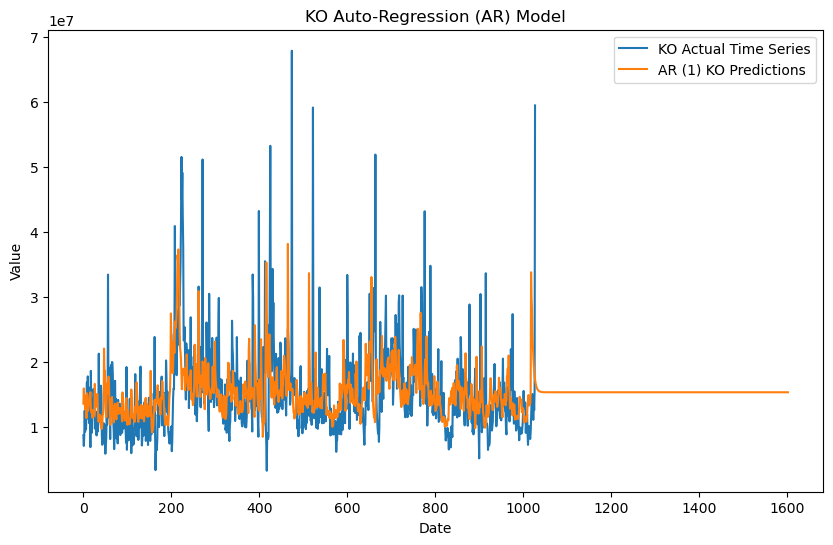

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                   SHOP   No. Observations:                 1028
Model:                     AutoReg(5)   Log Likelihood              -17928.292
Method:               Conditional MLE   S.D. of innovations        9882475.647
Date:                Sun, 30 Jul 2023   AIC                          35870.584
Time:                        15:33:47   BIC                          35905.098
Sample:                             5   HQIC                         35883.687
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.023e+06   6.84e+05      5.878      0.000    2.68e+06    5.36e+06
SHOP.L1        0.5579      0.031     18.023      0.000       0.497       0.619
SHOP.L2        0.0358      0.035      1.010      0.3

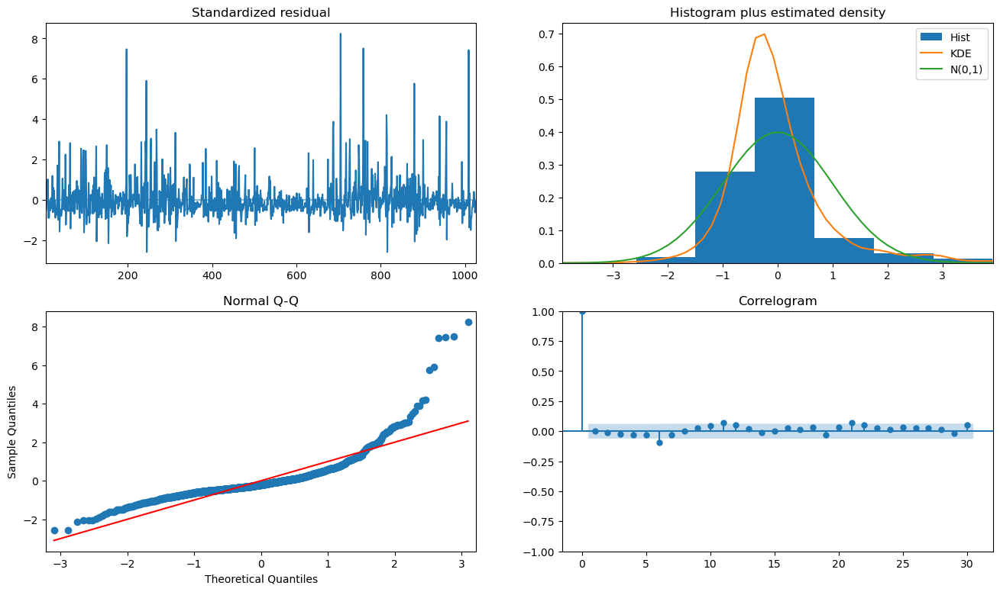

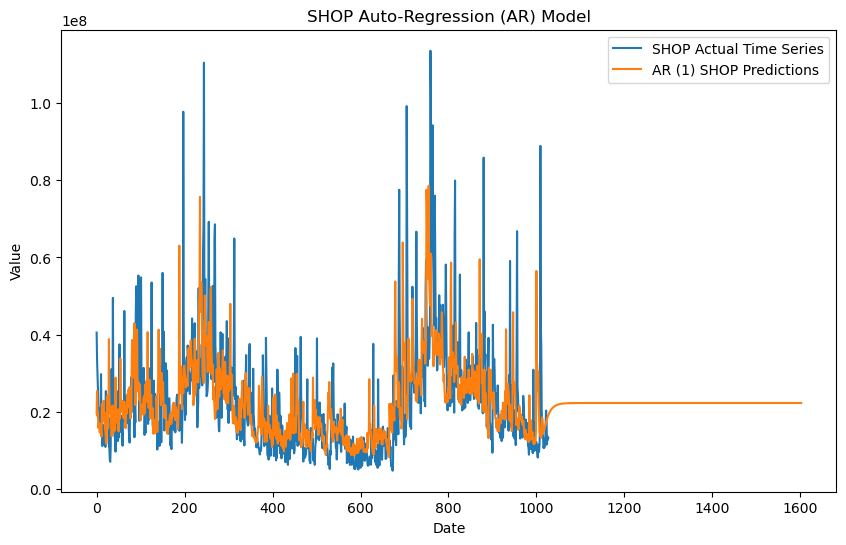

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                   BYND   No. Observations:                 1028
Model:              Restr. AutoReg(4)   Log Likelihood              -16885.695
Method:               Conditional MLE   S.D. of innovations        3509547.488
Date:                Sun, 30 Jul 2023   AIC                          33779.389
Time:                        15:33:49   BIC                          33799.115
Sample:                             4   HQIC                         33786.878
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.124e+06   1.68e+05      6.702      0.000    7.95e+05    1.45e+06
BYND.L1        0.5772      0.025     22.850      0.000       0.528       0.627
BYND.L4        0.1717      0.025      6.858      0.0

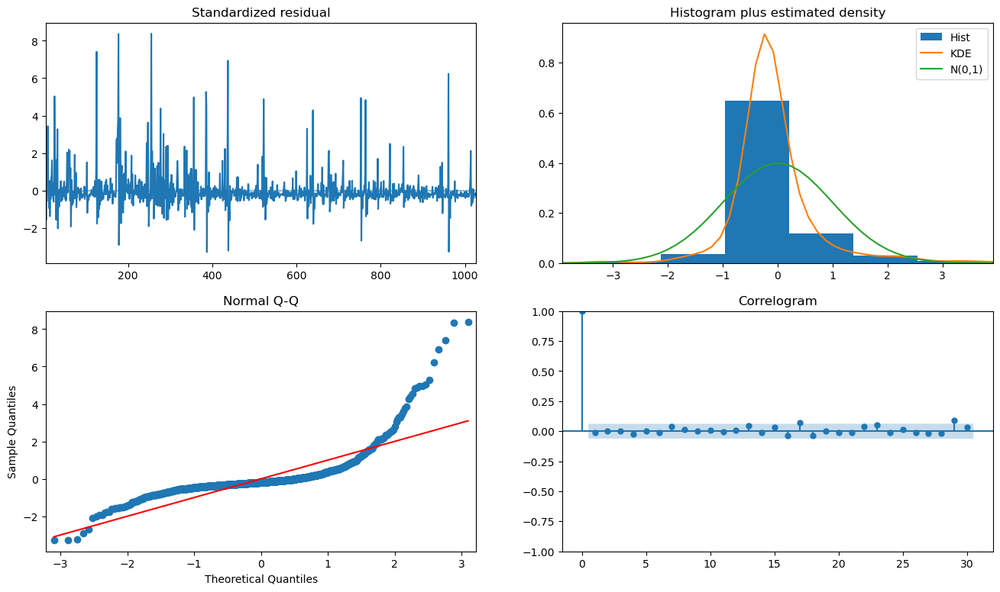

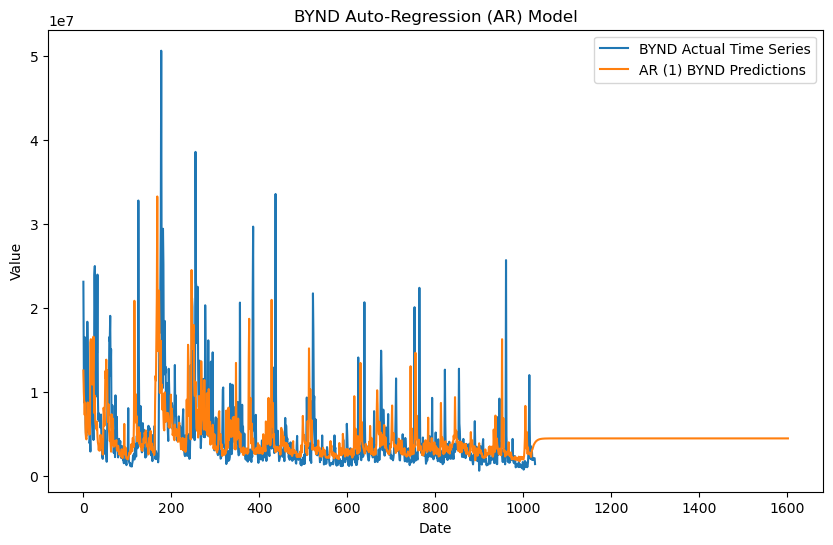

C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


                            AutoReg Model Results                             
Dep. Variable:                   OKTA   No. Observations:                 1028
Model:                     AutoReg(1)   Log Likelihood              -16266.939
Method:               Conditional MLE   S.D. of innovations        1830939.966
Date:                Sun, 30 Jul 2023   AIC                          32539.878
Time:                        15:33:50   BIC                          32554.681
Sample:                             1   HQIC                         32545.497
                                 1028                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.069e+06   8.31e+04     12.861      0.000    9.06e+05    1.23e+06
OKTA.L1        0.5336      0.026     20.190      0.000       0.482       0.585
                                    Roots           

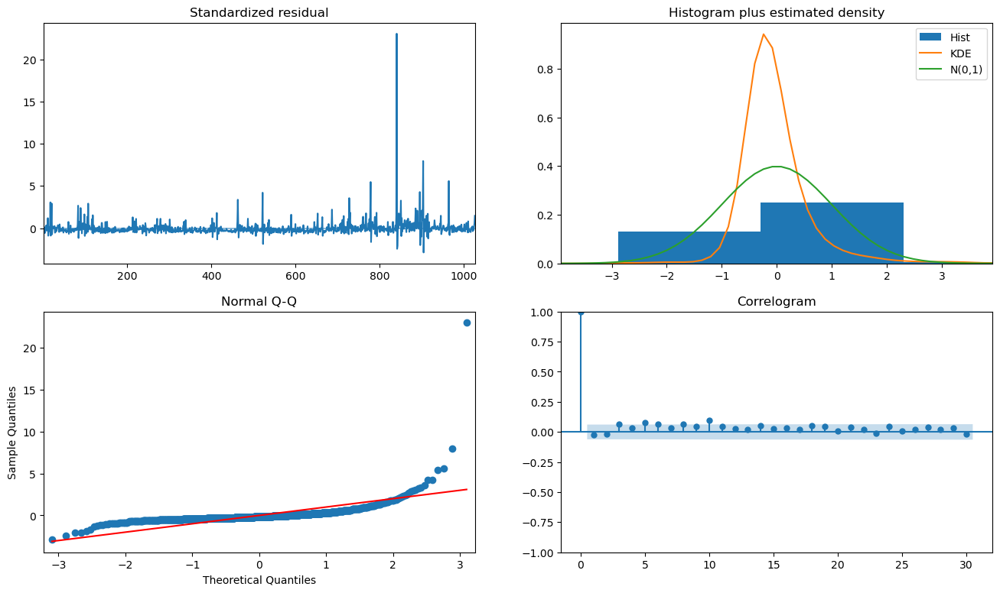

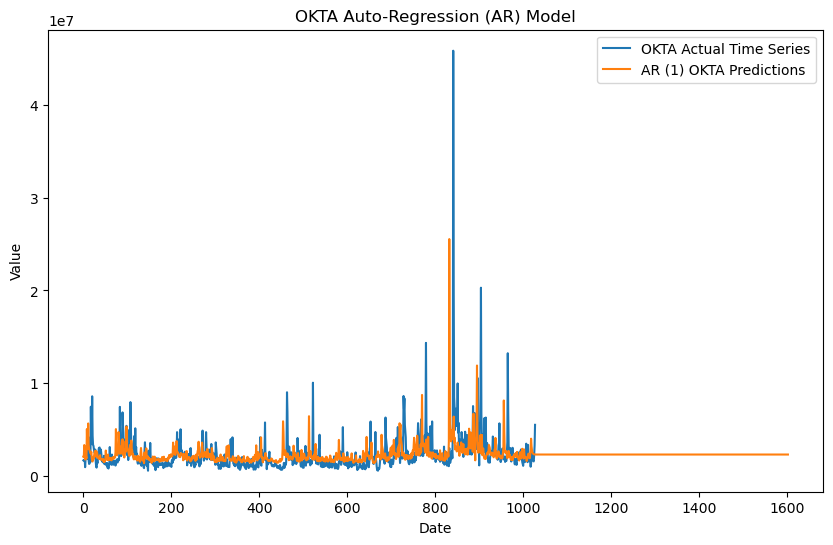

In [134]:

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

def assess_predictions(Predicted, Observed):
    total_error_sqr = 0
    total_predicted = 0
    predictions = Predicted
    values = Observed
    for value, prediction in zip(values, predictions):
        if prediction > 0 and value > 0:
            total_error_sqr += (prediction-value)**2
            total_predicted += 1
    return total_error_sqr / total_predicted

ar_res = []

for comp in companies:
    
    p = [1]
    
    if comp == "AAPL":
        p = [1,2,3,4,5,8]
    if comp == "MSTF":
        p = [1,2,3]
    if comp == "KO":
        p = [1,2,3]
    if comp == "SHOP":
        p = [1,2,3,4,5]
    if comp == "BYND":
        p = [1,4]
    if comp == "OKTA":
        p = [1]
    
    mod = AutoReg(time_series[comp], p, old_names=False)
    res = mod.fit()
    print(res.summary())
    
    fig = plt.figure(figsize=(16, 9))
    fig = res.plot_diagnostics(fig=fig, lags=30)
    
    lag_order = 1

    ar_predictions = res.predict(start=10, end=len(data)-1)
    
    std_dev = math.sqrt(assess_predictions(ar_predictions,time_series[comp]))
    ar_res.append(std_dev)
    
    print(f"{comp} std_dev: ", std_dev)
    comparison_table_simple[f"{comp}_AR"] = ar_predictions

     # Plot the original data and the AR predictions
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].values, label=f'{comp} Actual Time Series')
    plt.plot(ar_predictions.values, label=f'AR ({lag_order}) {comp} Predictions')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title(f'{comp} Auto-Regression (AR) Model')
    plt.show()
    

The QQ (quantile-quantile) plot is a graphical tool used to assess whether the residuals of the AR model follow a normal distribution. The QQ plot compares the quantiles of the residuals to the quantiles of a theoretical normal distribution. If the residuals follow a normal distribution, the points on the QQ plot will lie approximately along a straight line.
If the points on the QQ plot fall along a straight line, the residuals follow a normal distribution, indicating that the AR model fits the data well.

Our datasets show that the datapoints are close to a straight line, indicating our models' predictions are accurate. 

### 4.4. Add Results to Table

In [135]:
result_of_comparison.loc[len(result_of_comparison)] = ar_res 
    

In [139]:
methods = ["naive","seasonal naive","moving average","MAES","AR"]
result_of_comparison.index = methods

In [140]:
result_of_comparison

,AAPL,MSFT,KO,SHOP,BYND,OKTA
naive,5.083146e+07,1.368333e+07,8.316687e+06,1.508324e+07,6.073303e+06,2.736679e+06
seasonal naive,7.113667e+07,1.762653e+07,1.078115e+07,1.966840e+07,7.215559e+06,2.419642e+06
moving average,3.389949e+07,9.341367e+06,5.521202e+06,9.793103e+06,3.370299e+06,1.731866e+06
MAES,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
AR,4.079367e+07,1.221551e+07,6.738192e+06,1.271050e+07,4.882129e+06,2.253834e+06


### 4.5. Simulation of automated trading

In this automated trading simulation, we will use historical stock volume data for Shopify Inc. (SHOP). The simulation will involve implementing a simple trading strategy based on the moving average crossover technique.

To begin the simulation, we will collect historical stock volume data for the selected companies, including daily or weekly volume points and trading volume information. This historical data will serve as the foundation for our trading strategy.

The simulation will dynamically generate buy and sell signals based on the moving average crossovers it identifies in the historical data. When a buy signal is triggered, it will virtually purchase shares of the respective company's stock, and when a sell signal is triggered, it will sell the shares.

The moving average crossover strategy involves using two moving averages: short-term and long-term moving averages. The short-term moving average represents recent volume trends, while the long-term moving average represents a more extended period trend. When the short-term moving average crosses above the long-term moving average, it generates a buy signal, indicating a potential uptrend. 

In [141]:
import math

def train_ar(values, order):
    target_vector = np.array(values[order:])
    lagged_values = []
    for i in range(len(values) - order):
        lagged_values.append(values[i:i+order])
    design_matrix = np.array(lagged_values)
    return np.linalg.inv(design_matrix.transpose() @ design_matrix) @ design_matrix.transpose() @ target_vector

def predict(coeffs, data):
    predicted_values = [math.nan] * len(coeffs)
    for i in range(len(coeffs), len(data)):
        predicted_values.append(np.dot(coeffs, data[i-len(coeffs):i]))
    return np.array(predicted_values)


training_data = np.log(time_series["SHOP"]['2019-01-01':'2021-01-01'])
model_coeffs = train_ar(training_data, 3)

print (model_coeffs)

test_data = time_series["SHOP"]['2021-01-01':'2023-06-01']
log_prediction = predict(model_coeffs, np.log(test_data))


test_data = test_data.to_frame()
test_data = test_data.rename(columns={'SHOP_Predicted': 'SHOP'})
test_data['SHOP_Predicted'] = np.exp(log_prediction)
test_data = test_data.dropna()
test_data.head()


test_data['isHolding'] = test_data['SHOP_Predicted'] > test_data['SHOP'].shift() * 1.004
test_data.head()




[0.21632631 0.11464436 0.66861047]


,SHOP,SHOP_Predicted,isHolding
Date,,,
2021-01-07,13765000,1.282298e+07,False
2021-01-08,13781000,1.237025e+07,False
2021-01-11,11108000,1.344193e+07,False
2021-01-12,9022000,1.184593e+07,True
2021-01-13,6938000,1.005877e+07,True


In [142]:
last_price = None
portfolio_value = 10_000
values = []
for ts, (close, _, is_holding) in test_data.iterrows():
    if is_holding:
        portfolio_value *= close / last_price
    last_price = close
    values.append(portfolio_value)
test_data['EquityValue'] = values
test_data.head()

,SHOP,SHOP_Predicted,isHolding,EquityValue
Date,,,,
2021-01-07,13765000,1.282298e+07,False,10000.000000
2021-01-08,13781000,1.237025e+07,False,10000.000000
2021-01-11,11108000,1.344193e+07,False,10000.000000
2021-01-12,9022000,1.184593e+07,True,8122.074181
2021-01-13,6938000,1.005877e+07,True,6245.948866


<Axes: xlabel='Date'>

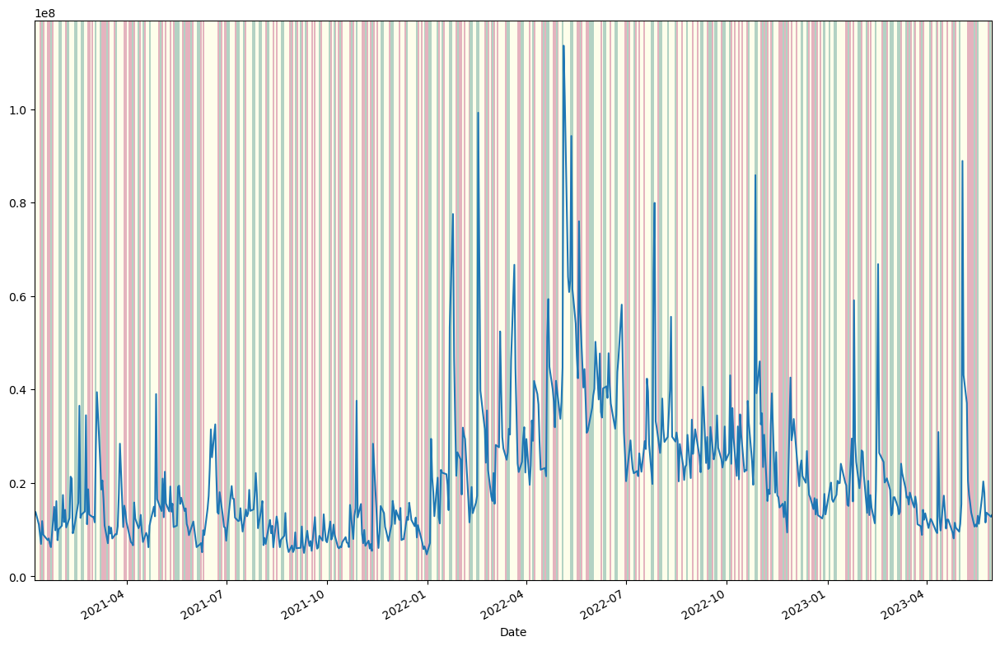

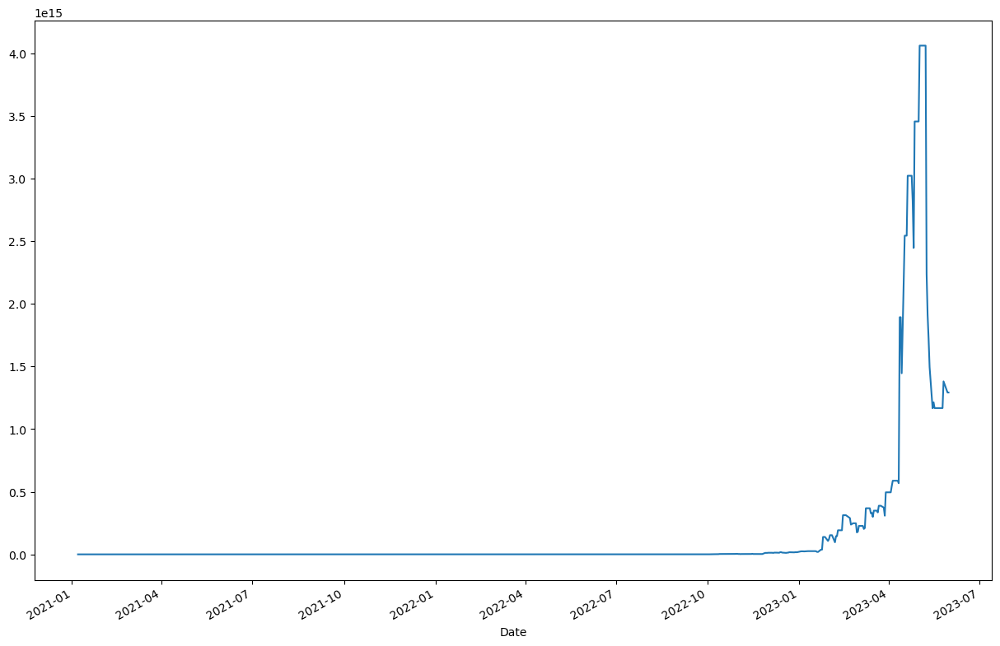

In [143]:
offsets = (test_data['isHolding'] * (test_data['SHOP'].shift(-1) - test_data['SHOP']))
has_increased = ((test_data['SHOP'].shift(-1) > test_data['SHOP']) & test_data['isHolding']).astype(int)
has_decreased = ((test_data['SHOP'].shift(-1) < test_data['SHOP']) & test_data['isHolding']).astype(int)
plt.rcParams['figure.figsize'] = [15, 10]
ax = test_data['SHOP'].plot()
offset_start = has_increased.index[0].timestamp() / 24 / 60 / 60
offset_end = has_increased.index[-1].timestamp() / 24 / 60 / 60
ax.pcolorfast((offset_start, offset_end), ax.get_ylim(), (has_increased - has_decreased).values[np.newaxis], cmap='RdYlGn', alpha = 0.3)
plt.figure()
test_data['EquityValue'].plot()

### Summary

The first graph depicts the trading activity, with the blue curve representing the volume of shares traded. The price at the end of the period remains relatively unchanged compared to the beginning. A yellow background denotes non-holding days, while losing days are marked in pink and winning days in green.

The second graph shows the portfolio value, which has increased over time, even though the stock price remains constant from the beginning to the end.

## 5. Assignment 5


We were introduced to the Monte Carlo methods for calculating unknown qualities in this topic. We performed statistical sampling for future trajectories and practised kernel density estimation.
Monte Carlo methods involve generating random samples or numbers to represent a system's uncertainty or randomness. These samples are drawn from a probability distribution representing the uncertainty in the variables of interest.
Once the random samples are generated, each sample's desired quantity is evaluated. The results from all the samples are used to calculate an average to obtain an estimate of the unknown quantity.

The accuracy of the Monte Carlo estimate improves as the number of random samples increases. This is based on the Law of Large Numbers, which states that the average of many independent random samples converges to the true expected value as the sample size grows.

We will implement the Monte Carlo code.
We will use it to draw graphs of potential futures for some of our portfolio data - specifically the Beyond company data.
Then we will graph the kernel density function for the data set.
Afterwards, we will come up with interesting questions about our datasets and use Monte Carol methods to get answers.


### 5.1. Implement the Monte Carlo code

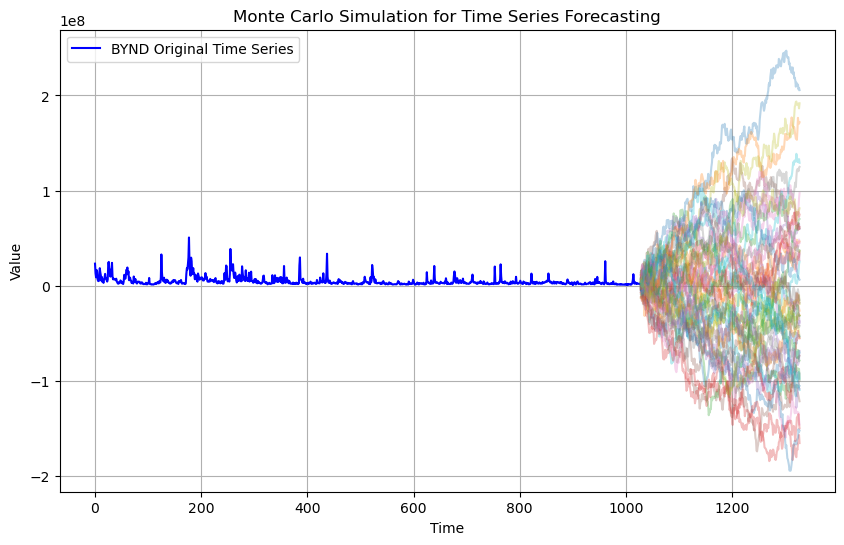

In [146]:
import numpy as np
import matplotlib.pyplot as plt

def monte_carlo_forecast(time_series_data, n_forecast, n_simulations):
    
    data_len = len(time_series_data)

    # Convert the data to a numpy array for easier manipulation
    data = np.array(time_series_data)

    # Initialize the list to store the forecasted values
    forecast_values = []

    # Perform Monte Carlo simulation
    for _ in range(n_simulations):
        # Generate random noise from a normal distribution
        noise = np.random.normal(loc=0, scale=np.std(data), size=n_forecast)

        # Forecast future values using a random walk model with added noise
        forecast = [data[-1]]
        for i in range(n_forecast):
            forecast.append(forecast[-1] + noise[i])

        forecast_values.append(forecast[1:])

    return forecast_values

# Example usage:

n_forecast = 300  # Replace this with the number of future values to forecast
n_simulations = 50  # Replace this with the number of Monte Carlo simulations

forecasts = monte_carlo_forecast(time_series['BYND'], n_forecast, n_simulations)

# Create a time index for the forecasted values
time_index = np.arange(len(time_series['BYND']), len(time_series['BYND']) + n_forecast)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(time_series['BYND'].values, label='BYND Original Time Series', color='blue')

for i, forecast in enumerate(forecasts):
    plt.plot(time_index, forecast, alpha=0.3)

plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Monte Carlo Simulation for Time Series Forecasting')
plt.legend()
plt.grid(True)
plt.show()

We can see that the monte carlo algorithm has produced a wide range of trajectories of potential forecasts. 

### 5.2. Graph the kernel density function

The kernel density function provides a smooth estimate of the underlying probability density function. It helps to overcome the limitations of discrete data points and provides a continuous representation of the data distribution.
Unlike parametric methods that assume a specific distribution for the data, the kernel density function does not make any assumptions about the data distribution. It can adapt to various data patterns and is suitable for unimodal and multi-modal distributions. The kernel density function can smooth out noise and fluctuations in the data, making it easier to identify underlying trends and patterns.

Monte Carlo methods generate random samples from a given distribution, and KDE helps estimate the underlying probability density function based on these samples. KDE is non-parametric, meaning it does not assume a specific functional form for the data distribution, making it suitable for a wide range of data patterns.

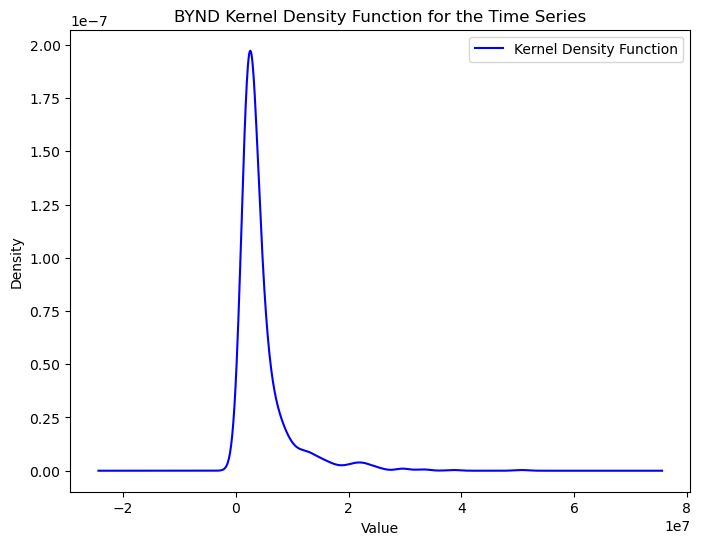

In [147]:
plt.figure(figsize=(8, 6))
time_series['BYND'].plot(kind='kde', label='Kernel Density Function', color='blue')
plt.xlabel('Value')
plt.title('BYND Kernel Density Function for the Time Series')
plt.legend()
plt.show()

The KDE graph has a strong peak at zero. It indicates a significant concentration of data points around the zero value in the dataset. In other words, a large proportion of the data points have values very close to zero, indicating that the volume of shares traded for most of the time series was zero.

### 5.3. Interesting questions about the data's future

#### 5.3.1. What is the range of potential values for the next 30 days for a specific time series?

We will use the Monte Carlo simulation to estimate the range of potential values for the next 30 days. We will simulate multiple future paths of the time series by considering the uncertainty in its parameters (e.g., drift and volatility). We will randomly sample the parameters for each simulation and project the time series forward for 30 days. We can obtain a distribution of potential values for the time series after 30 days by running many simulations. The range of potential values can be determined by examining the minimum and maximum values of the distribution.

We will use GBM model for this pridiction. GBM (Geometric Brownian Motion) drift represents the average rate of growth or expected return of an asset over time. It is a key component in the GBM model, which is commonly used to simulate the movement of stock prices.

In the GBM model, stock prices are assumed to follow a stochastic process characterized by two components: drift and volatility. The drift represents the average trend or expected movement of the stock price over time. It can be interpreted as the rate of return that an investor might expect on average.

GBM could be useful if we are using it as the underlying model to generate future trajectories or scenarios for the time series, which was part of the initial discussion on Monte Carlo simulations. In this case, we can simulate future stock price movements using the GBM model, incorporating drift and volatility, to explore a range of possible outcomes and understand the uncertainty associated with forecasting stock prices.

In [5]:
# Function to simulate future paths using geometric Brownian motion (GBM) model
def simulate_gbm_drift_volatility(data, drift, volatility, time_steps, num_simulations):
    dt = 1  # Time step
    simulations = np.zeros((num_simulations, time_steps))
    simulations[:, 0] = data.iloc[-1]  # Start from the last available data point

    for i in range(1, time_steps):
        z = np.random.normal(0, 1, num_simulations)  # Generate random samples from N(0, 1)
        simulations[:, i] = simulations[:, i - 1] * np.exp((drift - 0.5 * volatility**2) * dt + volatility * np.sqrt(dt) * z)

    return simulations

    plt.xlabel('Days')
    plt.ylabel('Time Series Value')
    plt.title('Monte Carlo Simulation - Sensitivity Analysis of Drift and Volatility')
    #plt.legend()
    plt.show()
    
    


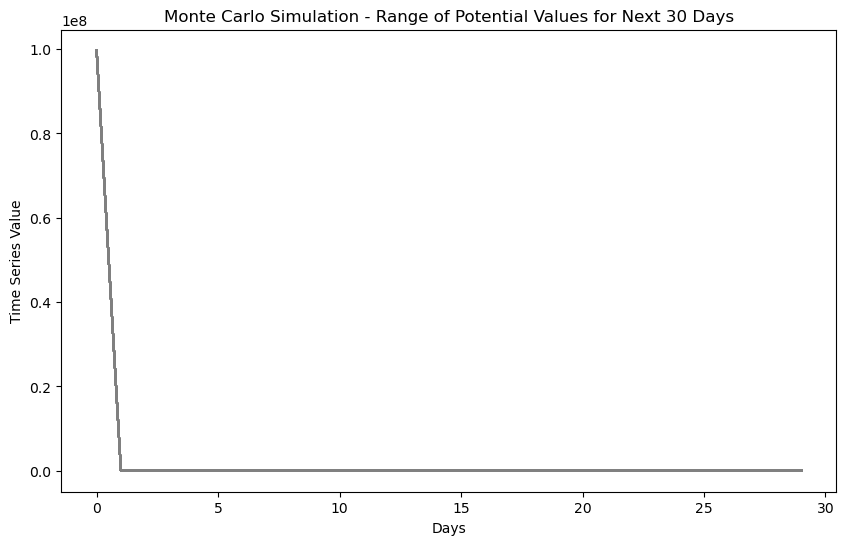

In [9]:

#Range of potential values for the next 30 days
time_steps_q1 = 30
num_simulations_q1 = 100
simulations_q1 = simulate_gbm_drift_volatility(time_series["AAPL"], time_series["AAPL"].diff().mean(), time_series["AAPL"].diff().std(), time_steps_q1, num_simulations_q1)

#print(simulations_q1)

plt.figure(figsize=(10, 6))
plt.plot(simulations_q1.T, color='gray', alpha=0.2)
plt.xlabel('Days')
plt.ylabel('Time Series Value')
plt.title('Monte Carlo Simulation - Range of Potential Values for Next 30 Days')
plt.show()

We can identify possible best-case and worst-case scenarios for the time series by analysing the range of potential values. 

#### 5.3.2. What is the probability of the time series exceeding a certain threshold in the next 90 days?

We will again use the Monte Carlo simulation to estimate the probability of the time series exceeding a certain threshold in the next 90 days. Similar to the first question, we will simulate multiple future time series paths by sampling the parameters and projecting the time series forward for 90 days. For each simulation, we will check if the time series crosses the specified threshold within 90 days. By counting the number of simulations where the threshold is exceeded and dividing it by the total number of simulations, we can obtain the probability of the time series exceeding the threshold.

In [10]:
threshold_q2 = 150
time_steps_q2 = 90
num_simulations_q2 = 1000

# Function to calculate the probability of exceeding a certain threshold in the next 'time_steps' days
def probability_exceed_threshold(data, threshold, time_steps, num_simulations):
    simulations = simulate_gbm_drift_volatility(data, data.diff().mean(), data.diff().std(), time_steps, num_simulations)
    exceed_threshold = (simulations[:, -1] > threshold).mean()

    return exceed_threshold


prob_exceed_threshold_q2 = probability_exceed_threshold(time_series["AAPL"], threshold_q2, time_steps_q2, num_simulations_q2)

print(f"Probability of exceeding threshold ({threshold_q2}) in the next {time_steps_q2} days: {prob_exceed_threshold_q2:.2f}")


Probability of exceeding threshold (150) in the next 90 days: 0.00


#### 5.3.3. How does the uncertainty in the drift and volatility affect the future paths?

To understand how the uncertainty in the drift and volatility affects the future paths of the time series, we will perform a sensitivity analysis using the Monte Carlo method. We will run multiple simulations while varying the values of drift and volatility within a reasonable range. For each combination of drift and volatility, we will project the time series forward for a specific time horizon (e.g., 30 days or 90 days). By comparing the resulting future paths from different combinations of drift and volatility, we can observe how parameter changes impact the overall uncertainty and variability of the time series predictions.



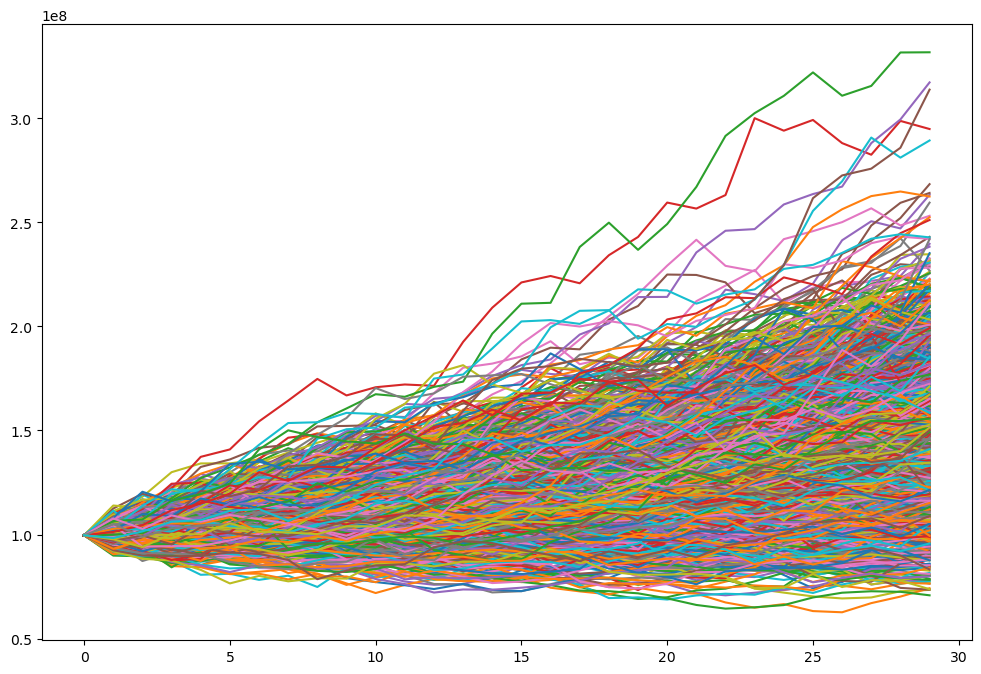

In [11]:

drift_values_q3 = np.linspace(0.005, 0.02, 5)
volatility_values_q3 = np.linspace(0.01, 0.04, 5)
time_steps_q3 = 30
num_simulations_q3 = 100

# Function to perform sensitivity analysis of drift and volatility on future paths
def sensitivity_analysis(data, drift_values, volatility_values, time_steps, num_simulations):
    plt.figure(figsize=(12, 8))
    for drift_val in drift_values:
        for volatility_val in volatility_values:
            simulations = simulate_gbm_drift_volatility(data, drift_val, volatility_val, time_steps, num_simulations)
            plt.plot(simulations.T, label=f"Drift={drift_val:.3f}, Volatility={volatility_val:.3f}")


sensitivity_analysis(time_series["AAPL"], drift_values_q3, volatility_values_q3, time_steps_q3, num_simulations_q3)



## 6. Assignment 6


Overall, we have learned to decompose a time series into behavioural components, analyse the components separately and combine the answers. We have learned the principles behind and how to use three methods for smoothing: moving averages, exponential smoothing and lo(w)ess, and how to implement two of these. We have learned how to use FFTs to determine periodic behaviours like seasonality. We have (optionally) learned abstractly how Fourier transforms work. 
We have learned the general principles of using particular decomposition techniques and how to use them for forecasting.


We will implement some smoothing code.
Then we will use it to draw graphs of smoothed versions of some of your time series.
We will use the inbuilt FFT to find seasonality in some of our series.
Decompose and forecast the individual components and combine them.
And compare results with some of our results from previous sessions.

### 6.1. Implement Lo(w)ess and exponential smoothing code

STL (Seasonal-Trend decomposition using Loess) is an approach to break down a time series into its fundamental components: seasonal, trend, and remainder. STL effectively estimates the trend component by employing the Loess method, which is a locally weighted regression technique. This trend represents a flexible approximation of the inherent pattern present in the data.


In [159]:
from statsmodels.nonparametric.smoothers_lowess import lowess

# Define the alpha parameter (smoothing factor)
alpha = 0.2

def lowess_forecasting(data, frac=0.1):
    # Perform LOESS smoothing on the numerical timestamp and time series data
    smoothed_data = lowess(data, data.index.to_julian_date(), frac=frac)
    
    smoothed_df = pd.DataFrame(smoothed_data, columns=['Timestamp', 'Smoothed_Value'])
    smoothed_df.set_index(pd.to_datetime(smoothed_df['Timestamp']), inplace=True)

    return smoothed_df


# Exponential Smoothing Forecasting Technique
def exponential_smoothing(series, alpha):
    smoothed_data = [series[0]]  # Initialize the first smoothed value as the first data point
    for i in range(1, len(series)):
        smoothed_value = alpha * series[i] + (1 - alpha) * smoothed_data[i-1]
        smoothed_data.append(smoothed_value)
    return pd.Series(smoothed_data, index=series.index)


### 6.2. draw graphs of smoothed versions

We will plot the original data along with the exponentially smoothed data

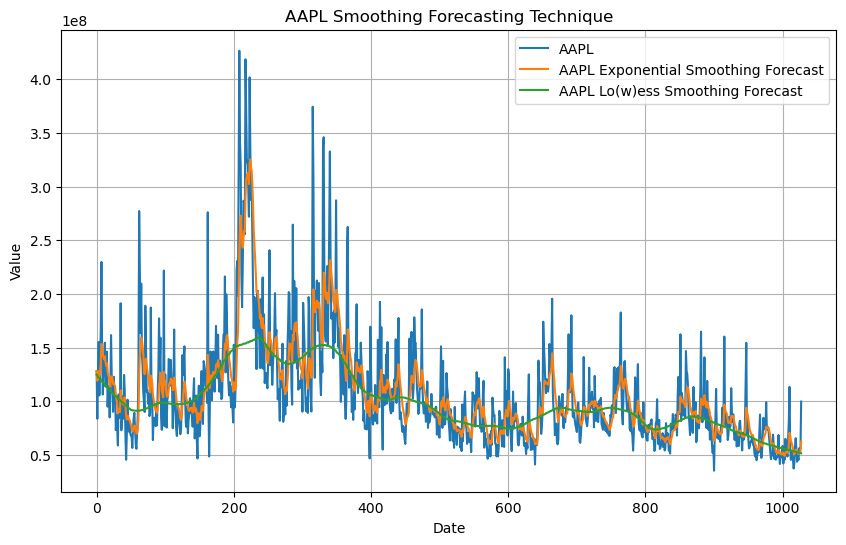

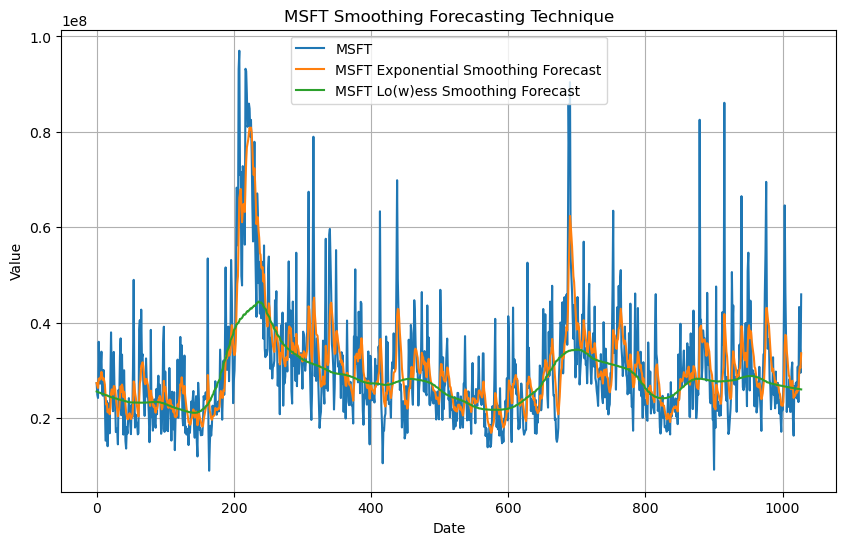

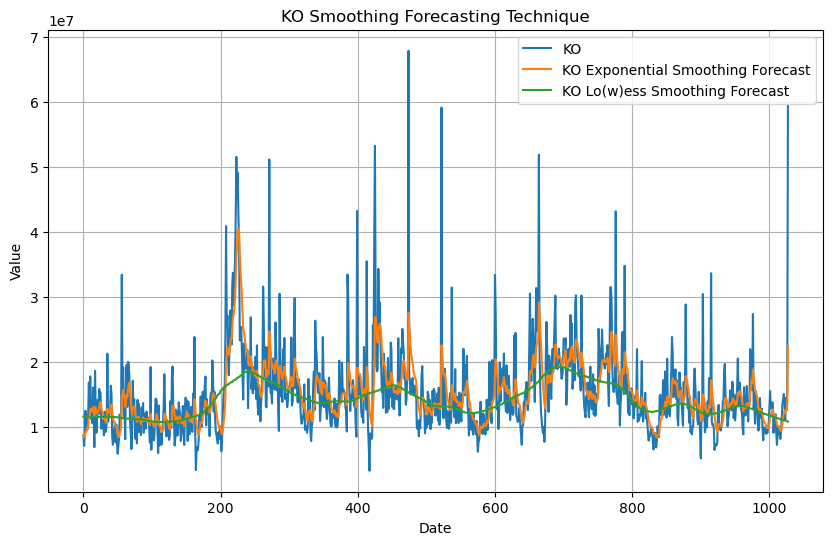

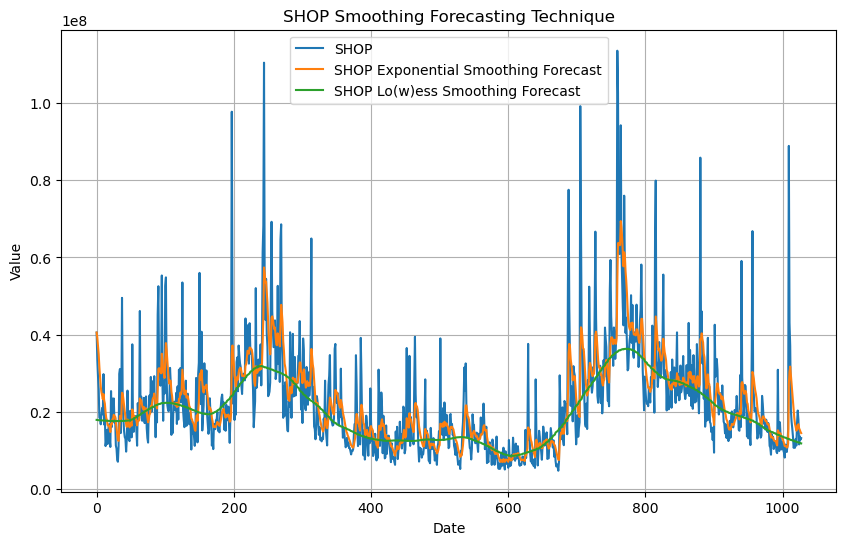

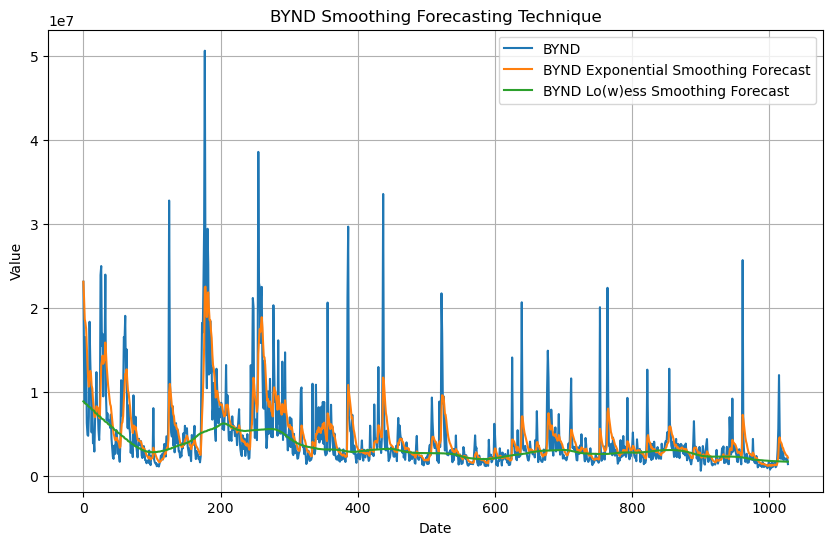

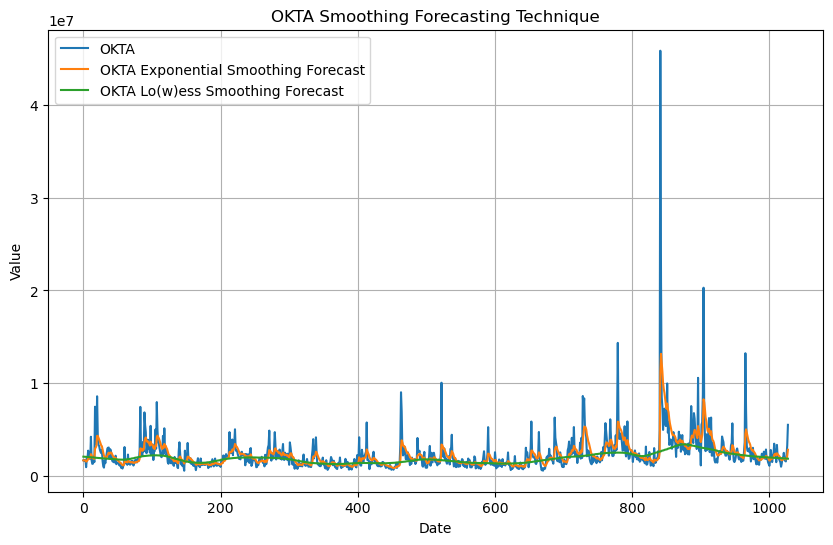

In [160]:

# Execute the exponential smoothing forecasting technique
for comp in companies:
    exponential_smoothed_result = exponential_smoothing(time_series[comp], alpha)

    lowess_smoothed_result = lowess_forecasting(time_series[comp])
    
    # Plot the original data along with the exponential smoothing forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].values, label=comp)
    plt.plot(exponential_smoothed_result.values, label=f'{comp} Exponential Smoothing Forecast')
    plt.plot(lowess_smoothed_result["Smoothed_Value"].values, label=f'{comp} Lo(w)ess Smoothing Forecast')
    #plt.plot(time_series[comp].values - lowess_smoothed_result["Smoothed_Value"].values, label=f'{comp} Lo(w)ess Residue')
    #plt.plot(time_series[comp].values - lowess_smoothed_result["Smoothed_Value"].values, label=f'{comp} Exponential Smoothing Residue')
    plt.title(f'{comp} Smoothing Forecasting Technique')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

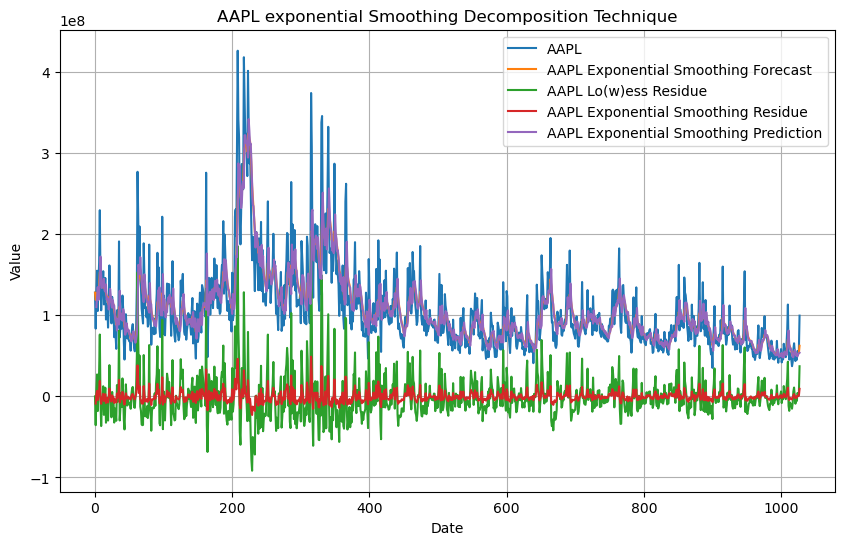

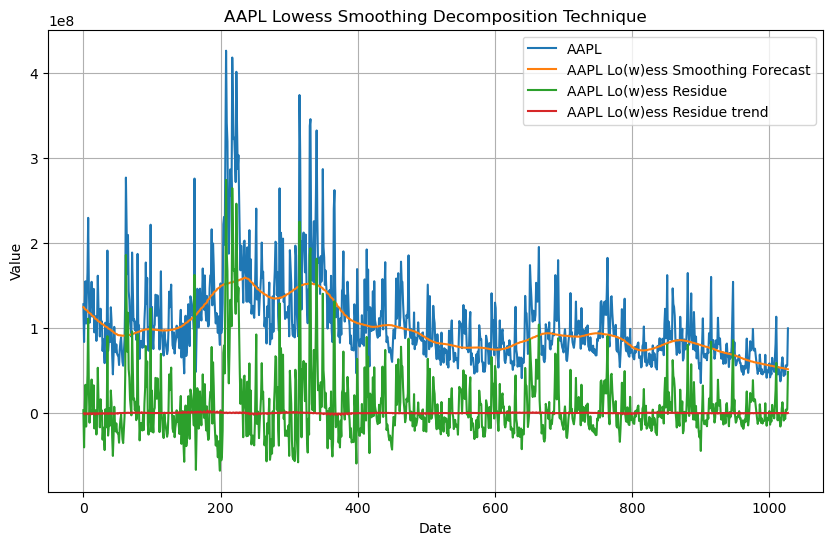

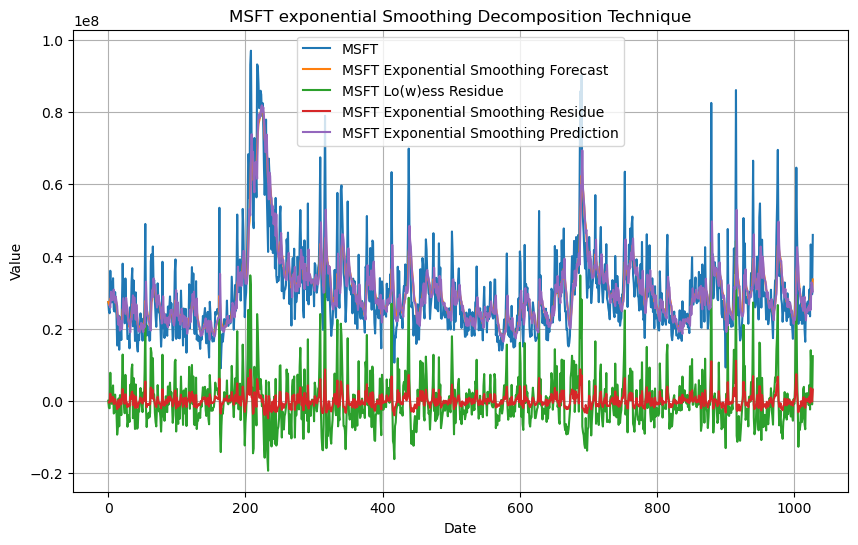

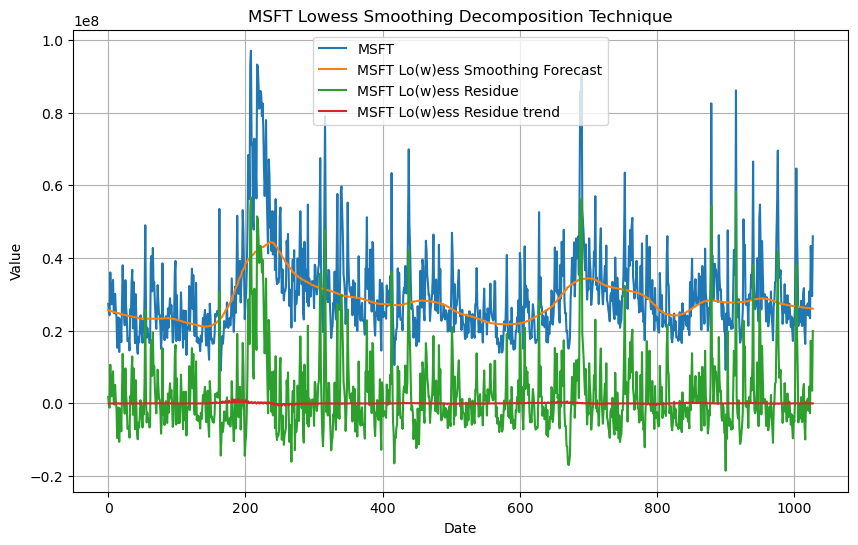

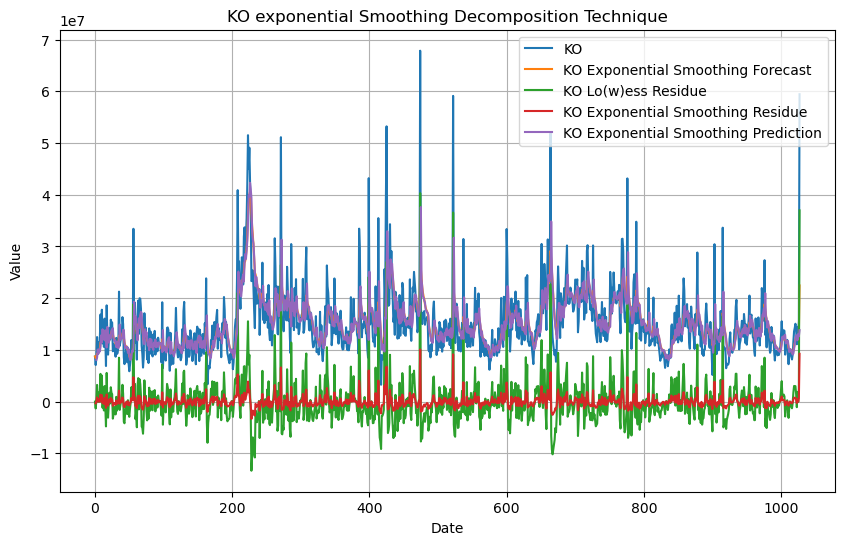

...

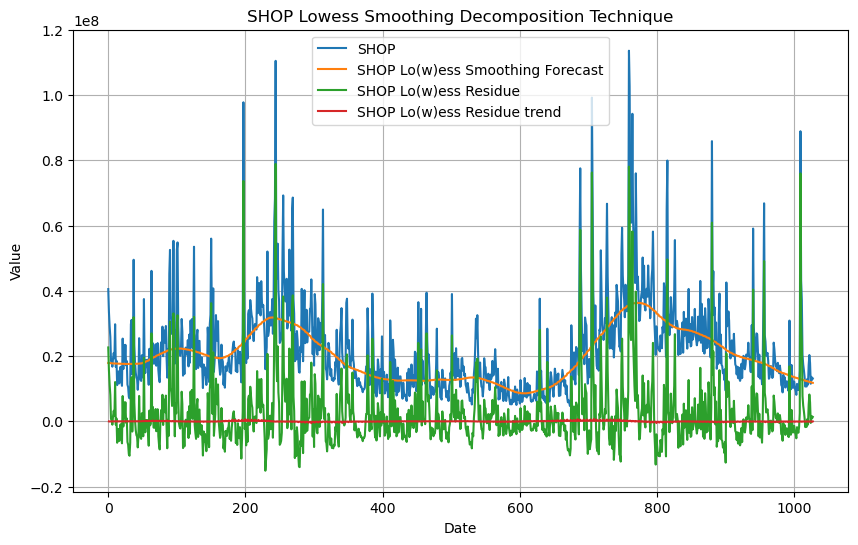

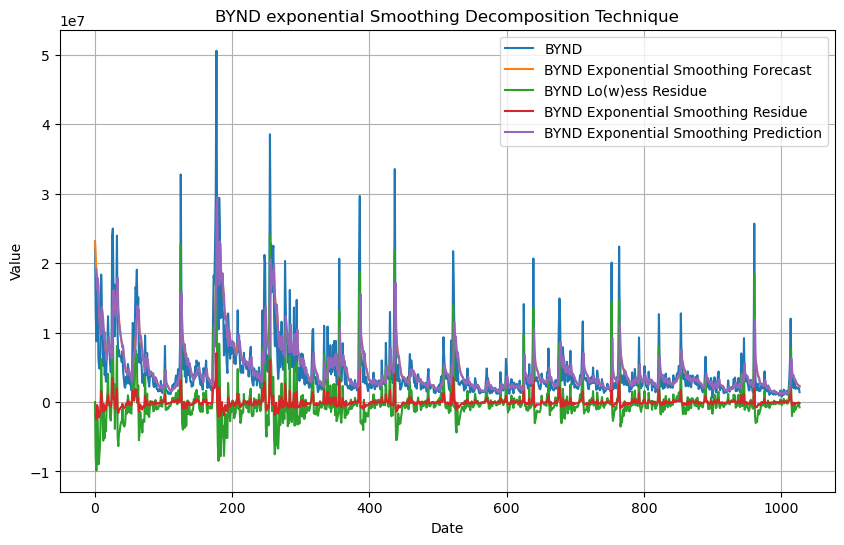

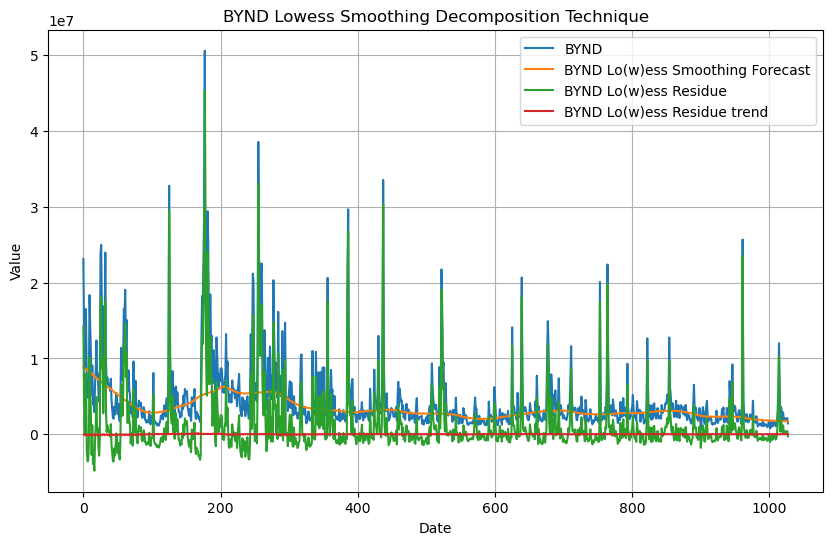

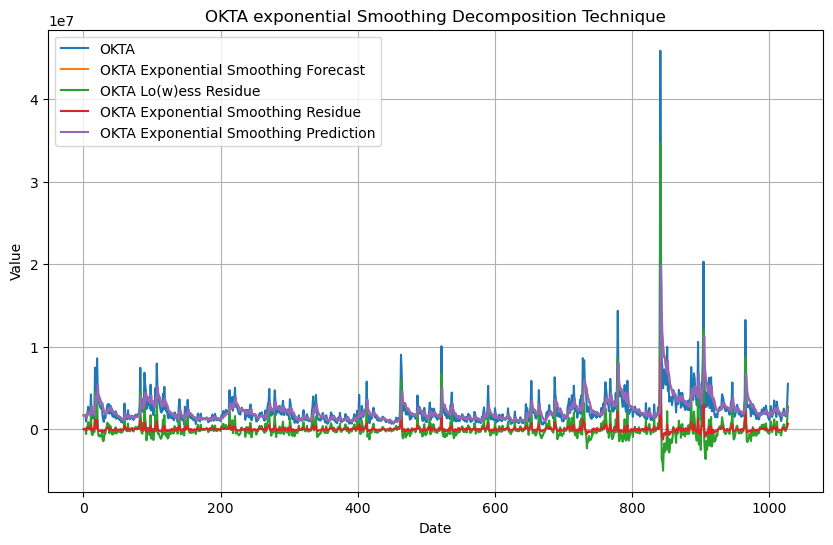

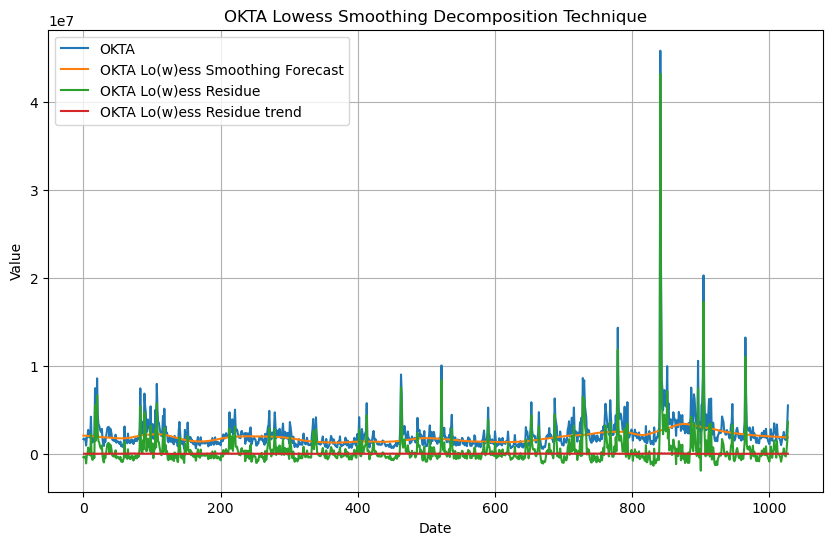

In [186]:
def rmse(predicted, actual):
    diffs = predicted - actual
    return math.sqrt(np.mean(diffs ** 2))

smoothing_res_1 = []
smoothing_res_2 = []

# Execute the exponential smoothing forecasting technique
for comp in companies:
    exponential_smoothed_result = exponential_smoothing(time_series[comp], alpha)
    time_series[f"{comp}_exponential_smoothed"] = exponential_smoothed_result.values
    comparison_table_simple[f"{comp}_exponential_smoothed"] = time_series[f"{comp}_exponential_smoothed"]
    
    lowess_smoothed_result = lowess_forecasting(time_series[comp])
    time_series[f"{comp}_lowess_smoothed"] = lowess_smoothed_result["Smoothed_Value"].values
    comparison_table_simple[f"{comp}_lowess_smoothed"] = time_series[f"{comp}_lowess_smoothed"]
    
    
    # Plot the original data along with the exponential smoothing forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].values, label=comp)
    plt.plot(exponential_smoothed_result.values, label=f'{comp} Exponential Smoothing Forecast')
    plt.plot(time_series[comp].values - exponential_smoothed_result.values, label=f'{comp} Lo(w)ess Residue')
    plt.plot(exponential_smoothed_result.values - exponential_smoothed_result.shift(1).values, label=f'{comp} Exponential Smoothing Residue')
    
    plt.plot(2* exponential_smoothed_result.shift(1).values - exponential_smoothed_result.shift(2).values, label=f'{comp} Exponential Smoothing Prediction')
    
    plt.title(f'{comp} exponential Smoothing Decomposition Technique')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot the original data along with the exponential smoothing forecast
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].values, label=comp)
    plt.plot(lowess_smoothed_result["Smoothed_Value"].values, label=f'{comp} Lo(w)ess Smoothing Forecast')
    plt.plot(time_series[comp].values - lowess_smoothed_result["Smoothed_Value"].values, label=f'{comp} Lo(w)ess Residue')
    plt.plot(lowess_smoothed_result["Smoothed_Value"].values - lowess_smoothed_result["Smoothed_Value"].shift(1).values, label=f'{comp} Lo(w)ess Residue trend')
    
    plt.title(f'{comp} Lowess Smoothing Decomposition Technique')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    smoothing_res_1.append(rmse(exponential_smoothed_result.values,time_series[comp].values))
    smoothing_res_2.append(rmse(lowess_smoothed_result["Smoothed_Value"].values,time_series[comp].values))
    


###  6.3. Use FFT to find seasonality

The Fast Fourier Transform (FFT) is employed to detect seasonality in time series data as it enables us to break down the time series into its fundamental frequency components. Seasonality pertains to recurring patterns that manifest at regular intervals within the data. Through FFT, we can pinpoint the prominent frequencies or cycles in the data, revealing the underlying seasonal patterns.

AAPL Seasonal period: 1028 data points


C:\Users\adibr\AppData\Local\Temp\ipykernel_364\1857186908.py:27: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(fft_freq, fft_magnitude, use_line_collection=True)


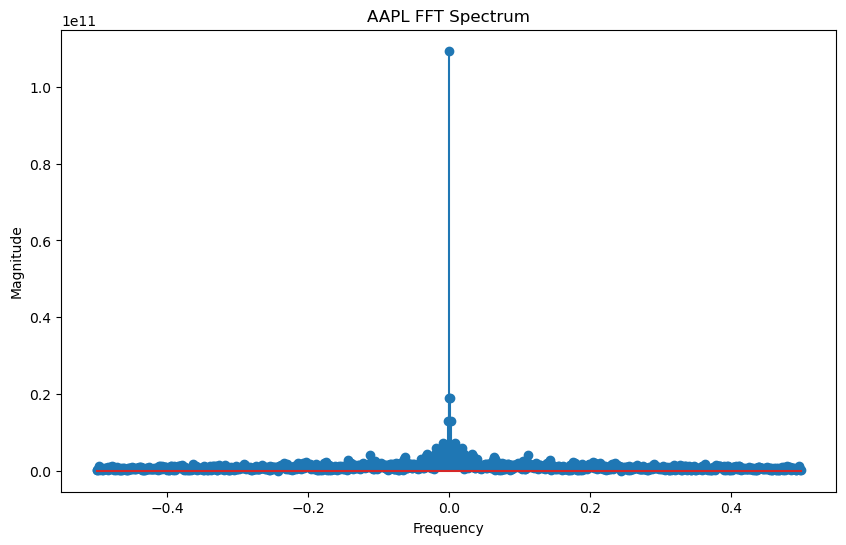

MSFT Seasonal period: 514 data points


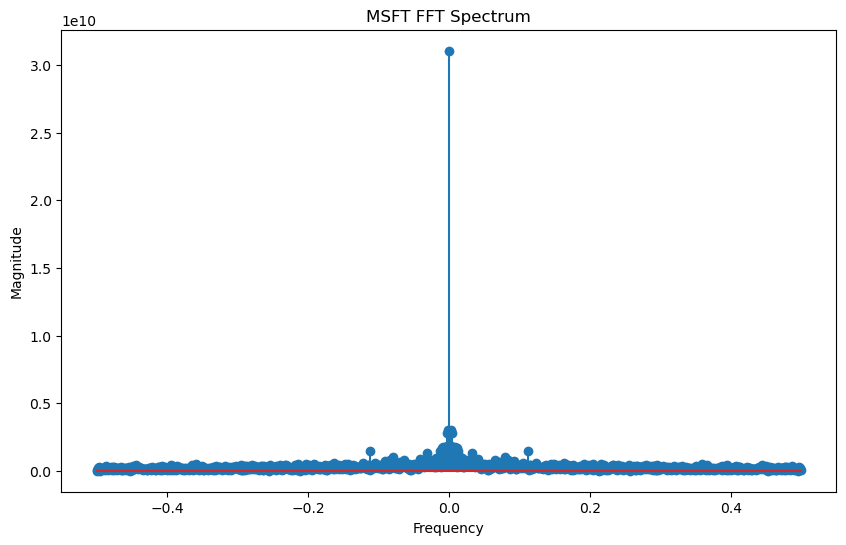

KO Seasonal period: 257 data points


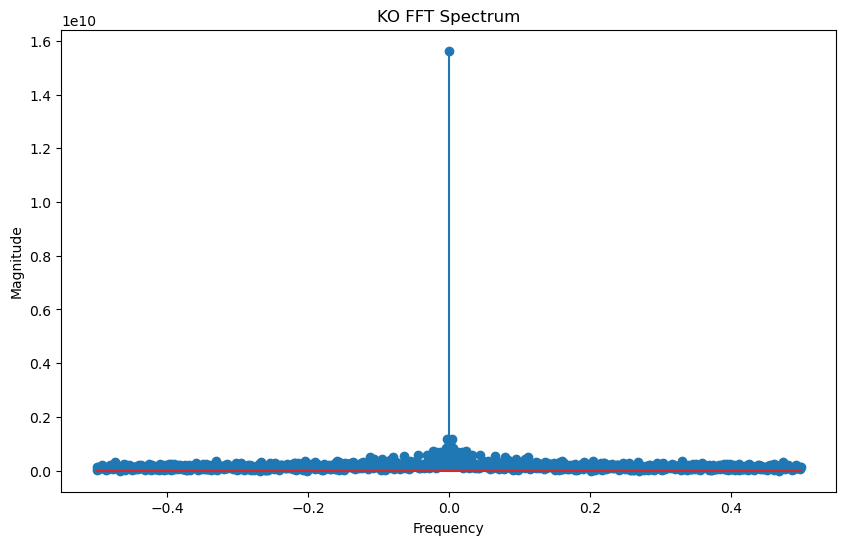

SHOP Seasonal period: 514 data points


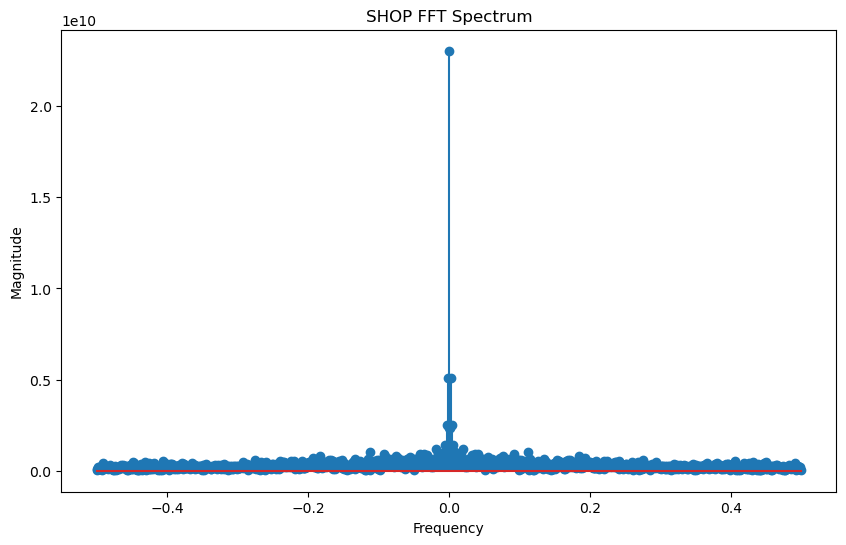

BYND Seasonal period: 1028 data points


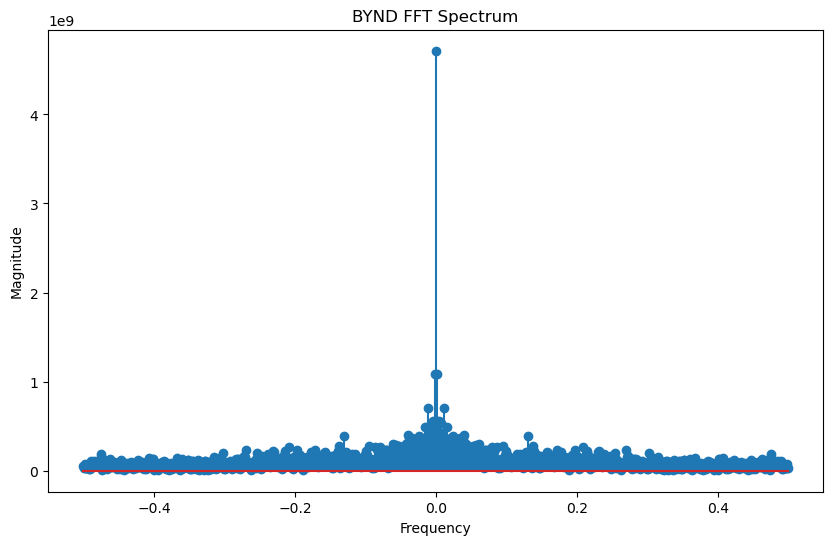

OKTA Seasonal period: 1028 data points


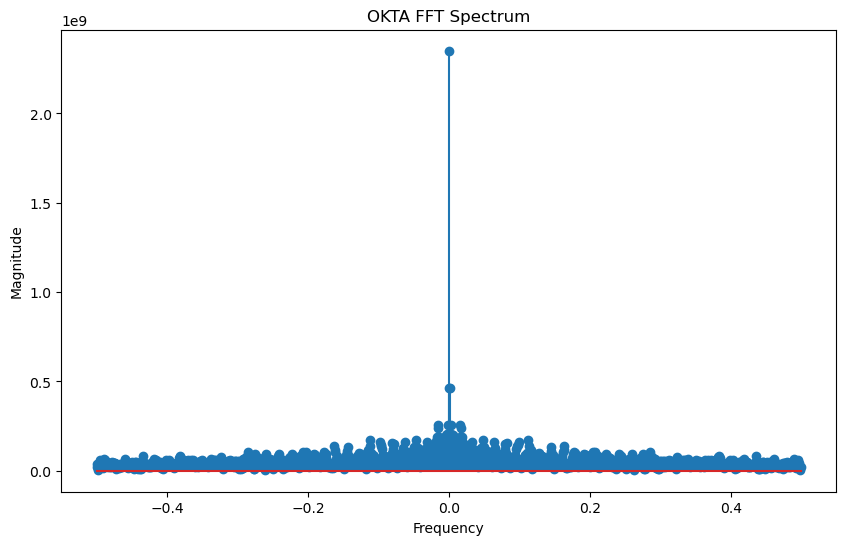

In [163]:
def find_seasonality(data):
    # Perform the Fast Fourier Transform (FFT) on the time series data
    fft_result = np.fft.fft(data)
    fft_magnitude = np.abs(fft_result)
    fft_freq = np.fft.fftfreq(len(data))

    # Find the index of the peak frequency (excluding the DC component at index 0)
    peak_freq_index = np.argmax(fft_magnitude[1:]) + 1
    peak_freq = np.abs(fft_freq[peak_freq_index])

    # Calculate the seasonal period (in terms of data points)
    seasonal_period = int(round(1 / peak_freq))

    return seasonal_period

for comp in companies: 
    # Find the seasonal period using FFT
    seasonal_period = find_seasonality(time_series[comp])
    print(f"{comp} Seasonal period: {seasonal_period} data points")

    # Plot the FFT spectrum
    fft_result = np.fft.fft(time_series[comp])
    fft_magnitude = np.abs(fft_result)
    fft_freq = np.fft.fftfreq(len(time_series[comp]))

    plt.figure(figsize=(10, 6))
    plt.stem(fft_freq, fft_magnitude, use_line_collection=True)
    plt.xlabel('Frequency')
    plt.ylabel('Magnitude')
    plt.title(f'{comp} FFT Spectrum')
    plt.show()

For the FFT analysis, since each datapoint, each series represents a volume value of 1 day. 

The results are interpreted in the following way: 

AAPL Seasonal period: 1028 data points - 34.26 months - 2.81 years

MSFT Seasonal period: 514 data points - 17.13 months - 1.40 years

KO Seasonal period: 257 data points - 8.56 months - 0.70 years

SHOP Seasonal period: 514 data points - 17.13 months - 1.40 years

BYND Seasonal period: 1028 data points - 34.26 months - 2.81 years

OKTA Seasonal period: 1028 data points - 34.26 months - 2.81 years


For most time series, the seasonal cycle is 2.8 years. This finding indicates that the data series contain consistent and predictable patterns within each cycle, which can influence the values at specific points in time. 


### 6.4. Compare results

Let's compare the results of the RMSE calculations from all algorithms and plot the Forecasting results of the last two algorithms: Lowess and Exponential Smoothing.

In [187]:
result_of_comparison.loc[len(result_of_comparison)] = smoothing_res_1 
result_of_comparison.loc[len(result_of_comparison)] = smoothing_res_2

In [188]:
methods = ["naive","seasonal naive","moving average","MAES","AR","exponential Smoothing","Lowess"]
result_of_comparison.index = methods


In [189]:
result_of_comparison

,AAPL,MSFT,KO,SHOP,BYND,OKTA
naive,5.083146e+07,1.368333e+07,8.316687e+06,1.508324e+07,6.073303e+06,2.736679e+06
seasonal naive,7.113667e+07,1.762653e+07,1.078115e+07,1.966840e+07,7.215559e+06,2.419642e+06
moving average,3.389949e+07,9.341367e+06,5.521202e+06,9.793103e+06,3.370299e+06,1.731866e+06
MAES,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
AR,4.079367e+07,1.221551e+07,6.738192e+06,1.271050e+07,4.882129e+06,2.253834e+06
exponential Smoothing,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
Lowess,4.061690e+07,1.071169e+07,6.244808e+06,1.113150e+07,4.444338e+06,2.054281e+06


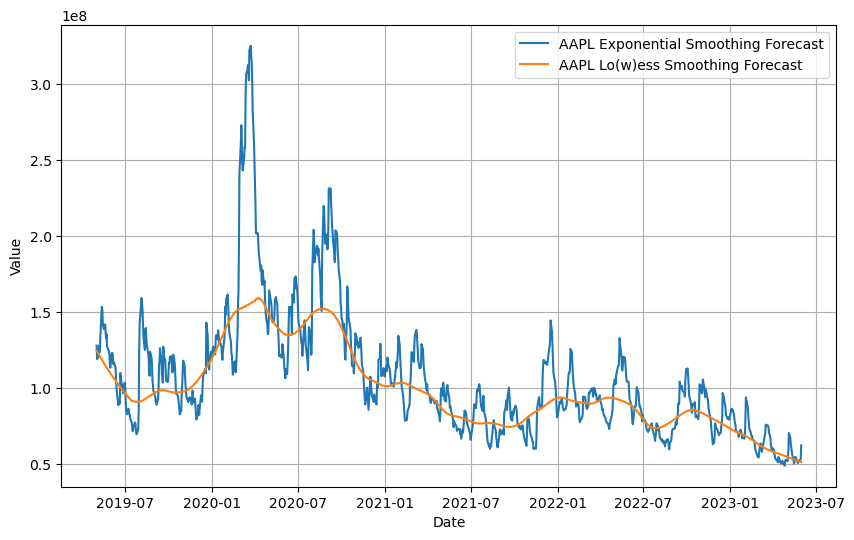

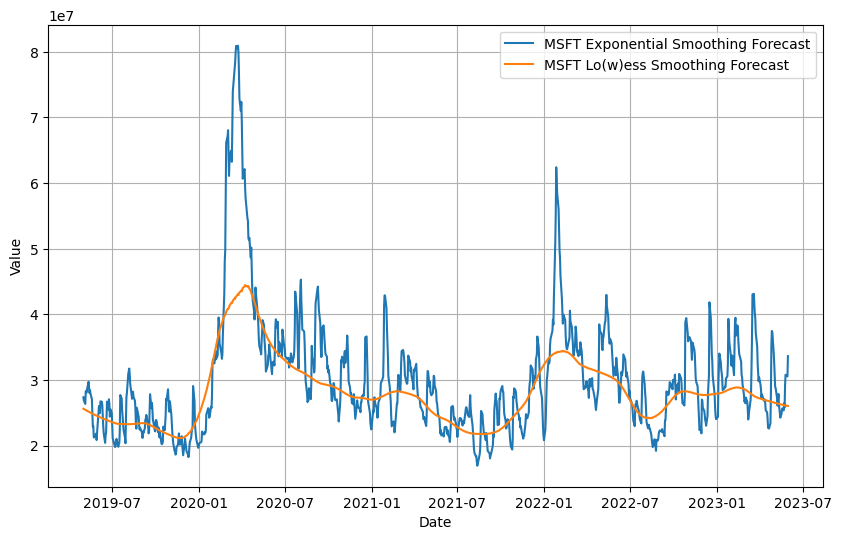

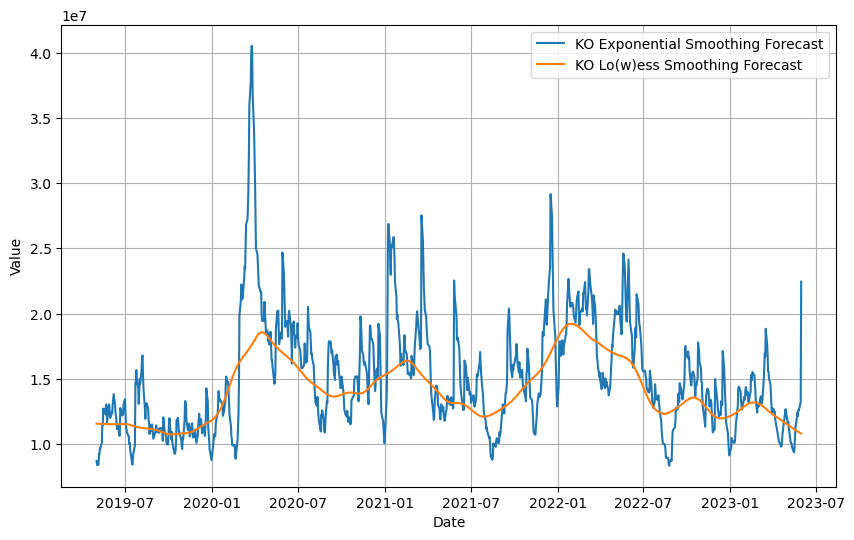

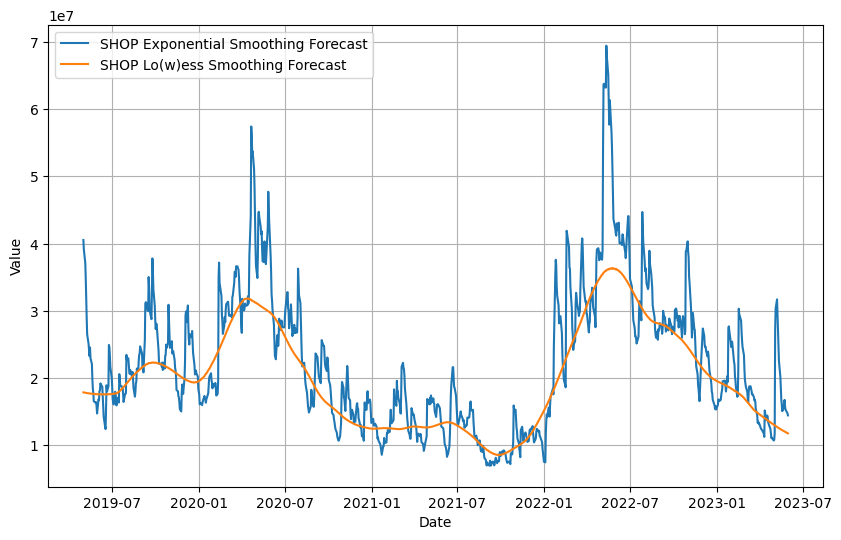

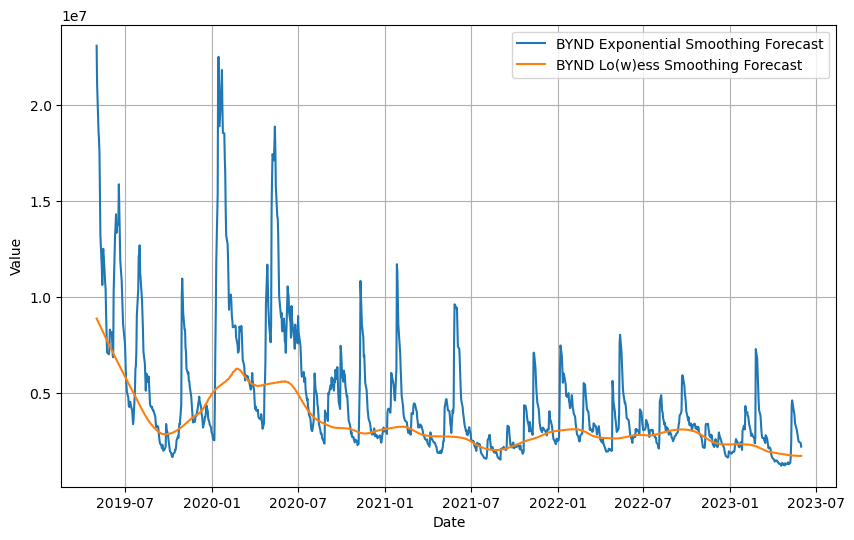

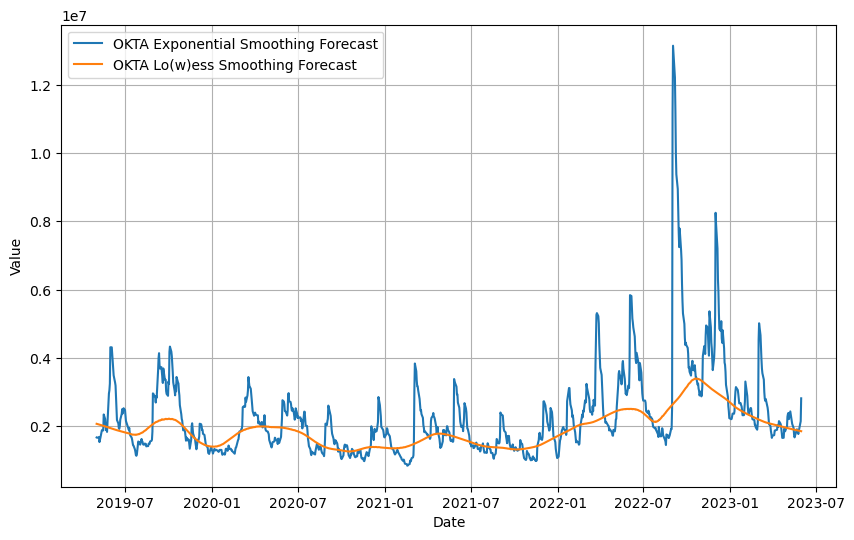

In [183]:
for comp in companies:
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[f"{comp}_exponential_smoothed"], label=f'{comp} Exponential Smoothing Forecast')
    plt.plot(time_series[f"{comp}_lowess_smoothed"], label=f'{comp} Lo(w)ess Smoothing Forecast')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show
    

We can see that the exponential smoothing produced better results over Lowess for all time series regarding RMSE value. 
On the other hand, Lowess produces better trend lines for the data, producing more apparent prediction models with fewer fluctuations. Overall both algorithms have managed to capture the time series pattern and replicate its trend.

Exponential smoothing is more suitable for stock volume prediction when the time series exhibits short-term trends and seasonality. It works well for relatively smooth and well-behaved volume patterns. It is computationally efficient, easy to implement, and can handle seasonality and trends, making it suitable for quick and simple volume forecasts.

LOESS is more appropriate for stock volume prediction when the time series has complex and nonlinear patterns, irregular fluctuations, or significant noise. It can capture local variations and adapt to changing volume patterns over time.

As observed from the plots above, stock volume data exhibits various characteristics, including short-term trends, seasonality, and irregular fluctuations. If the volume data follows a relatively smooth pattern with clear trends and seasonality, exponential smoothing can be a reasonable choice due to its simplicity and efficiency. On the other hand, if the volume data is noisy, irregular, or exhibits nonlinear patterns, LOESS may be more appropriate for capturing the local fluctuations and providing more accurate predictions.

## 7. Assignment 7

In this topic, we used gradient descent to calculate MA coefficients.
We have described and implemented the Hannan-Rissanen algorithm. We tested for stationarity and used differences (repeatedly, if necessary) to achieve it, and eventually, we did a whole ARIMA analysis from start to finish.

First, we will describe the parts of ARIMA and explain them:

The AR part of ARIMA looks at the relationship between the current value of the time series and its past values. It assumes that the future value of the time series can be predicted based on its previous values. The AR part deals with longer-term trends in the data. If the AR coefficient is positive, an increase in past values leads to an increase in future values, indicating a positive trend. Conversely, if the AR coefficient is negative, an increase in past values leads to a decrease in future values, indicating a negative trend.

The I part of ARIMA is about differencing the time series data. It involves subtracting the previous value from the current value to remove any underlying trend or seasonality in the data. This helps make the time series stationary, which requires the AR and MA components to work effectively.

The MA part of ARIMA examines the relationship between the current value of the time series and past forecast errors (the difference between actual and predicted values). It deals with short-term shocks and random fluctuations in the data. If the MA coefficient is positive, it means that past forecast errors positively influence future values, indicating a tendency to correct overestimations. If the MA coefficient is negative, it means that past forecast errors negatively influence future values, indicating a tendency to correct for underestimations.


We will now add ARIMA calculations for our data and compare results to other methods.

### 7.1. Add ARIMA calculations

To find the optimal parameters (p, d, q) and seasonal parameters (P, D, Q, m) for an ARIMA model using the CAF (Cumulative Autocorrelation Function) and PCAF (Partial Cumulative Autocorrelation Function) methods, we can use the pmdarima library. The pmdarima library is a Python package that provides tools for automatically selecting the optimal ARIMA parameters.

Due to the lack of time and the extensive runtime finding the optimal parameters consumed, I have decided to run the Arima model with static p, d, and q values of 2,1,14 for all datasets selected arbitrarily. 

In [211]:
%pip install pmdarima
import pmdarima as pm

Note: you may need to restart the kernel to use updated packages.


Arima for  AAPL


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


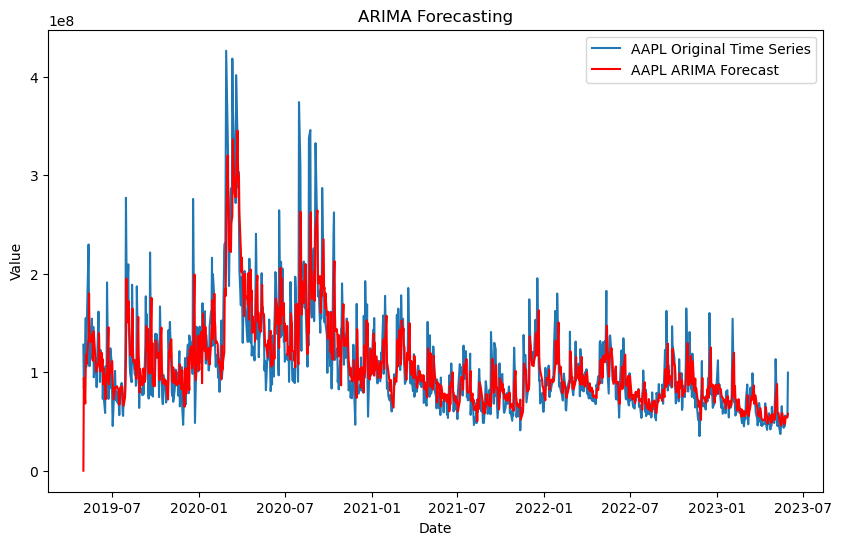

Arima for  MSFT


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


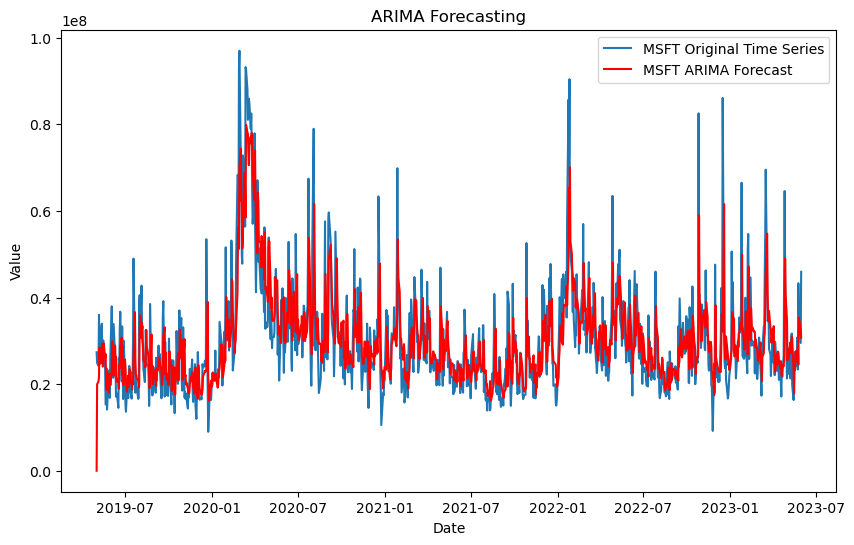

Arima for  KO


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


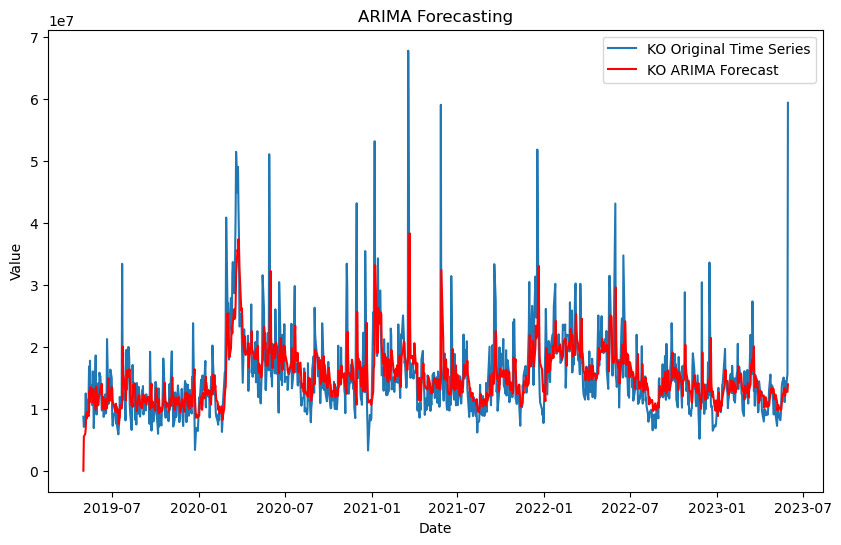

Arima for  SHOP


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


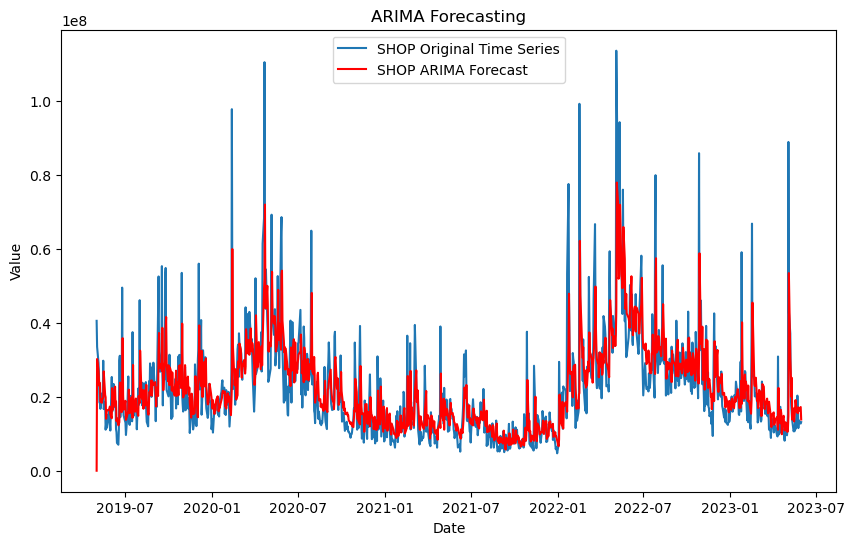

Arima for  BYND


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


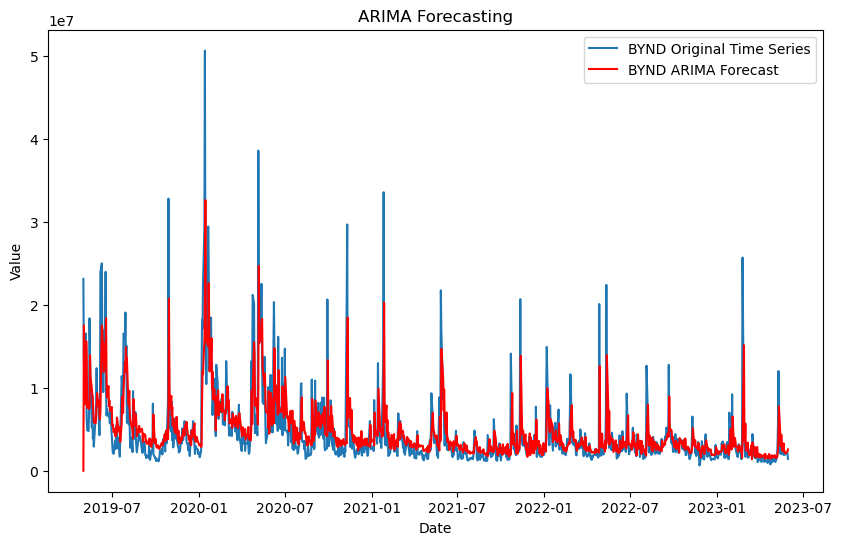

Arima for  OKTA


C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\adibr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


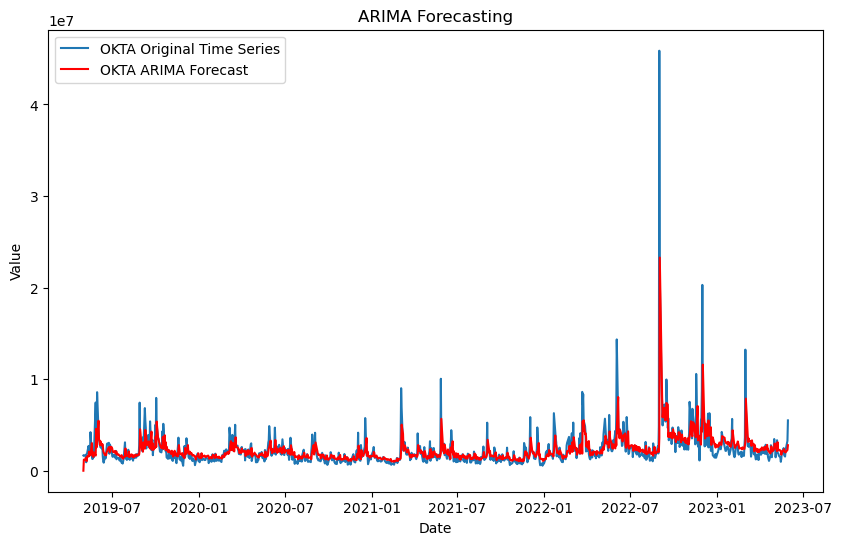

In [220]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib import pyplot
import statsmodels.api as sm
from pmdarima.arima import ndiffs, nsdiffs, auto_arima

def rmse(predicted, actual):
    diffs = predicted - actual
    return math.sqrt(np.mean(diffs ** 2))

arima_rmse = []

for comp in companies:
    #plot_acf(time_series[comp])
    #plot_pacf(time_series[comp])
    
    print("Arima for ", comp)
    #pyplot.show()
    
    # Determine the differencing order using the ndiffs function
    #print("find d")
    #d = ndiffs(time_series[comp], test='adf')
    
    #print("find seasonal d")
    # Determine the seasonal differencing order using the nsdiffs function
    #seasonal_d = nsdiffs(time_series[comp], m=12, test='ch')
    
    # Find the optimal ARIMA parameters using the auto_arima function
    #model = auto_arima(time_series[comp], d=d, seasonal=True, D=seasonal_d, m=12, suppress_warnings=True)

    # Get the optimal ARIMA orders
    #p, d, q = model.order
    #P, D, Q, m = model.seasonal_order
    
    #print("Optimal ARIMA Order: (p, d, q) =", p, d, q)
    #print("Optimal Seasonal Order: (P, D, Q, m) =", P, D, Q, m)

    p, d, q = 2,1,14
    
    model = sm.tsa.arima.ARIMA(time_series[comp], order=(p,d,q), trend='n')
    res = model.fit()
    # print(res.summary())
    time_series[f'{comp}_Arima_Prediction'] = res.predict()
    comparison_table_simple[f'{comp}_Arima_Prediction'] = time_series[f'{comp}_Arima_Prediction']
    arima_rmse.append(rmse(time_series[f'{comp}_Arima_Prediction'],time_series[comp]))
    
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].index, time_series[comp], label=f'{comp} Original Time Series')
    plt.plot(time_series[f'{comp}_Arima_Prediction'].index, time_series[f'{comp}_Arima_Prediction']  , label=f'{comp} ARIMA Forecast', color='red')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('ARIMA Forecasting')
    plt.show()
    


### 7.2. compare results

The table below shows that the ARIMA model has produced results similar to the previous modelling algorithms.
The best results so far belong to the Exponential smoothing algorithm. The EM algorithm has produced the lowest RMSE values for all companies' share volume time series. 


In [222]:
result_of_comparison.loc[len(result_of_comparison)] = arima_rmse 

methods = ["naive","seasonal naive","moving average","MAES","AR","exponential Smoothing","Lowess","ARIMA"]
result_of_comparison.index = methods

result_of_comparison

,AAPL,MSFT,KO,SHOP,BYND,OKTA
naive,5.083146e+07,1.368333e+07,8.316687e+06,1.508324e+07,6.073303e+06,2.736679e+06
seasonal naive,7.113667e+07,1.762653e+07,1.078115e+07,1.966840e+07,7.215559e+06,2.419642e+06
moving average,3.389949e+07,9.341367e+06,5.521202e+06,9.793103e+06,3.370299e+06,1.731866e+06
MAES,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
AR,4.079367e+07,1.221551e+07,6.738192e+06,1.271050e+07,4.882129e+06,2.253834e+06
exponential Smoothing,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
Lowess,4.061690e+07,1.071169e+07,6.244808e+06,1.113150e+07,4.444338e+06,2.054281e+06
ARIMA,3.215436e+07,8.628873e+06,5.589698e+06,9.726845e+06,3.562793e+06,1.797649e+06


## 8. Extra topics

### 8.1. Recurrent Neural Networks - LSTM

To use Recurrent Neural Networks (RNNs) for time series prediction in Python, we can utilize the TensorFlow library, which provides a powerful API for building and training RNNs. Specifically, we will use the Long Short-Term Memory (LSTM) variant of RNNs, as LSTMs are well-suited for capturing long-term dependencies in sequential data.

Long Short-Term Memory (LSTM) is a structure that can be used in neural networks. It is a recurrent neural network (RNN) type that expects the input as a sequence of features. It is useful for data such as time series or strings of text.

LSTM works like a smart memory unit. It can remember important information from the past and use it to make predictions. This makes LSTM particularly useful for tasks that involve sequences, like predicting stock prices, weather forecasts, or text generation.

When given a series of data points, it looks at each data point and decides which information to remember and which information to forget. It stores the relevant information in memory, discarding the less important details. As it sees more data points, it refines its memory and better predicts what will happen next.

LSTM is especially effective when the data has long-term patterns or dependencies that simpler models like linear regression or traditional feedforward neural networks may struggle to capture. Its ability to retain information over longer data sequences helps it make more accurate predictions in complex and dynamic scenarios.

** Caution: this section takes a long time to run ** 

In [ ]:
%pip install tensorflow
%pip install scikit-learn

Epoch 1/10
686/686 - 5s - loss: 0.0118 - 5s/epoch - 7ms/step
Epoch 2/10
686/686 - 2s - loss: 0.0109 - 2s/epoch - 3ms/step
Epoch 3/10
686/686 - 2s - loss: 0.0104 - 2s/epoch - 3ms/step
Epoch 4/10
686/686 - 2s - loss: 0.0100 - 2s/epoch - 3ms/step
Epoch 5/10
686/686 - 2s - loss: 0.0099 - 2s/epoch - 3ms/step
Epoch 6/10
686/686 - 2s - loss: 0.0098 - 2s/epoch - 3ms/step
Epoch 7/10
686/686 - 2s - loss: 0.0097 - 2s/epoch - 3ms/step
Epoch 8/10
686/686 - 2s - loss: 0.0098 - 2s/epoch - 3ms/step
Epoch 9/10
686/686 - 2s - loss: 0.0097 - 2s/epoch - 3ms/step
Epoch 10/10
686/686 - 2s - loss: 0.0095 - 2s/epoch - 3ms/step
11/11 [==============================] - 0s 5ms/step


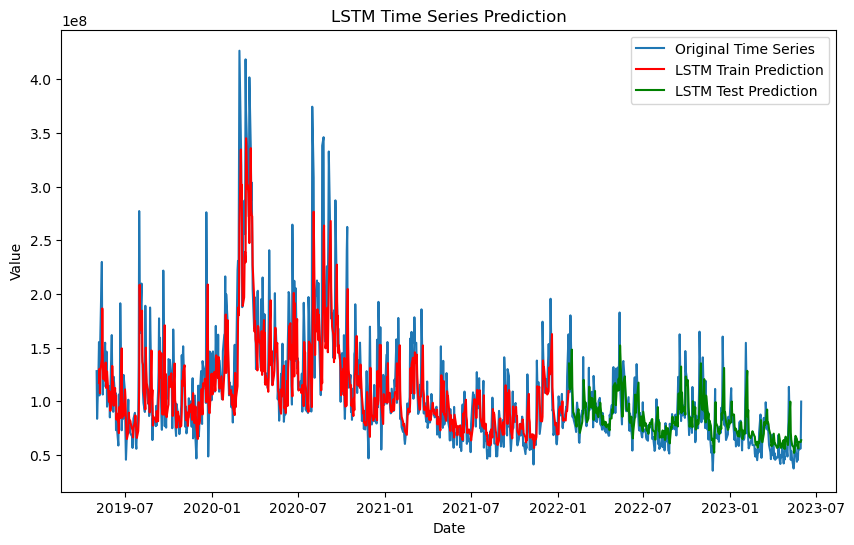

Epoch 1/10
686/686 - 5s - loss: 0.0150 - 5s/epoch - 7ms/step
Epoch 2/10
686/686 - 1s - loss: 0.0113 - 1s/epoch - 2ms/step
Epoch 3/10
686/686 - 1s - loss: 0.0109 - 1s/epoch - 2ms/step
Epoch 4/10
686/686 - 1s - loss: 0.0105 - 1s/epoch - 2ms/step
Epoch 5/10
686/686 - 1s - loss: 0.0101 - 1s/epoch - 2ms/step
Epoch 6/10
686/686 - 1s - loss: 0.0099 - 1s/epoch - 2ms/step
Epoch 7/10
686/686 - 1s - loss: 0.0099 - 1s/epoch - 2ms/step
Epoch 8/10
686/686 - 1s - loss: 0.0098 - 1s/epoch - 2ms/step
Epoch 9/10
686/686 - 1s - loss: 0.0097 - 1s/epoch - 2ms/step
Epoch 10/10
686/686 - 1s - loss: 0.0098 - 1s/epoch - 2ms/step
11/11 [==============================] - 0s 3ms/step


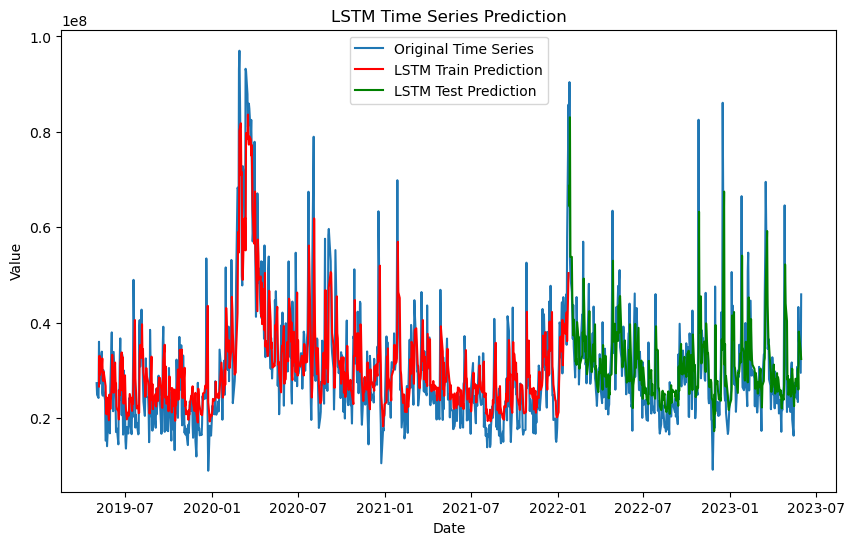

Epoch 1/10
686/686 - 5s - loss: 0.0100 - 5s/epoch - 7ms/step
Epoch 2/10
686/686 - 2s - loss: 0.0093 - 2s/epoch - 3ms/step
Epoch 3/10
686/686 - 2s - loss: 0.0089 - 2s/epoch - 3ms/step
Epoch 4/10
686/686 - 2s - loss: 0.0091 - 2s/epoch - 3ms/step
Epoch 5/10
686/686 - 2s - loss: 0.0089 - 2s/epoch - 3ms/step
Epoch 6/10
686/686 - 2s - loss: 0.0089 - 2s/epoch - 3ms/step
Epoch 7/10
686/686 - 2s - loss: 0.0090 - 2s/epoch - 3ms/step
Epoch 8/10
686/686 - 2s - loss: 0.0088 - 2s/epoch - 3ms/step
Epoch 9/10
686/686 - 2s - loss: 0.0088 - 2s/epoch - 3ms/step
Epoch 10/10
686/686 - 2s - loss: 0.0087 - 2s/epoch - 3ms/step
11/11 [==============================] - 0s 3ms/step


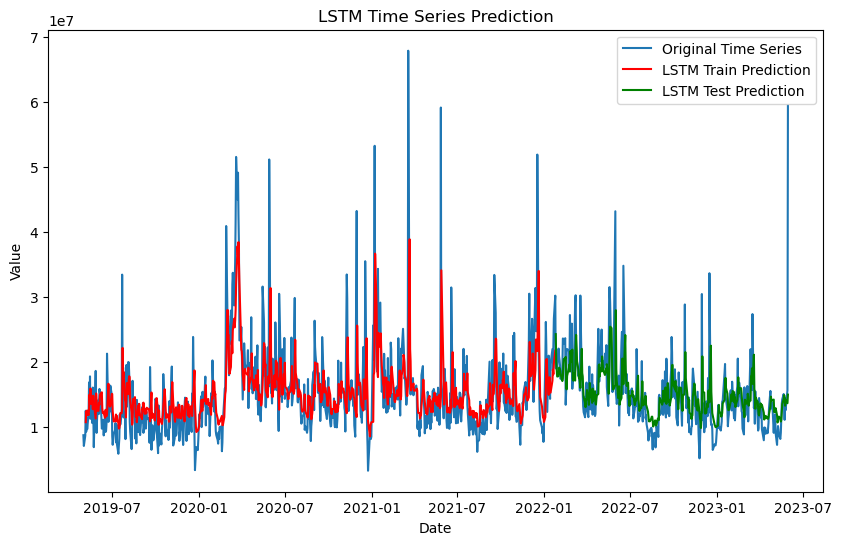

Epoch 1/10
686/686 - 5s - loss: 0.0087 - 5s/epoch - 7ms/step
Epoch 2/10
686/686 - 2s - loss: 0.0076 - 2s/epoch - 3ms/step
Epoch 3/10
686/686 - 2s - loss: 0.0072 - 2s/epoch - 3ms/step
Epoch 4/10
686/686 - 2s - loss: 0.0072 - 2s/epoch - 3ms/step
Epoch 5/10
686/686 - 2s - loss: 0.0069 - 2s/epoch - 3ms/step
Epoch 6/10
686/686 - 2s - loss: 0.0069 - 2s/epoch - 3ms/step
Epoch 7/10
686/686 - 3s - loss: 0.0070 - 3s/epoch - 4ms/step
Epoch 8/10
686/686 - 2s - loss: 0.0068 - 2s/epoch - 3ms/step
Epoch 9/10
686/686 - 2s - loss: 0.0069 - 2s/epoch - 3ms/step
Epoch 10/10
686/686 - 2s - loss: 0.0069 - 2s/epoch - 3ms/step
11/11 [==============================] - 0s 5ms/step


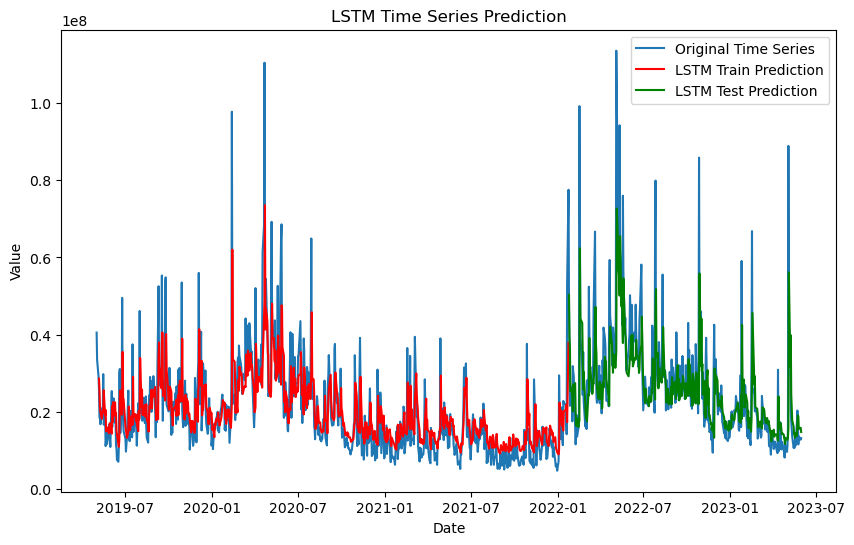

Epoch 1/10
686/686 - 5s - loss: 0.0079 - 5s/epoch - 7ms/step
Epoch 2/10
686/686 - 2s - loss: 0.0074 - 2s/epoch - 3ms/step
Epoch 3/10
686/686 - 2s - loss: 0.0069 - 2s/epoch - 3ms/step
Epoch 4/10
686/686 - 2s - loss: 0.0068 - 2s/epoch - 3ms/step
Epoch 5/10
686/686 - 2s - loss: 0.0067 - 2s/epoch - 3ms/step
Epoch 6/10
686/686 - 2s - loss: 0.0066 - 2s/epoch - 3ms/step
Epoch 7/10
686/686 - 2s - loss: 0.0066 - 2s/epoch - 3ms/step
Epoch 8/10
686/686 - 2s - loss: 0.0065 - 2s/epoch - 3ms/step
Epoch 9/10
686/686 - 2s - loss: 0.0066 - 2s/epoch - 3ms/step
Epoch 10/10
686/686 - 2s - loss: 0.0065 - 2s/epoch - 3ms/step
11/11 [==============================] - 0s 3ms/step


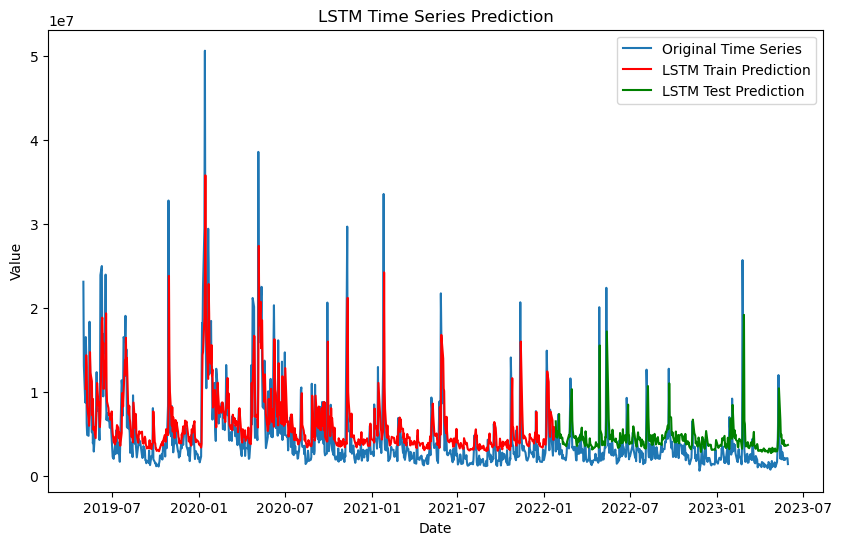

Epoch 1/10
686/686 - 4s - loss: 5.6453e-04 - 4s/epoch - 6ms/step
Epoch 2/10
686/686 - 2s - loss: 4.8278e-04 - 2s/epoch - 3ms/step
Epoch 3/10
686/686 - 2s - loss: 4.7804e-04 - 2s/epoch - 3ms/step
Epoch 4/10
686/686 - 2s - loss: 4.6746e-04 - 2s/epoch - 3ms/step
Epoch 5/10
686/686 - 1s - loss: 4.5865e-04 - 1s/epoch - 2ms/step
Epoch 6/10
686/686 - 2s - loss: 4.6109e-04 - 2s/epoch - 3ms/step
Epoch 7/10
686/686 - 1s - loss: 4.6152e-04 - 1s/epoch - 2ms/step
Epoch 8/10
686/686 - 1s - loss: 4.6263e-04 - 1s/epoch - 2ms/step
Epoch 9/10
686/686 - 1s - loss: 4.5897e-04 - 1s/epoch - 2ms/step
Epoch 10/10
686/686 - 1s - loss: 4.5898e-04 - 1s/epoch - 2ms/step
11/11 [==============================] - 0s 3ms/step


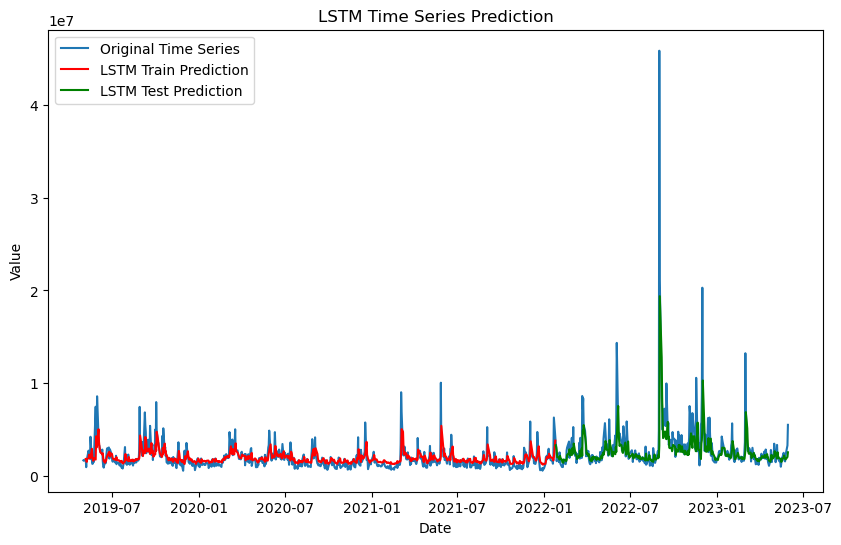

In [235]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense


def create_dataset(data, look_back=1):
    X, Y = [], []
    for i in range(len(data) - look_back):
        X.append(data[i:(i+look_back)])
        Y.append(data[i + look_back])
    return np.array(X), np.array(Y)



def lstm_prediction(data, look_back=1, epochs=100, batch_size=1):
    # Normalize the data using MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_normalized = scaler.fit_transform(data.reshape(-1, 1))

    # Create the dataset for LSTM
    X, Y = create_dataset(data_normalized, look_back)

    # Split the data into training and testing sets
    train_size = int(len(X) * 0.67)
    X_train, X_test = X[:train_size], X[train_size:]
    Y_train, Y_test = Y[:train_size], Y[train_size:]

    # Reshape the input data for LSTM (samples, time steps, features)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    # Build and train the LSTM model
    model = Sequential()
    model.add(LSTM(50, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size, verbose=2)

    # Make predictions with the LSTM model
    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)

    # Inverse transform the predictions to the original scale
    train_predict = scaler.inverse_transform(train_predict)
    test_predict = scaler.inverse_transform(test_predict)

    return train_predict, test_predict


RMSE_LSTM = []
for comp in companies:

    # Set the look-back window and other hyperparameters
    look_back = 3
    epochs = 10 # 100 originally
    batch_size = 1

    
    # Perform LSTM prediction
    train_predict, test_predict = lstm_prediction(time_series[comp].values, look_back, epochs, batch_size)

    #print("train:", train_predict)
    #print("test",data.index[look_back+len(test_predict):])
    
    RMSE_LSTM.append(rmse(test_predict,time_series[comp][look_back+len(train_predict):].values))
    
    # Plot the original data and LSTM predictions
    plt.figure(figsize=(10, 6))
    plt.plot(time_series[comp].index, time_series[comp], label='Original Time Series')
    plt.plot(time_series[comp].index[look_back:look_back+len(train_predict)], train_predict, label='LSTM Train Prediction', color='red')
    plt.plot(time_series[comp].index[look_back+len(train_predict):], test_predict, label='LSTM Test Prediction', color='green')
    
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('LSTM Time Series Prediction')
    plt.show()

    


### Summary

As seen above, the LSTM model has done a great job training on our data.
Despite our efforts, Exponential smoothing has produced better results than the LSTM model. 
Although the Test line, which represents the prediction results in each time series plot, exhibits impressive accuracy and ability to trace the actual data line of the same period. It is evident that the model struggled with the time series that had more spikes and fluctuations. 


In [236]:
result_of_comparison.loc[len(result_of_comparison)] = RMSE_LSTM 

methods = ["naive","seasonal naive","moving average","MAES","AR","exponential Smoothing","Lowess","ARIMA","LSTM"]
result_of_comparison.index = methods

result_of_comparison

,AAPL,MSFT,KO,SHOP,BYND,OKTA
naive,5.083146e+07,1.368333e+07,8.316687e+06,1.508324e+07,6.073303e+06,2.736679e+06
seasonal naive,7.113667e+07,1.762653e+07,1.078115e+07,1.966840e+07,7.215559e+06,2.419642e+06
moving average,3.389949e+07,9.341367e+06,5.521202e+06,9.793103e+06,3.370299e+06,1.731866e+06
MAES,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
AR,4.079367e+07,1.221551e+07,6.738192e+06,1.271050e+07,4.882129e+06,2.253834e+06
exponential Smoothing,2.762998e+07,7.469337e+06,4.636955e+06,8.414837e+06,3.121155e+06,1.541561e+06
Lowess,4.061690e+07,1.071169e+07,6.244808e+06,1.113150e+07,4.444338e+06,2.054281e+06
ARIMA,3.215436e+07,8.628873e+06,5.589698e+06,9.726845e+06,3.562793e+06,1.797649e+06
LSTM,3.039428e+07,1.339526e+07,6.561819e+06,1.882978e+07,3.347839e+06,3.600031e+06


## 8.2. Technical Trading Analysis

Technical Trading Analysis is a method traders use to predict future price movements based on historical market data, such as price and volume, and it is slightly different from the methods we have experimented with previously. One common approach is to use technical indicators to derive trading signals. In this example, we'll use the Moving Average Convergence Divergence (MACD) and Relative Strength Index (RSI) indicators to generate trading signals.

TTA Advantages:
Technical analysis is relatively straightforward, making it accessible to many traders, including beginners. It uses objective and quantifiable data, such as historical price and volume, rather than subjective factors like investor sentiment or emotions. It is particularly well-suited for short-term traders who seek to take advantage of short-term price movements and capture quick profits.

Technical analysis helps identify trends in price movements, which can provide valuable insights into potential trading opportunities. It helps traders determine optimal trade entry and exit points, maximizing potential gains and minimizing losses. It uses chart patterns and technical indicators to identify potential price reversals or continuation patterns, helping traders make informed decisions.

TTA Disadvantages:
Despite relying on objective data, technical analysis can still be subjective. Different analysts may interpret the same data differently, leading to varying conclusions and trading strategies.
It is based solely on historical price and volume data, which may not accurately reflect future market conditions. It does not consider fundamental factors or external events that could impact prices.
 Some technical indicators are lagging, providing signals after a trend has begun, potentially causing traders to miss the initial price movements.
Moreover, traders may sometimes overfit historical data by selecting indicators that work well only in the past but may need to perform better in the future, leading to unreliable predictions.


MACD - stands for Moving Average Convergence Divergence. It is a popular technical indicator used in financial markets to analyze price trends and identify potential trading opportunities. MACD is based on the difference between two moving averages of a security's price, usually a shorter and longer-term moving average.


Signal Line -The Signal Line in the context of the Moving Average Convergence Divergence (MACD) indicator is a 9-day Exponential Moving Average (EMA) of the MACD Line. The MACD Line is the difference between the short-term Exponential Moving Average (EMA) and the long-term EMA. The Signal Line acts as a trigger line and helps traders identify potential buy or sell signals.
When the MACD Line crosses above the Signal Line, it generates a bullish signal, indicating a potential buying opportunity. On the other hand, when the MACD Line crosses below the Signal Line, it generates a bearish signal, suggesting a potential selling opportunity.

The Signal Line helps smooth out the MACD Line and clearly indicates trend changes and momentum shifts. It is a valuable tool for traders using MACD to make informed decisions in the financial markets.

Upper Bollinger Band - The Bollinger Bands are a technical indicator created by John Bollinger. They consist of three lines: the Middle Bollinger Band, the Upper Bollinger Band, and the Lower Bollinger Band. The Middle Bollinger Band is typically a 20-day Simple Moving Average (SMA) of the price.
The Upper Bollinger Band is calculated by adding two standard deviations to the Middle Bollinger Band. It acts as an upper boundary or resistance level for the price movement. The Upper Bollinger Band represents a level above which the price is considered relatively high, and there may be a potential for a price reversal or pullback.

Traders often use Bollinger Bands to identify overbought conditions, where the price is near or above the Upper Bollinger Band, and oversold conditions, where the price is near or below the Lower Bollinger Band. The Upper Bollinger Band can be used to set profit targets for long positions or to consider potential short-selling opportunities.

Lower Bollinger Band - The Lower Bollinger Band is calculated by subtracting two standard deviations from the Middle Bollinger Band. It acts as a lower boundary or support level for the price movement. The Lower Bollinger Band represents a level below which the price is considered relatively low, and there may be a potential for a price rebound or bounce.
Like the Upper Bollinger Band, traders use the Lower Bollinger Band to identify oversold conditions and potential buying opportunities. When the price approaches or touches the Lower Bollinger Band, the price may have reached a support level and could bounce back upward.

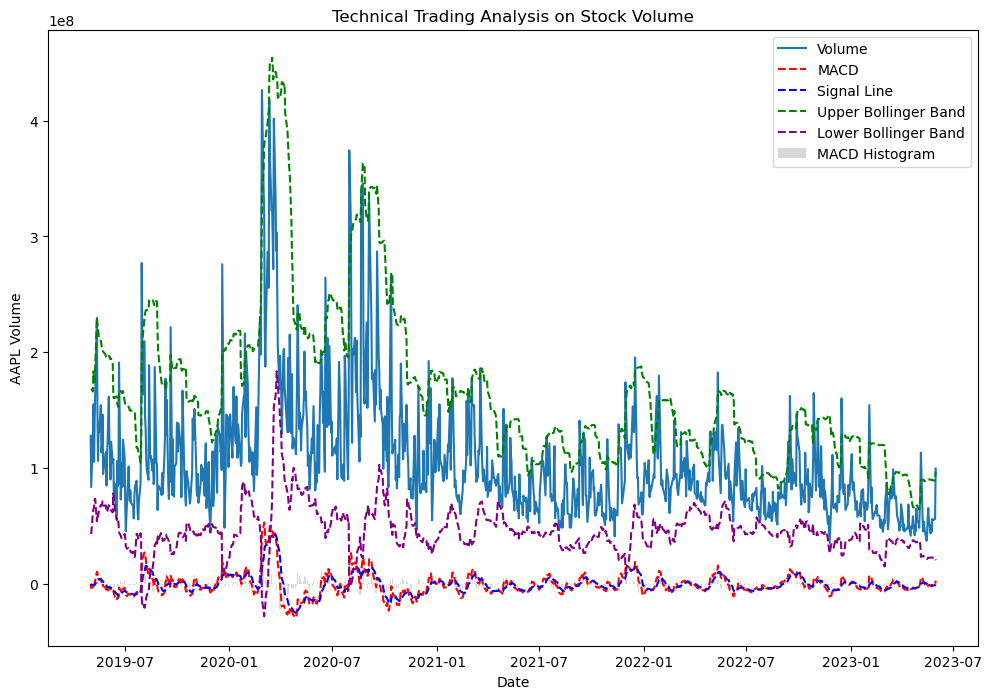

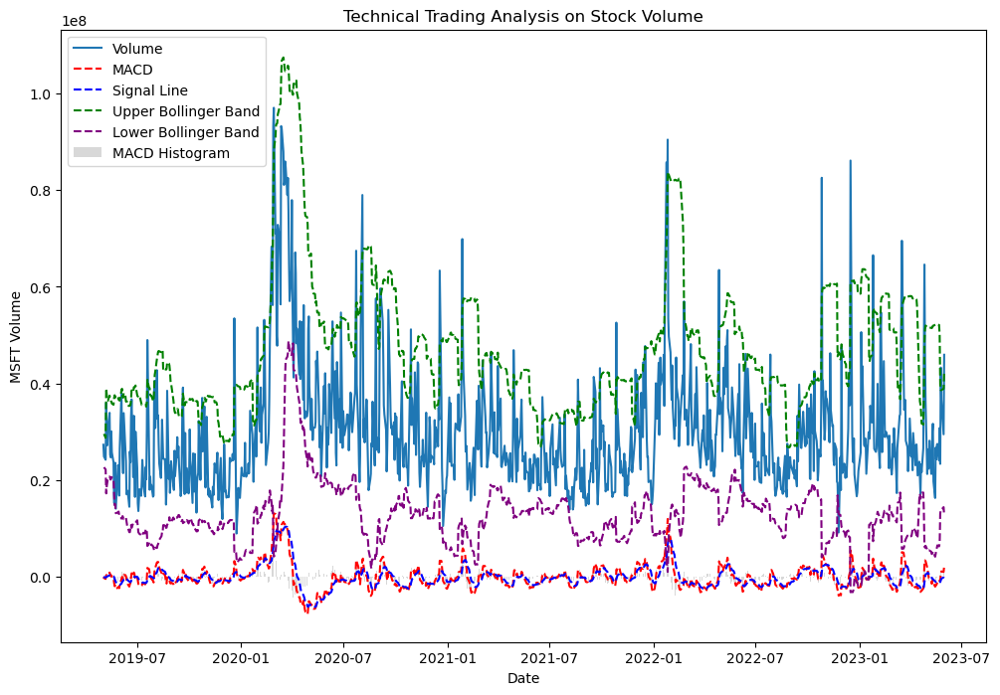

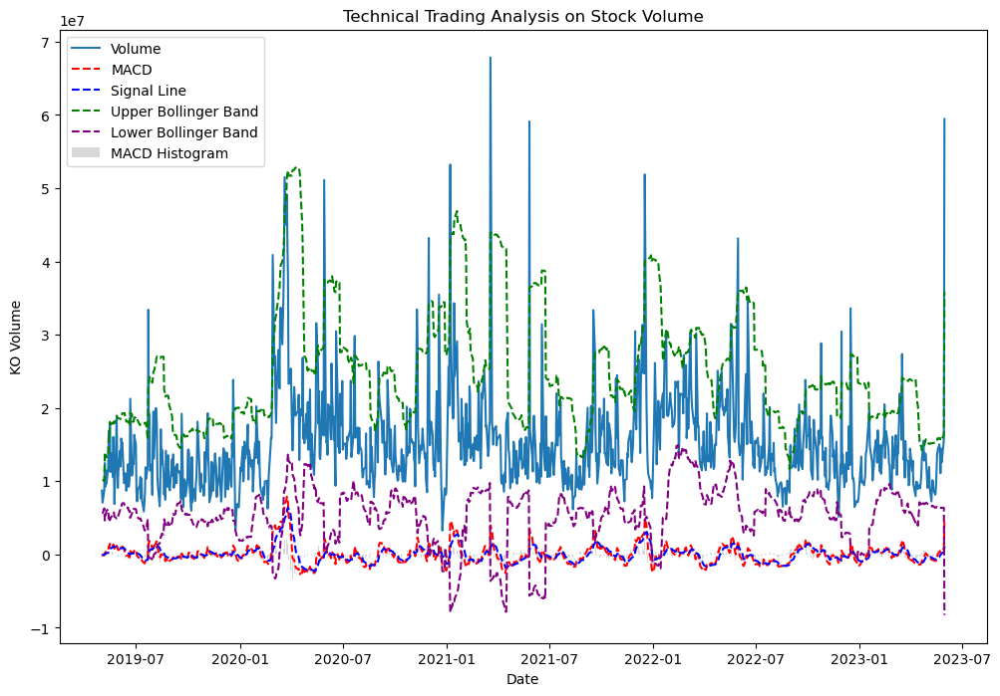

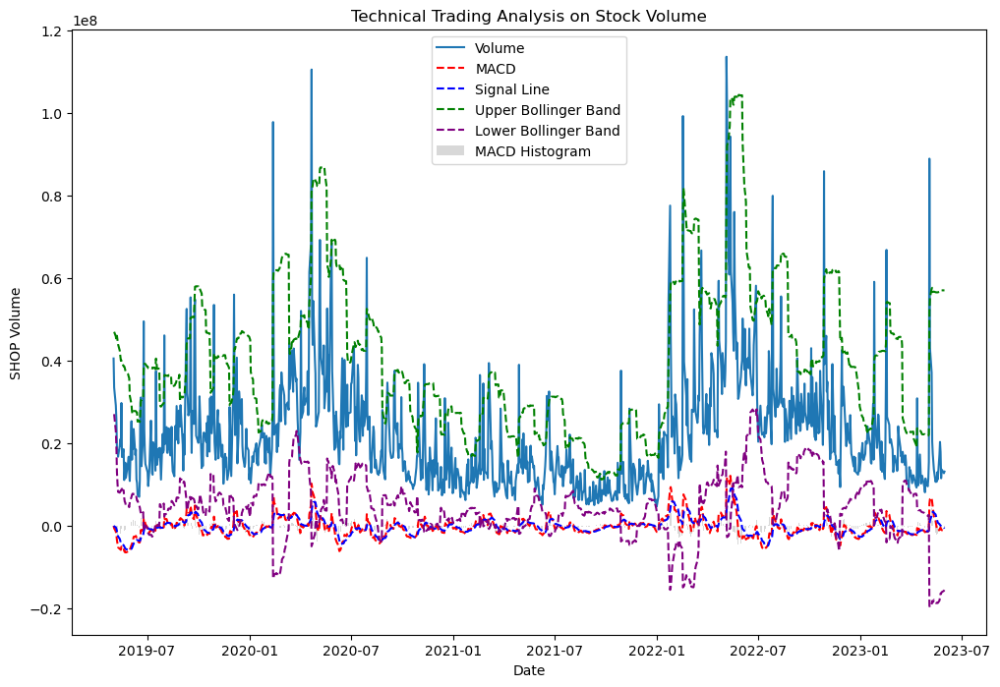

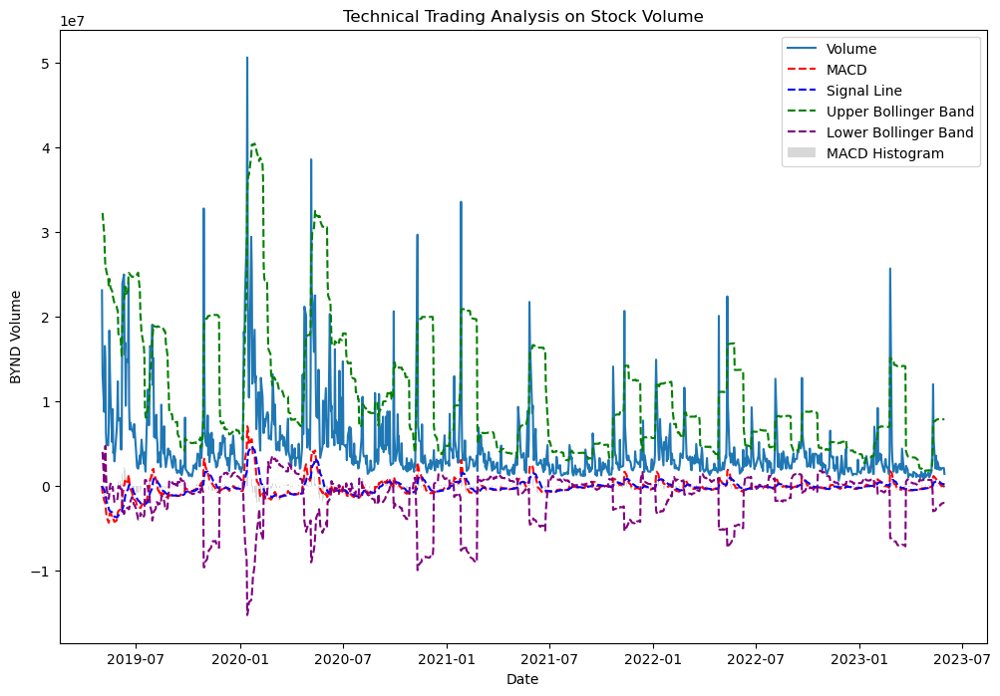

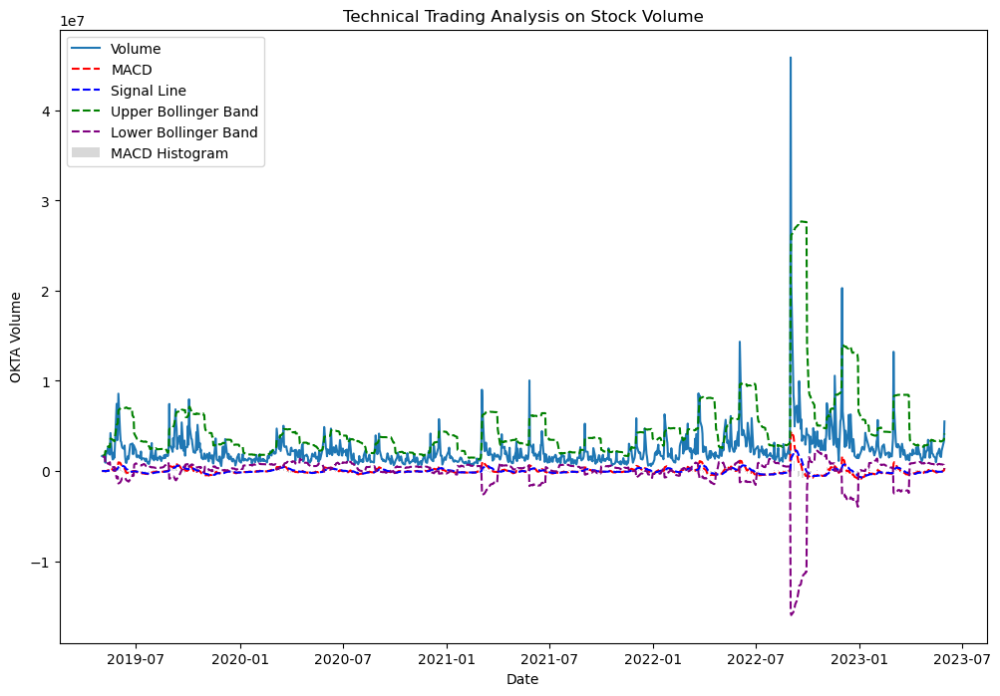

In [327]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def calculate_macd(data, short_window=12, long_window=26, signal_window=9):
    # Calculate the MACD line
    short_ema = data.ewm(span=short_window, min_periods=1, adjust=False).mean()
    long_ema = data.ewm(span=long_window, min_periods=1, adjust=False).mean()
    macd_line = short_ema - long_ema

    # Calculate the MACD signal line
    signal_line = macd_line.ewm(span=signal_window, min_periods=1, adjust=False).mean()

    # Calculate the MACD histogram
    macd_histogram = macd_line - signal_line

    return macd_line, signal_line, macd_histogram

def calculate_bollinger_bands(data, window=20, num_std=2):
    # Calculate the rolling mean and standard deviation
    rolling_mean = data.rolling(window=window, min_periods=1).mean()
    rolling_std = data.rolling(window=window, min_periods=1).std()

    # Calculate the upper and lower Bollinger Bands
    upper_band = rolling_mean + num_std * rolling_std
    lower_band = rolling_mean - num_std * rolling_std

    return upper_band, lower_band

def generate_signals(data,comp):
    # Calculate MACD and Bollinger Bands
    data['MACD'], data['Signal'], data['MACD_Histogram'] = calculate_macd(data)
    data['Upper_Band'], data['Lower_Band'] = calculate_bollinger_bands(data[comp])

    # Generate trading signals based on MACD and Bollinger Bands
    data['Signal_MACD'] = np.where(data['MACD'] > data['Signal'], 1, -1)
    data['Signal_Bollinger'] = np.where(data[comp] > data['Upper_Band'], -1,
                                       np.where(data[comp] < data['Lower_Band'], 1, 0))
    data['Signal_Total'] = data['Signal_MACD'] + data['Signal_Bollinger']

    return data


for comp in companies:
    # Perform technical trading analysis
    
    temp_comp_dat = time_series[comp] 
    data = generate_signals(temp_comp_dat.to_frame(),comp)
    
    #print(data)
    data["Date"] = time_series[comp].index
    
    # Plot the volume data, MACD, Bollinger Bands, and trading signals
    plt.figure(figsize=(12, 8))
    plt.plot(data.index, data[comp], label='Volume')
    plt.plot(data.index, data['MACD'], label='MACD', color='red', linestyle='--')
    plt.plot(data.index, data['Signal'], label='Signal Line', color='blue', linestyle='--')
    plt.bar(data.index, data['MACD_Histogram'], label='MACD Histogram', color='gray', alpha=0.3)
    plt.plot(data.index, data['Upper_Band'], label='Upper Bollinger Band', color='green', linestyle='--')
    plt.plot(data.index, data['Lower_Band'], label='Lower Bollinger Band', color='purple', linestyle='--')
    #plt.plot(data['Date'][data['Signal_Total'] == 1], data[comp][data['Signal_Total'] == 1], color='black', label='Buy Signal')
    #plt.plot(data['Date'][data['Signal_Total'] == -1], data[comp][data['Signal_Total'] == -1], color='orange', label='Sell Signal')
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel(f'{comp} Volume')
    plt.title(f'{comp} Technical Trading Analysis on Stock Volume')
    plt.show()


### Summary

We can see that the signal line almost traces the MACD line, which indicates that the model is accurately guiding the traders when it is the right time to trade the shares.
We can see several spots where the shares volume crossed the upper or lower Bollinger bands, which subsequently caused a move in the signal line. 
Technical Trading Analysis (TTA) performed well for short-term volume prediction, as it focuses on analyzing recent price and volume movements, providing insights for traders looking to capitalize on short-term opportunities, but in some cases, it generated false signals or overfit to historical data, especially where the data had severe spikes. Stock volume data can be noisy and influenced by various factors, making it challenging to identify reliable patterns consistently.

Overall the model's outcome is satisfying. 


# Conclusions

We have gained valuable insights into time series analysis and financial forecasting through our analysis and exploration of various forecasting techniques and trading strategies. We have examined methods such as naive, seasonal naive, moving average, exponential smoothing, ARIMA, LSTM, and Technical Trading Analysis. Each technique comes with its strengths and limitations. Naive methods provide simplicity but may lack accuracy, while more advanced methods like ARIMA and LSTM offer better forecasting capabilities at the cost of complexity. Technical Trading Analysis provides insights into market trends, but its success heavily relies on the choice of indicators and risk management. The Monte Carlo method has proven useful in assessing uncertainty and potential future trajectories. 

Ultimately, Exponential Smoothing resulted as the best algorithm for prediction. Understanding these approaches equips us with valuable tools to make data-driven decisions, empowering us to navigate the complexities of financial markets and time series data more effectively.

# References

Augmented Dickey-Fuller (ADF) test 
https://www.sciencedirect.com/science/article/abs/pii/0035505495900195


moving average
https://link.springer.com/chapter/10.1007/978-3-642-41947-8_4

exponential smoothing
https://www.researchgate.net/profile/Eva-Ostertagova/publication/256088917_The_Simple_Exponential_Smoothing_Model/links/0deec5219875cd78c7000000/The-Simple-Exponential-Smoothing-Model.pdf


Find multiplicativity using logs
https://mathscholar.org/2019/04/an-n-log-n-algorithm-for-multiplication/

cox-box
https://www.cambridge.org/core/journals/communications-in-computational-physics/article/abs/multiplicative-noise-removal-based-on-unbiased-boxcox-transformation/0D2CF51607A76DA1FD12DF03D4A77F60

seasonality
https://www.sciencedirect.com/science/article/abs/pii/S157407060501013X

seasonal adjustement
https://www.sciencedirect.com/science/article/abs/pii/S0169716183030059

naive
https://link.springer.com/article/10.1007/s13369-022-06819-0

RMSE
https://www.mdpi.com/2076-3417/11/5/2314

ACF and PACF
https://www.researchgate.net/figure/The-ACF-PACF-and-AIC-plots-of-Data-1_fig1_359648315

https://www.kaggle.com/code/iamleonie/time-series-interpreting-acf-and-pacf

https://towardsdatascience.com/interpreting-acf-and-pacf-plots-for-time-series-forecasting-af0d6db4061c

AR
https://www.researchgate.net/profile/Rafik_Karaman/post/How-can-I-convert-non-stationery-variables-into-stationery-using-SAS/attachment/59d623cf79197b80779821dd/AS%3A309268354404356%401450746729501/download/SAS+1.pdf

https://vitalflux.com/autoregressive-ar-models-with-python-examples/

https://towardsdatascience.com/how-to-use-an-autoregressive-ar-model-for-time-series-analysis-bb12b7831024

Monte carlo
https://link.springer.com/article/10.1007/BF02706251

https://towardsdatascience.com/how-to-create-a-monte-carlo-simulation-using-python-c24634a0978a

LOWESS
https://www.researchgate.net/publication/222850262_LOESS_a_nonparametric_graphical_tool_for_depicting_relationships_between_variables

https://towardsdatascience.com/lowess-regression-in-python-how-to-discover-clear-patterns-in-your-data-f26e523d7a35

https://aitechtrend.com/smoothing-out-the-noise-analyzing-data-with-lowess-regression-in-python/

https://www.statsmodels.org/devel/examples/notebooks/generated/lowess.html


FFT
https://towardsai.net/p/machine-learning/seasonality-detection-with-fast-fourier-transform-fft-and-python

https://docs.scipy.org/doc/scipy/tutorial/fft.html


ARIMA
https://www.researchgate.net/publication/328620139_ARIMA_Model_in_Predicting_Banking_Stock_Market_Data

https://www.projectpro.io/article/how-to-build-arima-model-in-python/544

LSTM
https://towardsdatascience.com/lstm-time-series-forecasting-predicting-stock-prices-using-an-lstm-model-6223e9644a2f

https://medium.com/the-handbook-of-coding-in-finance/stock-prices-prediction-using-long-short-term-memory-lstm-model-in-python-734dd1ed6827

https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/


Technical Trading Analysis
https://jfin-swufe.springeropen.com/articles/10.1186/s40854-018-0087-z

https://medium.com/geekculture/beginners-guide-to-technical-analysis-in-python-for-algorithmic-trading-19164fb6149


https://www.sciencedirect.com/science/article/abs/pii/0035505495900195

https://www.researchgate.net/publication/240917905_Additive_versus_multiplicative_parameters_-_applications_in_economics_and_finance


https://deepblue.lib.umich.edu/bitstream/handle/2027.42/135841/tpburke_1.pdf


https://www.researchgate.net/publication/44180803_Kernel_Density_Estimator_Methods_for_Monte_Carlo_Radiation_Transport


https://www.statsmodels.org/dev/examples/notebooks/generated/autoregressions.html


https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/